In [ ]:
import random, os, sys, warnings
warnings.filterwarnings("ignore")
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"



In [ ]:
# ── Reproducibility seeds (must come before TF/Keras import) ──
SEED = 42
random.seed(SEED)
import numpy as np
np.random.seed(SEED)
os.environ["PYTHONHASHSEED"] = str(SEED)

import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
from scipy.stats import norm



In [ ]:
import tensorflow as tf
tf.random.set_seed(SEED)

In [ ]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit

# ── Statsmodels ────────────────────────────────────────────────
import statsmodels.api as sm
from statsmodels.stats.diagnostic import het_arch, acorr_ljungbox

# ── Technical indicators ───────────────────────────────────────
!pip install ta
import ta

# ── GARCH library ──────────────────────────────────────────────
!pip install arch
from arch import arch_model

  Preparing metadata (setup.py) ... done
  Created wheel for ta: filename=ta-0.11.0-py3-none-any.whl size=29412 sha256=5d5ca8af9d67e883271cb9cb88b535cd16ef58c13f1b5d19cc26578c9d6f55be
  Stored in directory: /root/.cache/pip/wheels/5c/a1/5f/c6b85a7d9452057be4ce68a8e45d77ba34234a6d46581777c6
Successfully built ta
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.3/981.3 kB 13.8 MB/s eta 0:00:00


In [ ]:
# ── Keras layers ──────────────────────────────────────────────
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

DATA DOWNLOAD

In [ ]:
CRYPTOS = {
    'BTC-USD': 'Bitcoin',
    'ETH-USD': 'Ethereum',
    'SOL-USD': 'Solana',
    'BNB-USD': 'Binance Coin'
}

START = '2020-01-01'
END   = pd.Timestamp.today().strftime('%Y-%m-%d')   # FIX: dynamic end date

colours = {
  'BTC-USD': '#F7931A',
  'ETH-USD': '#627EEA',
  'SOL-USD': '#9945FF',
  'BNB-USD': '#F3BA2F'
}

In [ ]:
def load_crypto(ticker, start, end):
    """
    FIX F-03: Robust yfinance loader.
    Replaces synthetic_crypto() which was never defined.
    Handles MultiIndex columns returned by newer yfinance versions.
    """
    raw = yf.download(ticker, start=start, end=end, auto_adjust=True)
    if isinstance(raw.columns, pd.MultiIndex):
        raw.columns = raw.columns.droplevel(1)
    return raw



In [ ]:

raw_prices = {}
all_raw    = {}        # kept for factor-regression section
for ticker, name in CRYPTOS.items():
    data = load_crypto(ticker, START, END)
    raw_prices[ticker] = data['Close'].squeeze()
    all_raw[ticker]    = data
    print(f"  ✓ {name:15s} ({ticker})  |  {len(data)} trading days downloaded")

prices = pd.DataFrame(raw_prices).dropna(how='all')
print(f"\n  Date range: {prices.index[0].date()} → {prices.index[-1].date()}")
print(f"  Total rows: {len(prices)}\n")

[*********************100%***********************]  1 of 1 completed


  ✓ Bitcoin         (BTC-USD)  |  2265 trading days downloaded


[*********************100%***********************]  1 of 1 completed


  ✓ Ethereum        (ETH-USD)  |  2265 trading days downloaded


[*********************100%***********************]  1 of 1 completed


  ✓ Solana          (SOL-USD)  |  2165 trading days downloaded


[*********************100%***********************]  1 of 1 completed

  ✓ Binance Coin    (BNB-USD)  |  2265 trading days downloaded

  Date range: 2020-01-01 → 2026-03-13
  Total rows: 2264



LOG RETURNS & REALISED VOLATILITY     

In [ ]:
returns = 100 * np.log(prices / prices.shift(1)).dropna()
rv30 = returns.rolling(30).std() * np.sqrt(365)

In [ ]:
all_returns = {}
for ticker in CRYPTOS:
    all_returns[ticker] = (
        100 * np.log(all_raw[ticker]['Close']).diff()
    ).dropna()

In [ ]:
stats = returns.describe().T
stats['annualised_vol_%'] = returns.std() * np.sqrt(365)
stats['skewness']          = returns.skew()
stats['kurtosis']          = returns.kurtosis()
print(stats[['mean','std','min','max','annualised_vol_%','skewness','kurtosis']].round(3))

          mean    std     min     max  annualised_vol_%  skewness  kurtosis
BTC-USD  0.108  3.049 -17.405  17.182            58.250    -0.118     3.870
ETH-USD  0.119  4.108 -31.746  23.070            78.481    -0.220     4.798
SOL-USD  0.209  6.341 -54.958  38.718           121.142    -0.232     7.351
BNB-USD  0.179  4.172 -40.445  52.922            79.712     0.722    21.520


PRICE SERIES

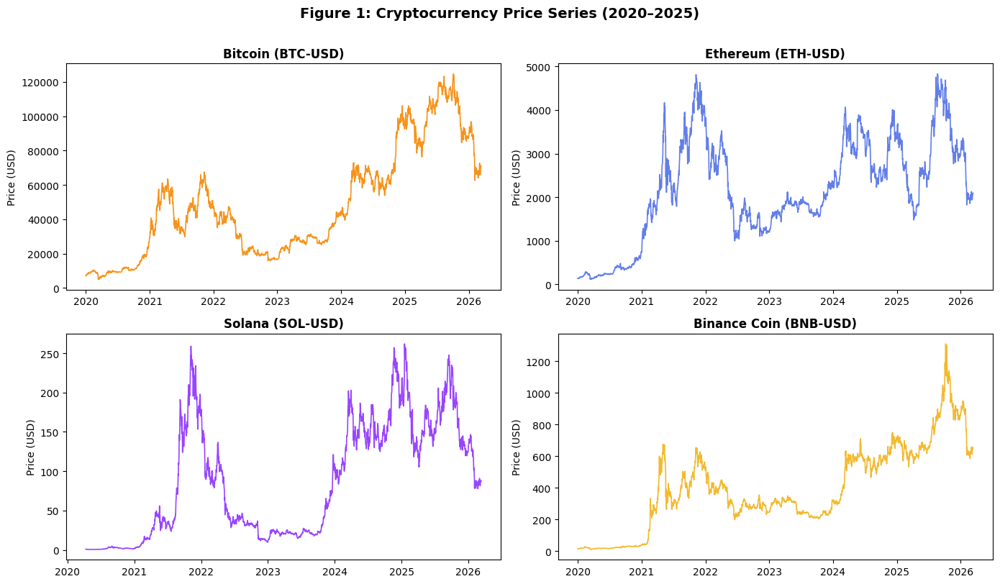

  ✓ Figure 1 saved: fig1_price_series.png


In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(14, 8))
axes = axes.flatten()
for i, (ticker, name) in enumerate(CRYPTOS.items()):
    ax = axes[i]
    ax.plot(prices.index, prices[ticker], color=colours[ticker], linewidth=1.2)
    ax.set_title(f'{name} ({ticker})', fontweight='bold', fontsize=12)
    ax.set_ylabel('Price (USD)')
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    ax.xaxis.set_major_locator(mdates.YearLocator())

fig.suptitle('Figure 1: Cryptocurrency Price Series (2020–2025)',
             fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('fig1_price_series.png', dpi=150, bbox_inches='tight')
plt.show()
print("  ✓ Figure 1 saved: fig1_price_series.png")

DAILY LOG RETURN (volatility clustering)

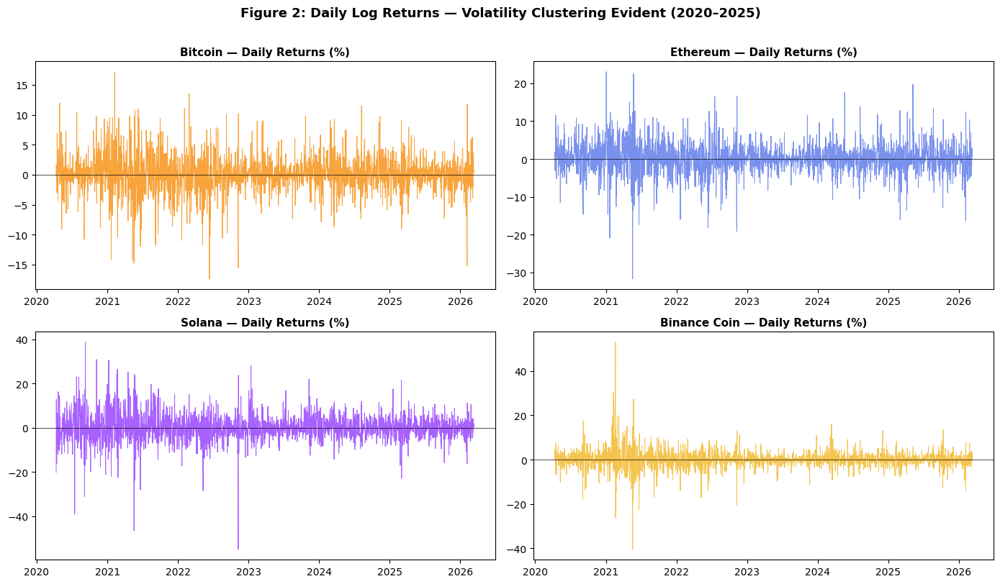

  ✓ Figure 2 saved: fig2_returns.png


In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(14, 8))
axes = axes.flatten()
for i, (ticker, name) in enumerate(CRYPTOS.items()):
    ax = axes[i]
    ax.plot(returns.index, returns[ticker],
            color=colours[ticker], linewidth=0.7, alpha=0.85)
    ax.axhline(0, color='black', linewidth=0.5)
    ax.set_title(f'{name} — Daily Returns (%)', fontweight='bold', fontsize=11)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    ax.xaxis.set_major_locator(mdates.YearLocator())

fig.suptitle('Figure 2: Daily Log Returns — Volatility Clustering Evident (2020–2025)',
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('fig2_returns.png', dpi=150, bbox_inches='tight')
plt.show()
print("  ✓ Figure 2 saved: fig2_returns.png")

30-DAY ROLLING REALISED VOLATILITY

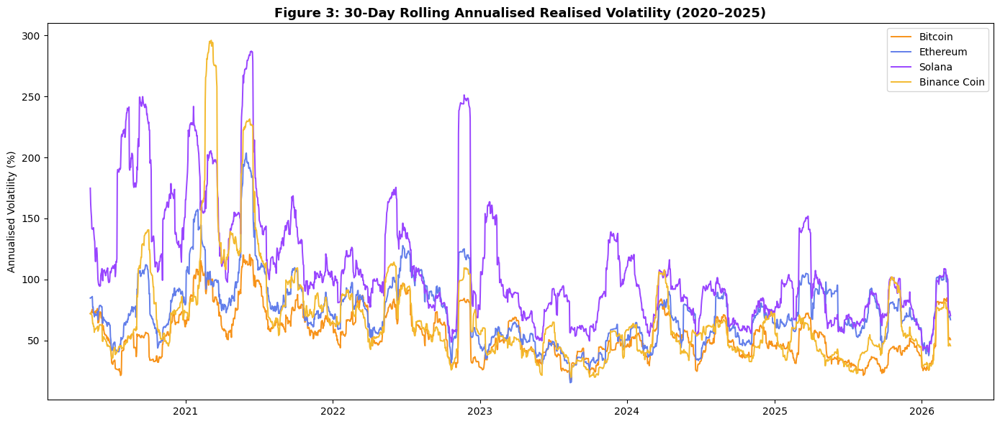

  ✓ Figure 3 saved: fig3_rolling_vol.png


In [ ]:
fig, ax = plt.subplots(figsize=(14, 6))
for ticker, name in CRYPTOS.items():
    ax.plot(rv30.index, rv30[ticker], label=f'{name}', # Realised Volatility, 30-day rolling window
            color=colours[ticker], linewidth=1.4)

ax.set_title('Figure 3: 30-Day Rolling Annualised Realised Volatility (2020–2025)',
             fontsize=13, fontweight='bold')
ax.set_ylabel('Annualised Volatility (%)')
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.legend(loc='upper right')
plt.tight_layout()
plt.savefig('fig3_rolling_vol.png', dpi=150, bbox_inches='tight')
plt.show()
print("  ✓ Figure 3 saved: fig3_rolling_vol.png")

CORRELATION HEATMAP

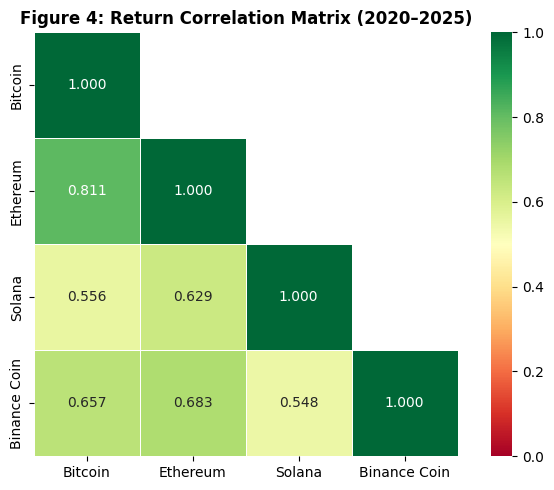

  ✓ Figure 4 saved: fig4_correlation.png


In [ ]:
corr_matrix = returns.corr()
corr_matrix.columns = [CRYPTOS[t] for t in corr_matrix.columns]
corr_matrix.index   = [CRYPTOS[t] for t in corr_matrix.index]

fig, ax = plt.subplots(figsize=(7, 5))
# FIX F-05: mask must be passed to sns.heatmap (was computed but ignored)
mask = np.triu(np.ones_like(corr_matrix, dtype=bool), k=1)
sns.heatmap(corr_matrix, annot=True, fmt='.3f', cmap='RdYlGn',
            mask=mask,                           # ← now applied
            vmin=0, vmax=1, ax=ax, linewidths=0.5, square=True)
ax.set_title('Figure 4: Return Correlation Matrix (2020–2025)',
             fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig('fig4_correlation.png', dpi=150, bbox_inches='tight')
plt.show()
print("  ✓ Figure 4 saved: fig4_correlation.png")

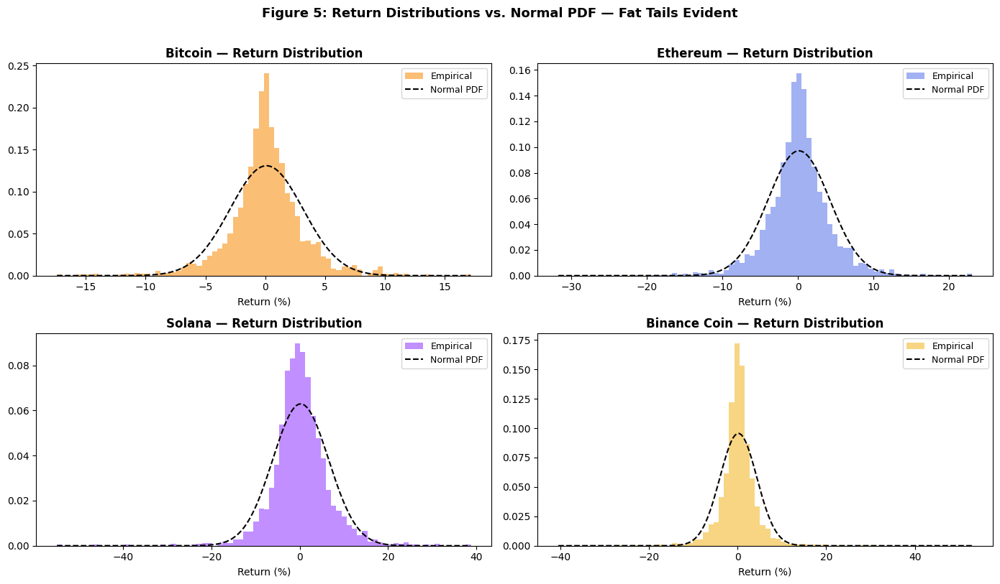

  ✓ Figure 5 saved: fig5_distributions.png


In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(14, 8))
axes = axes.flatten()
for i, (ticker, name) in enumerate(CRYPTOS.items()):
    ax = axes[i]
    r  = returns[ticker].dropna()
    ax.hist(r, bins=80, density=True, color=colours[ticker], alpha=0.6, label='Empirical')
    x = np.linspace(r.min(), r.max(), 200)
    ax.plot(x, norm.pdf(x, r.mean(), r.std()), 'k--', linewidth=1.5, label='Normal PDF')
    ax.set_title(f'{name} — Return Distribution', fontweight='bold')
    ax.set_xlabel('Return (%)')
    ax.legend(fontsize=9)

fig.suptitle('Figure 5: Return Distributions vs. Normal PDF — Fat Tails Evident',
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('fig5_distributions.png', dpi=150, bbox_inches='tight')
plt.show()
print("  ✓ Figure 5 saved: fig5_distributions.png")


# MODEL 1: GARCH(1,1) / EGARCH + SKEWED-T   

RETURN DISTRIBUTION (fat tails)

In [ ]:
garch_results = {}
garch_vol     = {}

for ticker, name in CRYPTOS.items():
    r    = all_returns[ticker]
    r_dm = (r - r.mean())                         # demeaned returns

    # FIX F-12: EGARCH + skewt — best specification for crypto
    gm  = arch_model(r_dm.dropna(), p=1, q=1,
                     mean='zero',                  # zero mean (appropriate for demeaned)
                     vol='EGARCH',                 # asymmetric — handles leverage effect
                     dist='skewt')                 # fat tails + skewness

    # FIX F-01/F-02: fit FIRST, then print summary
    res = gm.fit(disp='off')
    print(f"\n  {name} ({ticker})")
    print(res.summary())

    garch_results[ticker] = res
    # FIX F-04: annualise with √365
    garch_vol[ticker] = res.conditional_volatility * np.sqrt(365)

    print(f"    alpha+beta (persistence) ≈ "
          f"{res.params.get('alpha[1]', res.params.iloc[1]):.4f}")
    print(f"    AIC = {res.aic:.2f}  |  BIC = {res.bic:.2f}")

    # ── GARCH diagnostic tests ──
    std_resid = res.resid / res.conditional_volatility
    lb = acorr_ljungbox(std_resid**2, lags=10, return_df=True)
    _, arch_p, _, _ = het_arch(std_resid.dropna(), nlags=5)
    print(f"    Ljung-Box p (lag 10): {lb['lb_pvalue'].iloc[-1]:.4f}  "
          f"{'✓ no ARCH left' if lb['lb_pvalue'].iloc[-1] > 0.05 else '⚠ residual ARCH'}")
    print(f"    ARCH-LM p:            {arch_p:.4f}  "
          f"{'✓ adequate fit' if arch_p > 0.05 else '⚠ check model order'}")

garch_vol_df = pd.DataFrame(garch_vol)



  Bitcoin (BTC-USD)
                             Zero Mean - EGARCH Model Results                            
Dep. Variable:                             Close   R-squared:                       0.000
Mean Model:                            Zero Mean   Adj. R-squared:                  0.000
Vol Model:                                EGARCH   Log-Likelihood:               -5463.37
Distribution:      Standardized Skew Student's t   AIC:                           10936.7
Method:                       Maximum Likelihood   BIC:                           10965.4
                                                   No. Observations:                 2263
Date:                           Sat, Mar 14 2026   Df Residuals:                     2263
Time:                                   19:01:57   Df Model:                            0
                             Volatility Model                             
                 coef    std err          t      P>|t|    95.0% Conf. Int.
-------------------

GARCH MODEL RESIDUALS DISTRIBUTION


  GARCH MODEL RESIDUALS DISTRIBUTION


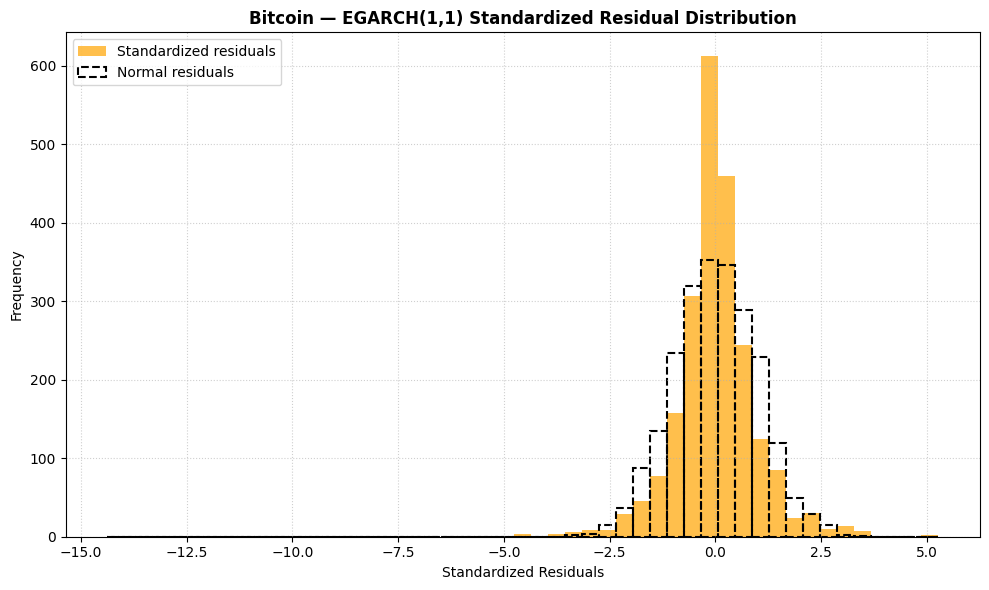

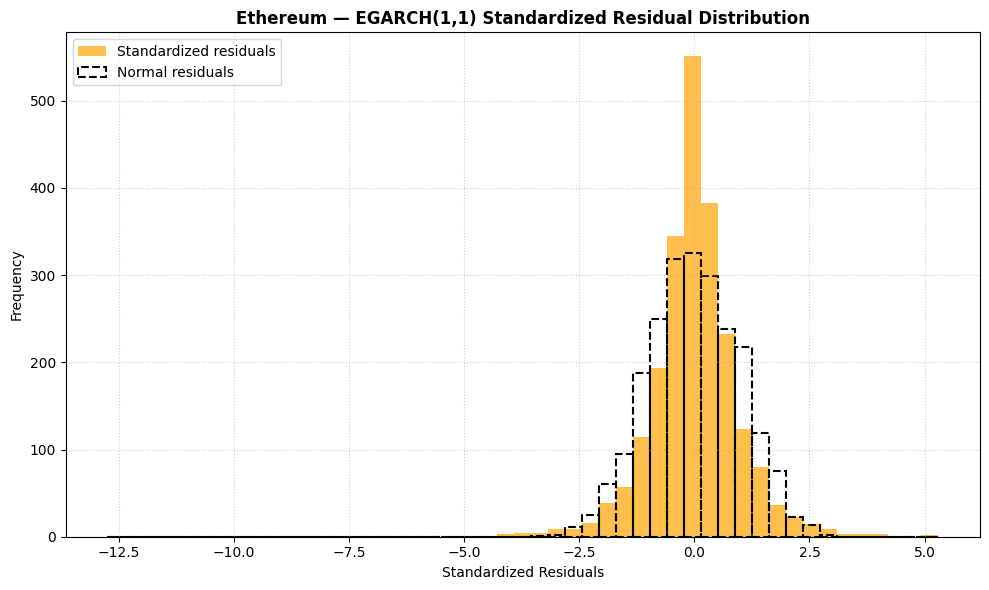

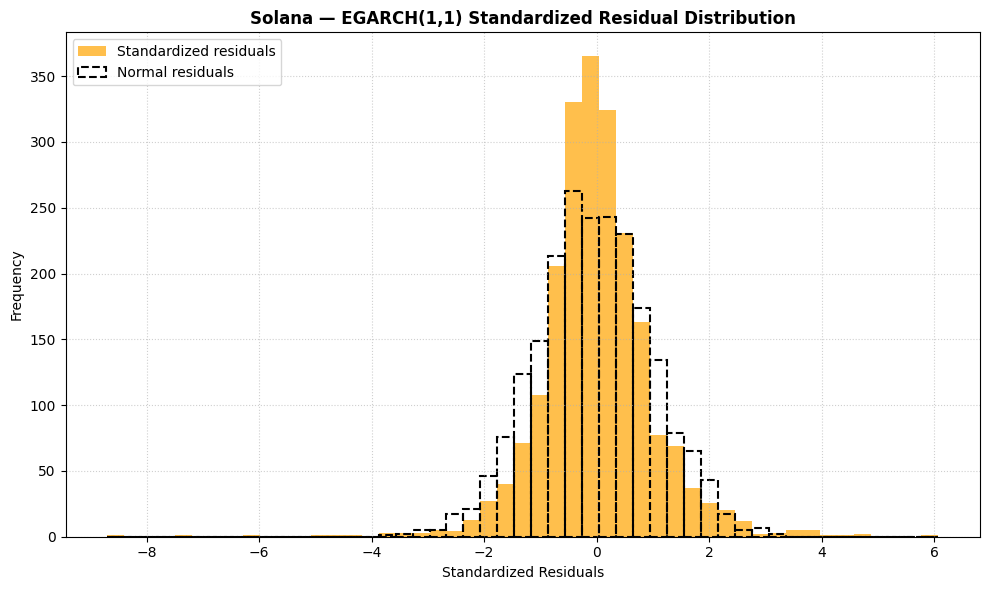

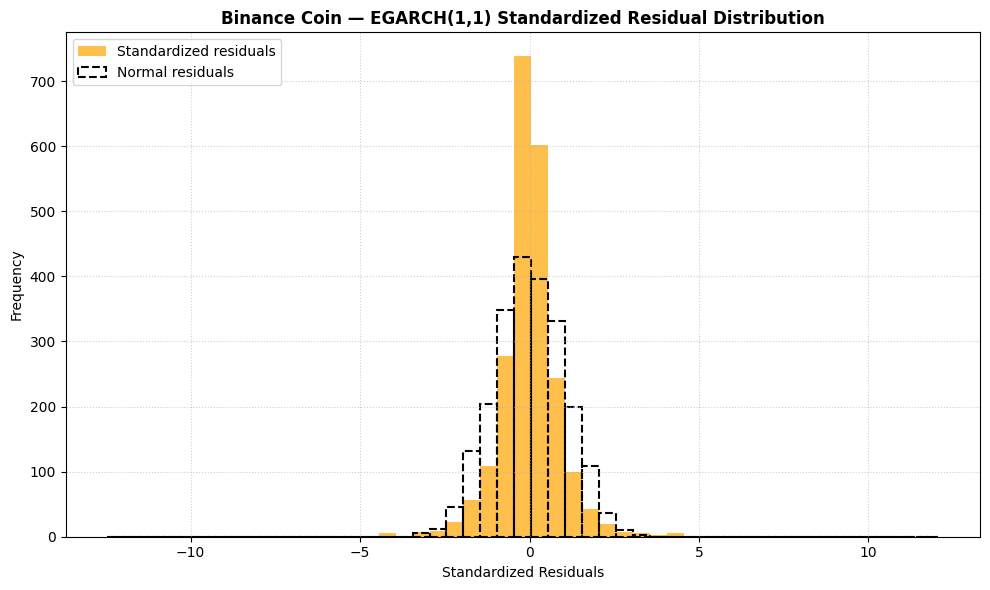

In [ ]:
print("\n" + "=" * 65)
print("  GARCH MODEL RESIDUALS DISTRIBUTION")
print("=" * 65)

for ticker, name in CRYPTOS.items():
    gm_result    = garch_results[ticker]
    gm_resid     = gm_result.resid
    gm_std       = gm_resid.std()
    gm_std_resid = gm_resid / gm_std

    normal_resid = np.random.randn(gm_std_resid.size)

    left  = min(gm_std_resid.min(), normal_resid.min())
    right = max(gm_std_resid.max(), normal_resid.max())
    bins  = np.linspace(left, right, 50)

    plt.figure(figsize=(10, 6))
    plt.hist(gm_std_resid, bins=bins, facecolor='orange',
             label='Standardized residuals', alpha=0.7)
    plt.hist(normal_resid, bins=bins, facecolor='none',
             label='Normal residuals', edgecolor='black',
             linestyle='--', linewidth=1.5)
    plt.title(f'{name} — EGARCH(1,1) Standardized Residual Distribution',
              fontweight='bold', fontsize=12)
    plt.xlabel('Standardized Residuals')
    plt.ylabel('Frequency')
    plt.legend(loc='upper left')
    plt.grid(True, linestyle=':', alpha=0.6)
    plt.tight_layout()
    plt.show()

CONDITIONAL VOL vs REALISED VOL

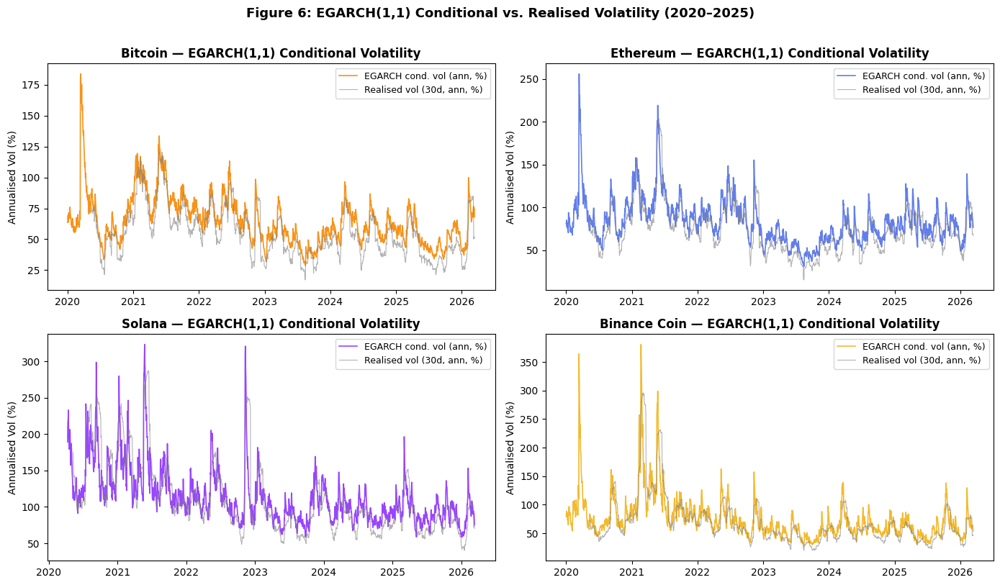

  ✓ Figure 6 saved: fig6_garch_vol.png


In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(14, 8))
axes = axes.flatten()
for i, (ticker, name) in enumerate(CRYPTOS.items()):
    ax = axes[i]
    ax.plot(garch_vol_df.index, garch_vol_df[ticker],
            color=colours[ticker], linewidth=1.2, label='EGARCH cond. vol (ann, %)')
    ax.plot(rv30.index, rv30[ticker],
            color='gray', linewidth=0.8, alpha=0.6, label='Realised vol (30d, ann, %)')
    ax.set_title(f'{name} — EGARCH(1,1) Conditional Volatility', fontweight='bold')
    ax.set_ylabel('Annualised Vol (%)')
    ax.legend(fontsize=9)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

fig.suptitle('Figure 6: EGARCH(1,1) Conditional vs. Realised Volatility (2020–2025)',
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('fig6_garch_vol.png', dpi=150, bbox_inches='tight')
plt.show()
print("  ✓ Figure 6 saved: fig6_garch_vol.png")

COMPARE GARCH — interactive plotly view

In [ ]:
try:
    import plotly.express as px
    for ticker, name in CRYPTOS.items():
        gm_result   = garch_results[ticker]
        stock_garch = returns[ticker].copy().to_frame(name='returns')
        stock_garch['cond_vol'] = pd.Series(
            gm_result.conditional_volatility,
            index=stock_garch.index
        )
        stock_garch = stock_garch.dropna()
        garch_plot  = px.line(stock_garch,
                              title=f'EGARCH Conditional Volatility — {name}',
                              width=1600, height=800)
        garch_plot.update_layout(showlegend=True)
        garch_plot.show()
except ImportError:
    print("  ⚠ plotly not installed — skipping interactive chart")


5-PERIOD AHEAD GARCH FORECAST

In [ ]:
for ticker, name in CRYPTOS.items():
    print(f"\n{'='*65}")
    print(f"  GARCH FORECAST — {name}")
    print(f"{'='*65}")

    # Use simulation for horizon > 1
    np.random.seed(SEED) # ensures same simulation paths every run
    gm_forecast = garch_results[ticker].forecast(horizon=5, method='simulation', simulations=1000)

    print(f"\n  5-Day Variance Forecast — {name}:")
    print(gm_forecast.variance.iloc[-1:])

    print(f"\n  5-Day Volatility Forecast (√variance, ann. %) — {name}:")
    # FIX F-04: use √365
    print(np.sqrt(gm_forecast.variance.iloc[-1:] * 365))


  GARCH FORECAST — Bitcoin

  5-Day Variance Forecast — Bitcoin:
                  h.1        h.2       h.3        h.4        h.5
Date                                                            
2026-03-13  11.763271  11.788876  11.98015  12.156962  12.636031

  5-Day Volatility Forecast (√variance, ann. %) — Bitcoin:
                 h.1        h.2        h.3        h.4        h.5
Date                                                            
2026-03-13  65.52552  65.596796  66.126807  66.612996  67.912822

  GARCH FORECAST — Ethereum

  5-Day Variance Forecast — Ethereum:
                  h.1       h.2        h.3        h.4        h.5
Date                                                            
2026-03-13  14.766163  14.91062  15.103832  15.399898  15.529189

  5-Day Volatility Forecast (√variance, ann. %) — Ethereum:
                  h.1        h.2        h.3        h.4        h.5
Date                                                             
2026-03-13  73.414231  73.77

In [ ]:
for ticker, name in CRYPTOS.items():
    print(f"\n{'='*65}")
    print(f"  GARCH FORECAST — {name}")
    print(f"{'='*65}")

    # FIX: EGARCH requires method='simulation' for horizon > 1
    np.random.seed(SEED)   # ensures same simulation paths every run
    gm_forecast = garch_results[ticker].forecast(
        horizon=5,
        method='simulation',
        simulations=1000
    )

    print(f"\n  5-Day Variance Forecast — {name}:")
    print(gm_forecast.variance.iloc[-1:])

    print(f"\n  5-Day Volatility Forecast (√variance, ann. %) — {name}:")
    # FIX F-04: use √365
    print(np.sqrt(gm_forecast.variance.iloc[-1:] * 365))


  GARCH FORECAST — Bitcoin

  5-Day Variance Forecast — Bitcoin:
                  h.1        h.2        h.3        h.4        h.5
Date                                                             
2026-03-13  11.763271  11.955124  11.925937  11.905454  11.975525

  5-Day Volatility Forecast (√variance, ann. %) — Bitcoin:
                 h.1        h.2       h.3        h.4        h.5
Date                                                           
2026-03-13  65.52552  66.057703  65.97702  65.920336  66.114042

  GARCH FORECAST — Ethereum

  5-Day Variance Forecast — Ethereum:
                  h.1        h.2        h.3        h.4        h.5
Date                                                             
2026-03-13  14.766163  15.033463  15.307037  15.516973  15.792523

  5-Day Volatility Forecast (√variance, ann. %) — Ethereum:
                  h.1        h.2        h.3        h.4        h.5
Date                                                             
2026-03-13  73.414231  74

GARCH ROLLING 1-STEP FORECASTS

In [ ]:
print("\n  Computing GARCH rolling out-of-sample forecasts (2024+)...")
garch_oos = {}

for ticker, name in CRYPTOS.items():
    r       = all_returns[ticker]
    index   = r.index
    # Start OOS from 2024-01-01
    end_loc   = np.where(index >= '2024-01-01')[0].min()
    n_periods = len(index) - end_loc

    forecasts = {}
    gm = arch_model(r, p=1, q=1, mean='zero', vol='EGARCH', dist='skewt')

    for i in range(n_periods):
        # FIX F-06: first_obs=0 — expanding window retains crisis data
        res_i = gm.fit(first_obs=0, last_obs=end_loc + i, disp='off')
        temp  = res_i.forecast(horizon=1).variance
        fcast = temp.iloc[0]
        forecasts[fcast.name] = fcast
        sys.stdout.write(".")
    print()

    fc_df = pd.DataFrame(forecasts).T
    # FIX F-04: √365
    garch_oos[ticker] = np.sqrt(fc_df['h.1'] * 365)
    print(f"    ✓ {name}")


  Computing GARCH rolling out-of-sample forecasts (2024+)...
...................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................
    ✓ Bitcoin
........................................................................................................................

Plot rolling GARCH forecast vs realised vol

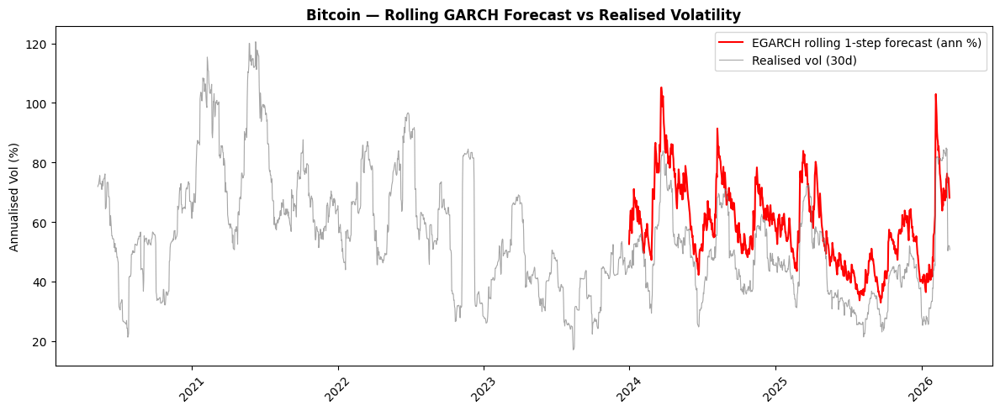

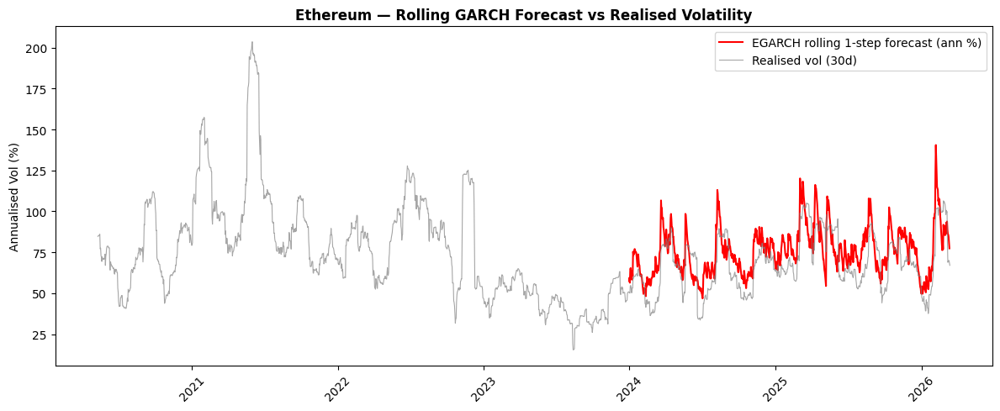

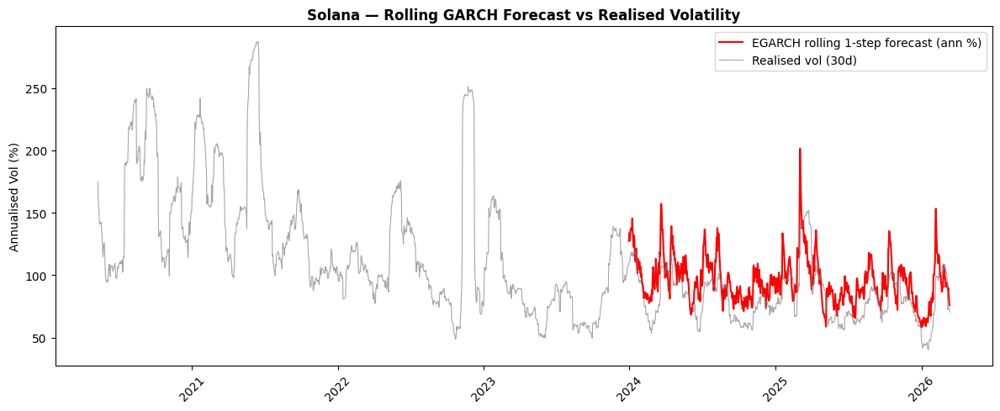

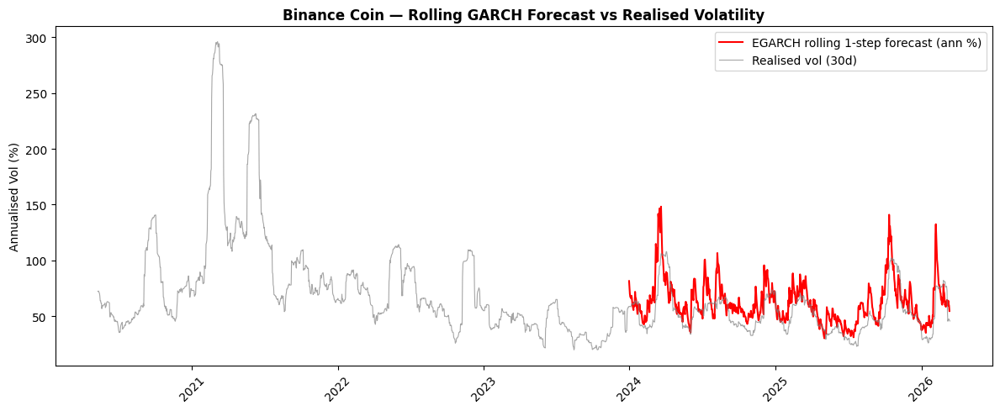

In [ ]:
for ticker, name in CRYPTOS.items():
    plt.figure(figsize=(12, 5))
    plt.plot(garch_oos[ticker].index, garch_oos[ticker],
             color='red',   label='EGARCH rolling 1-step forecast (ann %)')
    plt.plot(rv30.index, rv30[ticker],
             color='gray', alpha=0.7, linewidth=0.8, label='Realised vol (30d)')
    plt.title(f'{name} — Rolling GARCH Forecast vs Realised Volatility',
              fontweight='bold')
    plt.ylabel('Annualised Vol (%)')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

VOLATILITY COMPARISON                          ║
# ║  Realised vs EGARCH vs Factor Regression (OLS + Rolling OLS

In [ ]:
from statsmodels.regression.rolling import RollingOLS
from sklearn.linear_model import RidgeCV
from sklearn.preprocessing import StandardScaler


  VOLATILITY COMPARISON — Bitcoin
                            OLS Regression Results                            
Dep. Variable:             rv30_ann_%   R-squared:                       0.370
Model:                            OLS   Adj. R-squared:                  0.368
Method:                 Least Squares   F-statistic:                     41.87
Date:                Sat, 14 Mar 2026   Prob (F-statistic):           2.72e-41
Time:                        19:06:05   Log-Likelihood:                -9729.0
No. Observations:                2204   AIC:                         1.947e+04
Df Residuals:                    2198   BIC:                         1.950e+04
Df Model:                           5                                         
Covariance Type:                  HAC                                         
                            coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------

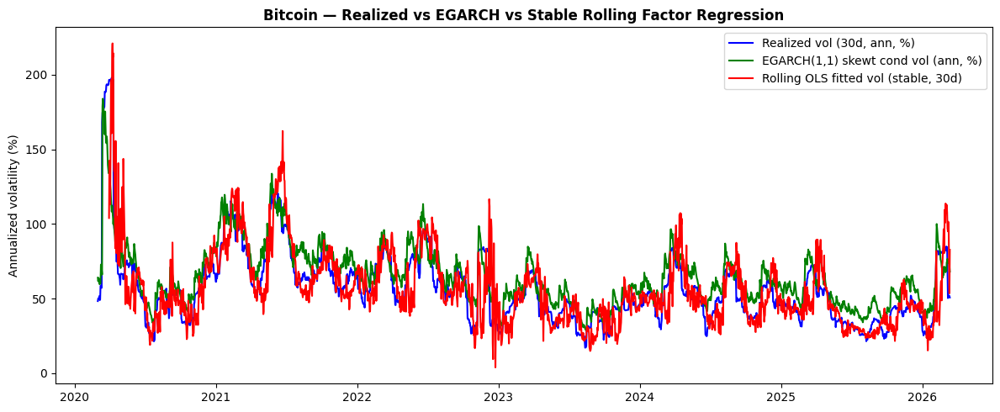


Top 10 worst rolling condition numbers — Bitcoin:
Date
2022-12-08    15.424852
2022-12-07    14.813818
2022-12-06    14.479313
2022-12-05    13.201297
2022-12-04    13.063508
2022-12-03    12.579403
2022-12-02    12.407430
2022-11-29    12.067764
2022-12-01    11.964150
2022-11-30    11.949676
Name: roll_cond, dtype: float64

  VOLATILITY COMPARISON — Ethereum
                            OLS Regression Results                            
Dep. Variable:             rv30_ann_%   R-squared:                       0.425
Model:                            OLS   Adj. R-squared:                  0.423
Method:                 Least Squares   F-statistic:                     40.12
Date:                Sat, 14 Mar 2026   Prob (F-statistic):           1.51e-46
Time:                        19:06:15   Log-Likelihood:                -10218.
No. Observations:                2204   AIC:                         2.045e+04
Df Residuals:                    2197   BIC:                         2.049e+04
Df M

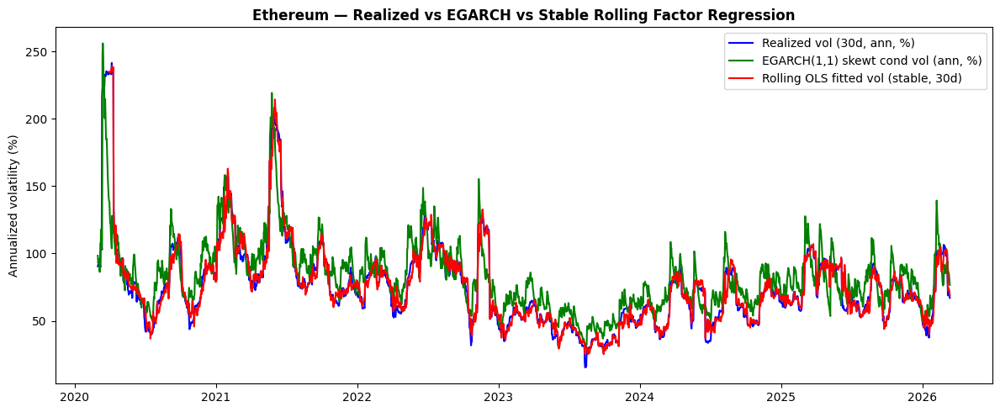


Top 10 worst rolling condition numbers — Ethereum:
Date
2020-04-17    19.332322
2020-04-16    18.384880
2020-04-15    17.033291
2020-04-14    15.613169
2020-04-13    13.370263
2022-05-12    12.628811
2020-04-12    12.354038
2022-10-30    11.001065
2022-11-02    10.902659
2022-10-29    10.889676
Name: roll_cond, dtype: float64

  VOLATILITY COMPARISON — Solana
                            OLS Regression Results                            
Dep. Variable:             rv30_ann_%   R-squared:                       0.481
Model:                            OLS   Adj. R-squared:                  0.480
Method:                 Least Squares   F-statistic:                     65.28
Date:                Sat, 14 Mar 2026   Prob (F-statistic):           1.44e-74
Time:                        19:06:28   Log-Likelihood:                -10474.
No. Observations:                2104   AIC:                         2.096e+04
Df Residuals:                    2097   BIC:                         2.100e+04
Df Mo

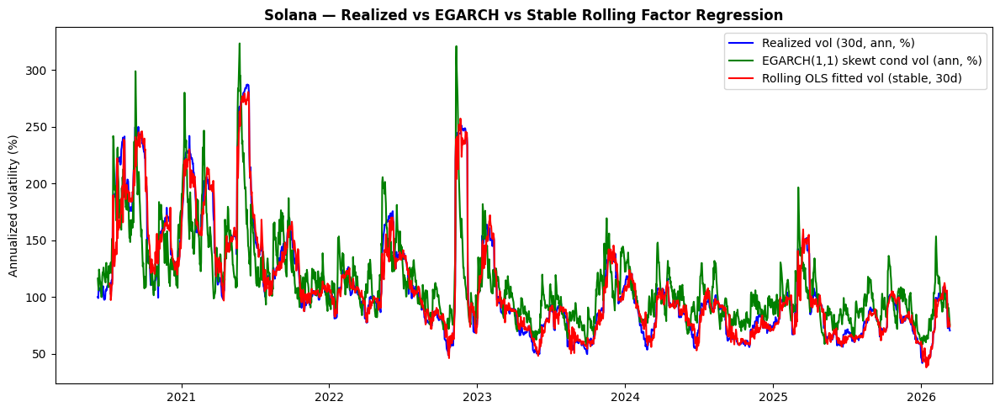


Top 10 worst rolling condition numbers — Solana:
Date
2022-12-08    18.623953
2021-08-21    14.514239
2022-05-12    14.177776
2023-07-14    14.150562
2023-07-15    14.078719
2023-07-16    13.894263
2021-08-20    13.796180
2022-12-07    13.761304
2023-07-17    13.498595
2021-08-19    13.014655
Name: roll_cond, dtype: float64

  VOLATILITY COMPARISON — Binance Coin
                            OLS Regression Results                            
Dep. Variable:             rv30_ann_%   R-squared:                       0.475
Model:                            OLS   Adj. R-squared:                  0.474
Method:                 Least Squares   F-statistic:                     35.01
Date:                Sat, 14 Mar 2026   Prob (F-statistic):           1.29e-40
Time:                        19:06:48   Log-Likelihood:                -10806.
No. Observations:                2204   AIC:                         2.163e+04
Df Residuals:                    2197   BIC:                         2.167e+04
D

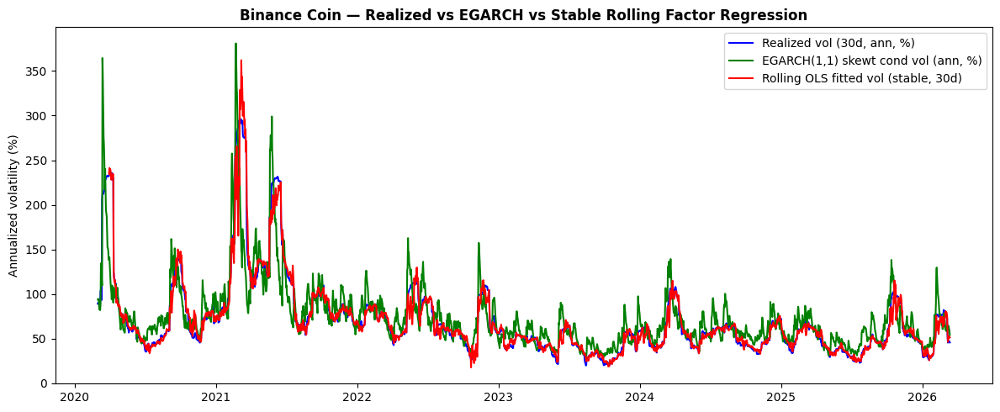


Top 10 worst rolling condition numbers — Binance Coin:
Date
2021-02-10    16.761048
2024-04-11    14.993395
2021-03-20    14.888517
2021-02-11    14.279839
2021-02-15    14.083041
2021-02-13    13.995102
2021-02-12    13.976502
2021-02-14    13.749414
2024-04-10    12.821288
2021-02-18    12.550425
Name: roll_cond, dtype: float64


In [ ]:
window = 30


def rolling_ols_predict(y, X, window, min_std=1e-10, max_cond=1e10):
    """
    Numerically stable rolling OLS with condition-number guard.
    FIX F-11: replaces simple statsmodels RollingOLS (version A of file).
    Drops near-constant columns and checks matrix condition before solving.
    """
    yhat  = pd.Series(index=y.index, dtype=float)
    conds = pd.Series(index=y.index, dtype=float)
    cols  = X.columns

    for i in range(window - 1, len(y)):
        idx = y.index[i - window + 1: i + 1]
        y_w = y.loc[idx]
        X_w = X.loc[idx].copy()

        stds = X_w.std(axis=0)
        keep = stds[stds > min_std].index.tolist()
        if 'const' in cols and 'const' not in keep:
            keep = ['const'] + keep
        X_w = X_w[keep]

        X_num = X_w.copy()
        for c in X_num.columns:
            if c != 'const':
                s = X_num[c].std()
                if s > 0:
                    X_num[c] = (X_num[c] - X_num[c].mean()) / s

        try:
            cond = np.linalg.cond(X_num.values)
        except Exception:
            continue

        conds.iloc[i] = cond
        if np.isnan(cond) or cond > max_cond:
            continue

        beta         = np.linalg.lstsq(X_w.values, y_w.values, rcond=None)[0]
        yhat.iloc[i] = float(X_w.iloc[-1].values @ beta)

    return yhat, conds


def _rmse(a, b):
    m = a.notna() & b.notna()
    return float(np.sqrt(np.mean((a[m] - b[m]) ** 2)))


def _corr(a, b):
    m = a.notna() & b.notna()
    return float(a[m].corr(b[m]))


for ticker, name in CRYPTOS.items():

    print(f"\n{'='*65}")
    print(f"  VOLATILITY COMPARISON — {name}")
    print(f"{'='*65}")

    raw = all_raw[ticker]
    ret = all_returns[ticker]
    ret.name = 'ret_%'

    ret_dm = (ret - ret.mean())
    ret_dm.name = 'ret_demeaned_%'

    # FIX F-10: Use LAGGED squared return (no contemporaneous look-ahead)
    ret_dm_sq_l1 = (ret_dm**2).shift(1).rename('ret_demeaned_sq_l1_%2')

    # FIX F-04: √365 throughout
    rv30_ann    = (ret_dm.rolling(window).std() * np.sqrt(365)).rename('rv30_ann_%')
    rv30_ann_l30 = rv30_ann.shift(30).rename('rv30_ann_l30_%')

    # EGARCH conditional vol (already fitted in Section 7a)
    garch_vol_daily = pd.Series(
        garch_results[ticker].conditional_volatility,
        index=ret_dm.dropna().index,
        name='garch_vol_daily_%'
    )
    # FIX F-04: √365
    garch_vol_ann = (garch_vol_daily * np.sqrt(365)).rename('garch_vol_ann_%')

    # Crypto factors
    vol_spike   = (raw['Volume'] / raw['Volume'].rolling(30).mean()).rename('vol_spike')
    # FIX: absolute 7-day return REPLACES signed momentum — vol is magnitude, not direction
    abs_ret_7d  = raw['Close'].pct_change(7).abs().rename('abs_ret_7d')
    high_low    = ((raw['High'] - raw['Low']) / raw['Close']).rename('high_low')

    if ticker == 'BTC-USD':
        btc_corr = pd.Series(1.0, index=ret.index, name='btc_corr')
    else:
        btc_corr = (ret.rolling(30)
                       .corr(all_returns['BTC-USD'])
                       .rename('btc_corr'))

    df = pd.concat(
        [rv30_ann, rv30_ann_l30, garch_vol_ann,
         ret_dm_sq_l1, vol_spike, abs_ret_7d, high_low, btc_corr],
        axis=1
    ).dropna()

    y = df['rv30_ann_%']
    X = df[['ret_demeaned_sq_l1_%2', 'rv30_ann_l30_%',
            'vol_spike', 'abs_ret_7d', 'high_low', 'btc_corr']].copy()
    X = sm.add_constant(X)

    # OLS with HAC standard errors+ Rdige regression
    ols = sm.OLS(y, X).fit(cov_type='HAC', cov_kwds={'maxlags': 5})
    df['reg_vol_hat_ann_%'] = ols.fittedvalues
    print(ols.summary())
    # The line below was fixed to use X.loc as intended, and the 'r' was removed.
    X_vals   = X.loc[:, X.columns != 'const'].values
    scaler   = StandardScaler()
    X_scaled = scaler.fit_transform(X_vals)

    ridge_cv = RidgeCV(
        alphas=[0.01, 0.1, 1.0, 10.0, 100.0],
        cv=5,
        scoring='neg_mean_squared_error'
    )
    ridge_cv.fit(X_scaled, y.values)
    df['reg_vol_hat_ridge_%'] = ridge_cv.predict(X_scaled)

    print(f"\n  Ridge best alpha: {ridge_cv.alpha_}")
    print(f"  Ridge R²:         {ridge_cv.score(X_scaled, y.values):.4f}")

    # FIX F-11: Stable rolling OLS
    df['reg_vol_hat_roll_ann_%'], df['roll_cond'] = \
        rolling_ols_predict(y, X, window=window)

    print(f"\n=== Fit vs 30-day Realized Vol — {name} ===")
    print(f"EGARCH   RMSE: {_rmse(df['rv30_ann_%'], df['garch_vol_ann_%']):.3f}  "
          f"| Corr: {_corr(df['rv30_ann_%'], df['garch_vol_ann_%']):.3f}")
    print(f"OLS      RMSE: {_rmse(df['rv30_ann_%'], df['reg_vol_hat_ann_%']):.3f}  "
          f"| Corr: {_corr(df['rv30_ann_%'], df['reg_vol_hat_ann_%']):.3f}")
    print(f"Ridge    RMSE: {_rmse(df['rv30_ann_%'], df['reg_vol_hat_ridge_%']):.3f}  "
          f"| Corr: {_corr(df['rv30_ann_%'], df['reg_vol_hat_ridge_%']):.3f}")
    print(f"Roll OLS RMSE: {_rmse(df['rv30_ann_%'], df['reg_vol_hat_roll_ann_%']):.3f}  "
          f"| Corr: {_corr(df['rv30_ann_%'], df['reg_vol_hat_roll_ann_%']):.3f}")

    plt.figure(figsize=(12, 5))
    plt.plot(df.index, df['rv30_ann_%'],
             color='blue',  label='Realized vol (30d, ann, %)')
    plt.plot(df.index, df['garch_vol_ann_%'],
             color='green', label='EGARCH(1,1) skewt cond vol (ann, %)')
    plt.plot(df.index, df['reg_vol_hat_roll_ann_%'],
             color='red',   label='Rolling OLS fitted vol (stable, 30d)')
    plt.title(f'{name} — Realized vs EGARCH vs Stable Rolling Factor Regression',
              fontweight='bold')
    plt.ylabel('Annualized volatility (%)')
    plt.legend()
    plt.tight_layout()
    plt.show()

    print(f"\nTop 10 worst rolling condition numbers — {name}:")
    print(df['roll_cond'].sort_values(ascending=False).head(10))

# MODEL 2: LSTM VOLATILITY FORECAST  

[*********************100%***********************]  1 of 1 completed


  MODEL 2: LSTM — VOLATILITY FORECASTING

  Training LSTM for Bitcoin...



[*********************100%***********************]  1 of 1 completed

    RMSE = 7.803%  |  MAE = 5.351%  |  Epochs = 8

  Training LSTM for Ethereum...



[*********************100%***********************]  1 of 1 completed

    RMSE = 15.210%  |  MAE = 11.832%  |  Epochs = 9

  Training LSTM for Solana...



[*********************100%***********************]  1 of 1 completed

    RMSE = 12.082%  |  MAE = 9.916%  |  Epochs = 9

  Training LSTM for Binance Coin...


    RMSE = 5.667%  |  MAE = 4.126%  |  Epochs = 21


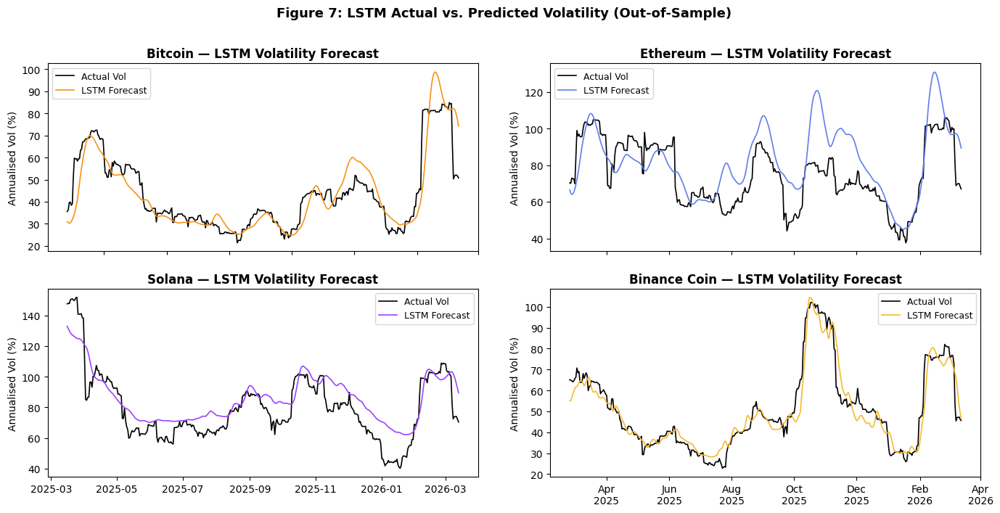

  ✓ Figure 7 saved: fig7_lstm_predictions.png


In [ ]:
import ta
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.models import Sequential

print("\n" + "=" * 65)
print("  MODEL 2: LSTM — VOLATILITY FORECASTING")
print("=" * 65)

lstm_results  = {}
SEQUENCE_LEN  = 60

for ticker, name in CRYPTOS.items():
    print(f"\n  Training LSTM for {name}...")

    # Download OHLCV for technical indicators
    raw = yf.download(ticker, start=START, end=END, auto_adjust=True)
    raw.columns = raw.columns.droplevel(1) if isinstance(raw.columns, pd.MultiIndex) else raw.columns

    # Target: 30-day rolling realised volatility (annualised %)
    raw['log_ret'] = 100 * np.log(raw['Close'] / raw['Close'].shift(1))
    raw['rv30']    = raw['log_ret'].rolling(30).std() * np.sqrt(365)

    # Technical indicators (from university Exercise #2 approach)
    raw['MA20']        = raw['Close'].rolling(20).mean()
    raw['MA50']        = raw['Close'].rolling(50).mean()
    raw['RSI']         = ta.momentum.RSIIndicator(raw['Close'], window=14).rsi()
    macd               = ta.trend.MACD(raw['Close'])
    raw['MACD']        = macd.macd()
    raw['MACD_signal'] = macd.macd_signal()
    raw['vol_lag1']    = raw['rv30'].shift(1)   # lagged volatility
    raw['vol_lag5']    = raw['rv30'].shift(5)
    raw = raw.dropna()

    features = ['Close','Volume','MA20','MA50','RSI','MACD','MACD_signal','vol_lag1','vol_lag5']
    target   = 'rv30'

    # 80/20 train-test split
    split_idx = int(len(raw) * 0.80)
    train_df  = raw.iloc[:split_idx]
    test_df   = raw.iloc[split_idx:]

    # Scale features
    feat_scaler = MinMaxScaler()
    feat_scaler.fit(train_df[features])
    X_train_sc = feat_scaler.transform(train_df[features])
    X_test_sc  = feat_scaler.transform(test_df[features])

    # Scale target
    tgt_scaler = MinMaxScaler()
    tgt_scaler.fit(train_df[[target]])
    y_train_sc = tgt_scaler.transform(train_df[[target]]).flatten()
    y_test_sc  = tgt_scaler.transform(test_df[[target]]).flatten()

    # Build sequences (SEQUENCE_LEN look-back)
    def make_sequences(X, y, seq_len):
        Xs, ys = [], []
        for i in range(seq_len, len(X)):
            Xs.append(X[i-seq_len:i])
            ys.append(y[i])
        return np.array(Xs), np.array(ys)

    X_tr, y_tr = make_sequences(X_train_sc, y_train_sc, SEQUENCE_LEN)
    X_te, y_te = make_sequences(X_test_sc,  y_test_sc,  SEQUENCE_LEN)

    # Build LSTM model (same architecture as university lecture code)
    model = Sequential([
        LSTM(128, return_sequences=True, input_shape=(SEQUENCE_LEN, len(features))),
        Dropout(0.3),
        LSTM(128, return_sequences=True),
        Dropout(0.3),
        LSTM(64),
        Dropout(0.3),
        Dense(32, activation='relu'),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mean_squared_error')

    es = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    history = model.fit(
        X_tr, y_tr,
        epochs=100,
        batch_size=16,
        validation_split=0.1,
        callbacks=[es],
        verbose=0
    )

    # Predictions
    y_pred_sc = model.predict(X_te, verbose=0)
    y_pred    = tgt_scaler.inverse_transform(y_pred_sc).flatten()
    y_actual  = tgt_scaler.inverse_transform(y_te.reshape(-1,1)).flatten()

    # Test dates aligned
    test_dates = test_df.index[SEQUENCE_LEN:]

    lstm_results[ticker] = {
        'model':      model,
        'history':    history,
        'y_pred':     y_pred,
        'y_actual':   y_actual,
        'test_dates': test_dates,
        'feat_scaler': feat_scaler,
        'tgt_scaler': tgt_scaler,
        'features':   features,
        'raw':        raw,
        'train_df':   train_df,
    }

    rmse_val = np.sqrt(np.mean((y_pred - y_actual)**2))
    mae_val  = np.mean(np.abs(y_pred - y_actual))
    print(f"    RMSE = {rmse_val:.3f}%  |  MAE = {mae_val:.3f}%  |  Epochs = {len(history.history['loss'])}")

# FIGURE 7 — LSTM predictions vs actual
fig, axes = plt.subplots(2, 2, figsize=(14, 8))
axes = axes.flatten()
for i, (ticker, name) in enumerate(CRYPTOS.items()):
    ax = axes[i]
    res = lstm_results[ticker]
    ax.plot(res['test_dates'], res['y_actual'], color='black',  linewidth=1.2, label='Actual Vol')
    ax.plot(res['test_dates'], res['y_pred'],   color=colours[ticker], linewidth=1.2, label='LSTM Forecast')
    ax.set_title(f'{name} — LSTM Volatility Forecast', fontweight='bold')
    ax.set_ylabel('Annualised Vol (%)')
    ax.legend(fontsize=9)
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b\n%Y'))

fig.suptitle('Figure 7: LSTM Actual vs. Predicted Volatility (Out-of-Sample)',
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
fig.autofmt_xdate(rotation=0, ha='center')
plt.savefig('fig7_lstm_predictions.png', dpi=150, bbox_inches='tight')
plt.show()
print("  ✓ Figure 7 saved: fig7_lstm_predictions.png")

LSTM MODEL A — 30-day forward forecast ──


  LSTM MODEL A — FORWARD FORECAST (180 days ahead)

  Forecasting Bitcoin...
    Day+1   = 70.95%  |  Day+30  = 79.97%  |  Day+90  = 84.43%  |  Day+180 = 84.51%

  Forecasting Ethereum...
    Day+1   = 86.49%  |  Day+30  = 106.85%  |  Day+90  = 107.14%  |  Day+180 = 107.40%

  Forecasting Solana...
    Day+1   = 86.90%  |  Day+30  = 102.54%  |  Day+90  = 110.70%  |  Day+180 = 113.07%

  Forecasting Binance Coin...
    Day+1   = 44.91%  |  Day+30  = 52.64%  |  Day+90  = 58.01%  |  Day+180 = 57.94%


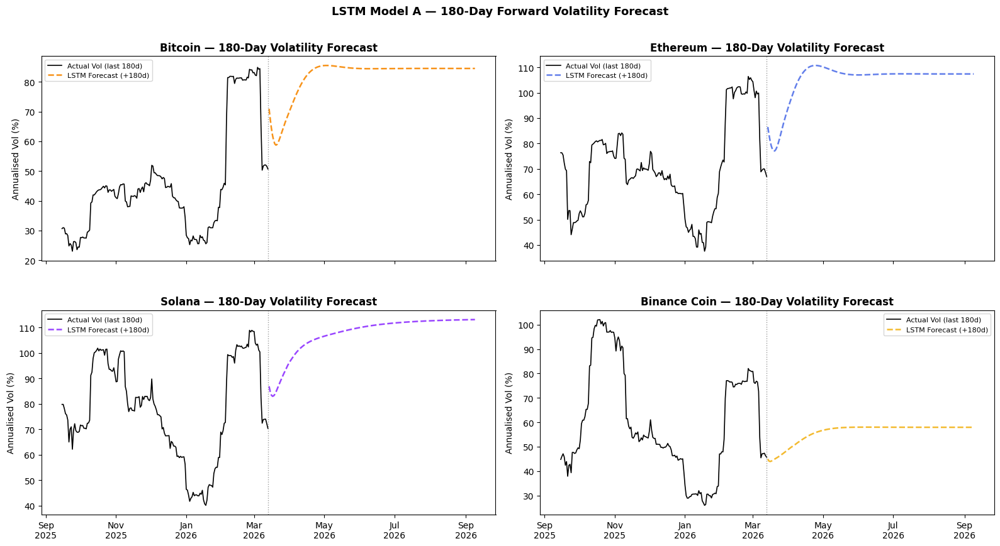


  ✓ Figure saved: fig_lstm_forward_forecast_180d.png


In [ ]:
FORECAST_HORIZON = 180
HISTORY_WINDOW   = 180   # how many past actual days to show on the chart

# Check if the required model results exist
if 'lstm_results' not in globals():
    print("⚠ ERROR: 'lstm_results' is not defined. Please run the LSTM Model 2 training cell (DByzJibYmA8G) before this cell.")
else:
    print("\n" + "=" * 70)
    print(f"  LSTM MODEL A — FORWARD FORECAST ({FORECAST_HORIZON} days ahead)")
    print("=" * 70)

    lstm_forecasts = {}

    for ticker, name in CRYPTOS.items():
        print(f"\n  Forecasting {name}...")

        res = lstm_results[ticker]
        seed_df     = res['raw'].iloc[-SEQUENCE_LEN:].copy() # Fixed: use res['raw'] and res['feat_scaler'], res['features']
        feat_scaler = res['feat_scaler']
        features    = res['features']
        tgt_scaler  = res['tgt_scaler']
        raw         = res['raw']

        seed_scaled = feat_scaler.transform(seed_df[features])
        current_seq = seed_scaled.copy()

        lag1_idx = features.index('vol_lag1')
        lag5_idx = features.index('vol_lag5')

        # keep enough recent realised volatility values for recursive lags
        recent_rv30 = list(raw['rv30'].iloc[-6:].values)

        future_preds = []

        for step in range(FORECAST_HORIZON):
            x_input   = current_seq.reshape(1, SEQUENCE_LEN, len(features))
            pred_sc   = res['model'].predict(x_input, verbose=0)[0, 0] # Fixed: use res['model']
            pred_rv30 = tgt_scaler.inverse_transform([[pred_sc]])[0, 0]
            future_preds.append(pred_rv30)

            # Start from the last available scaled row
            next_row = current_seq[-1].copy()

            # Update realised-volatility history with predicted value
            recent_rv30.append(pred_rv30)

            # Recursive lag construction
            next_rv30_lag1 = recent_rv30[-2]
            next_rv30_lag5 = recent_rv30[-6] if len(recent_rv30) >= 6 else recent_rv30[0]

            # Only update lagged-volatility features
            dummy = np.zeros((1, len(features)))
            dummy[0, lag1_idx] = next_rv30_lag1
            dummy[0, lag5_idx] = next_rv30_lag5

            scaled_dummy = feat_scaler.transform(dummy)
            next_row[lag1_idx] = scaled_dummy[0, lag1_idx]
            next_row[lag5_idx] = scaled_dummy[0, lag5_idx]

            # Roll the sequence forward
            current_seq = np.vstack([current_seq[1:], next_row])

        last_date    = raw.index[-1]
        future_dates = pd.date_range(
            start=last_date + pd.Timedelta(days=1),
            periods=FORECAST_HORIZON,
            freq='D'
        )

        lstm_forecasts[ticker] = {
            'dates':       future_dates,
            'forecast':    np.array(future_preds),
            'last_actual': raw['rv30'].iloc[-HISTORY_WINDOW:]
        }

        print(
            f"    Day+1   = {future_preds[0]:.2f}%  |  "
            f"Day+30  = {future_preds[29]:.2f}%  |  "
            f"Day+90  = {future_preds[89]:.2f}%  |  "
            f"Day+180 = {future_preds[-1]:.2f}%"
        )

    # -----------------------------
    # Plot
    # -----------------------------
    fig, axes = plt.subplots(2, 2, figsize=(16, 10))
    axes = axes.flatten()

    for i, (ticker, name) in enumerate(CRYPTOS.items()):
        ax = axes[i]
        fc = lstm_forecasts[ticker]

        ax.plot(
            fc['last_actual'].index,
            fc['last_actual'].values,
            color='black',
            linewidth=1.2,
            label=f'Actual Vol (last {HISTORY_WINDOW}d)'
        )

        ax.plot(
            fc['dates'],
            fc['forecast'],
            color=colours[ticker],
            linewidth=1.8,
            linestyle='--',
            label=f'LSTM Forecast (+{FORECAST_HORIZON}d)'
        )

        ax.axvline(
            fc['last_actual'].index[-1],
            color='gray',
            linewidth=1,
            linestyle=':',
            alpha=0.8
        )

        ax.set_title(f'{name} — {FORECAST_HORIZON}-Day Volatility Forecast', fontweight='bold')
        ax.set_ylabel('Annualised Vol (%)')
        ax.legend(fontsize=8)
        ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%b\n%Y'))
        plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)

    fig.suptitle(
        f'LSTM Model A — {FORECAST_HORIZON}-Day Forward Volatility Forecast',
        fontsize=13,
        fontweight='bold',
        y=1.01
    )
    plt.tight_layout()
    fig.autofmt_xdate(rotation=0, ha='center')
    plt.savefig('fig_lstm_forward_forecast_180d.png', dpi=150, bbox_inches='tight')
    plt.show()

    print("\n  ✓ Figure saved: fig_lstm_forward_forecast_180d.png")

LSTM train vs test (overfitting check)


  LSTM TRAIN VS TEST METRICS — ALL ASSETS

  Bitcoin
                       RMSE        MAE
    Train (80%)      7.465%      5.647%
    Test  (20%)      7.803%      5.351%
    Overfit gap (Test−Train RMSE): +0.338%  ✓ looks healthy

  Ethereum
                       RMSE        MAE
    Train (80%)     11.829%      9.042%
    Test  (20%)     15.210%     11.832%
    Overfit gap (Test−Train RMSE): +3.380%  ✓ looks healthy

  Solana
                       RMSE        MAE
    Train (80%)     17.964%     11.695%
    Test  (20%)     12.082%      9.916%
    Overfit gap (Test−Train RMSE): -5.882%  ✓ looks healthy

  Binance Coin
                       RMSE        MAE
    Train (80%)      9.889%      6.727%
    Test  (20%)      5.667%      4.126%
    Overfit gap (Test−Train RMSE): -4.221%  ✓ looks healthy


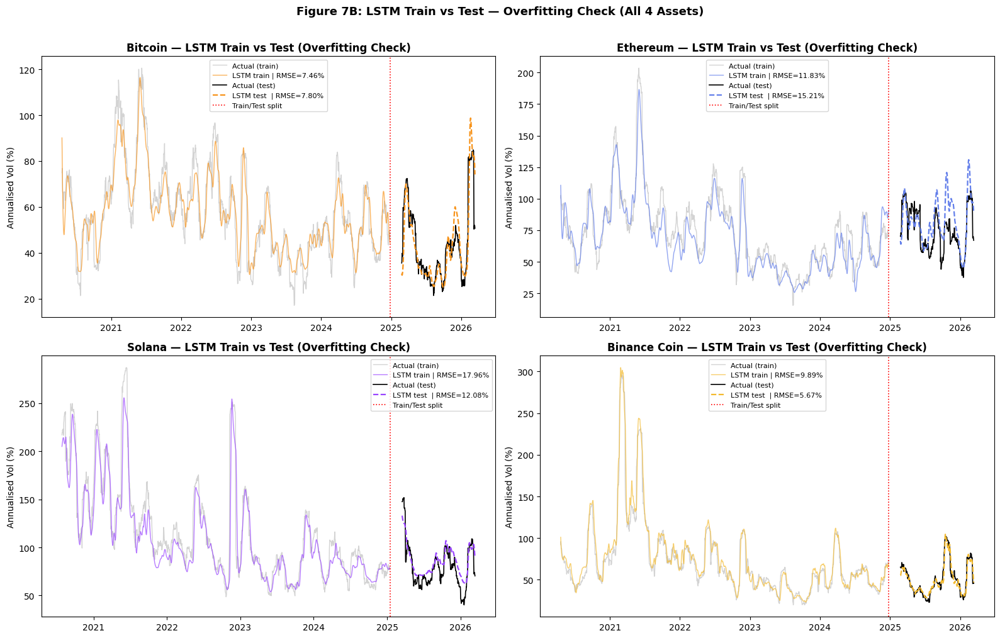

  ✓ Figure 7B saved: fig7b_lstm_train_vs_test.png


In [ ]:
def make_sequences_local(X, y, seq_len):
    Xs, ys = [], []
    for i in range(seq_len, len(X)):
        Xs.append(X[i - seq_len:i])
        ys.append(y[i])
    return np.array(Xs), np.array(ys)

print("\n" + "=" * 65)
print("  LSTM TRAIN VS TEST METRICS — ALL ASSETS")
print("=" * 65)

for ticker, name in CRYPTOS.items():
    res        = lstm_results[ticker]
    model      = res['model']
    feat_scaler = res['feat_scaler']
    tgt_scaler  = res['tgt_scaler']
    features    = res['features']
    train_df    = res['train_df']

    X_train_sc = feat_scaler.transform(train_df[features])
    y_train_sc = tgt_scaler.transform(train_df[['rv30']]).flatten()
    X_tr, y_tr = make_sequences_local(X_train_sc, y_train_sc, SEQUENCE_LEN)

    y_train_pred_sc = model.predict(X_tr, verbose=0)
    y_train_pred    = tgt_scaler.inverse_transform(y_train_pred_sc).flatten()
    y_train_actual  = tgt_scaler.inverse_transform(y_tr.reshape(-1, 1)).flatten()

    rmse_train = np.sqrt(np.mean((y_train_pred - y_train_actual)**2))
    mae_train  = np.mean(np.abs(y_train_pred - y_train_actual))
    rmse_val   = np.sqrt(np.mean((res['y_pred'] - res['y_actual'])**2))
    mae_val    = np.mean(np.abs(res['y_pred'] - res['y_actual']))
    gap        = rmse_val - rmse_train

    print(f"\n  {name}")
    print(f"    {'':12} {'RMSE':>10} {'MAE':>10}")
    print(f"    {'Train (80%)':12} {rmse_train:>9.3f}%  {mae_train:>9.3f}%")
    print(f"    {'Test  (20%)':12} {rmse_val:>9.3f}%  {mae_val:>9.3f}%")
    print(f"    Overfit gap (Test−Train RMSE): {gap:+.3f}%  "
          f"{'⚠ possible overfit' if gap > 5 else '✓ looks healthy'}")

    res['y_train_pred']   = y_train_pred
    res['y_train_actual'] = y_train_actual
    res['rmse_train']     = rmse_train
    res['dates_train']    = train_df.index[SEQUENCE_LEN:]

fig, axes = plt.subplots(2, 2, figsize=(16, 10))
axes = axes.flatten()
for i, (ticker, name) in enumerate(CRYPTOS.items()):
    ax  = axes[i]
    res = lstm_results[ticker]
    ax.plot(res['dates_train'], res['y_train_actual'],
            color='lightgray', lw=1.0, label='Actual (train)')
    ax.plot(res['dates_train'], res['y_train_pred'],
            color=colours[ticker], lw=1.0, alpha=0.7,
            label=f"LSTM train | RMSE={res['rmse_train']:.2f}%")
    ax.plot(res['test_dates'], res['y_actual'],
            color='black', lw=1.2, label='Actual (test)')
    ax.plot(res['test_dates'], res['y_pred'],
            color=colours[ticker], lw=1.6, linestyle='--',
            label=f"LSTM test  | RMSE={np.sqrt(np.mean((res['y_pred']-res['y_actual'])**2)):.2f}%")
    ax.axvline(pd.Timestamp(res['dates_train'][-1]),
               color='red', lw=1.2, linestyle=':', label='Train/Test split')
    ax.set_title(f'{name} — LSTM Train vs Test (Overfitting Check)', fontweight='bold')
    ax.set_ylabel('Annualised Vol (%)')
    ax.legend(fontsize=8)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    ax.xaxis.set_major_locator(mdates.YearLocator())

fig.suptitle('Figure 7B: LSTM Train vs Test — Overfitting Check (All 4 Assets)',
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('fig7b_lstm_train_vs_test.png', dpi=150, bbox_inches='tight')
plt.show()
plt.close()
print("  ✓ Figure 7B saved: fig7b_lstm_train_vs_test.png")

In [ ]:
# ============================================================
# NEW LSTM MODEL B — RV30 FORECASTING WITH RECURSIVE 90-DAY OUTLOOK
# Balanced feature set, mostly lagged-volatility features
# Fixed seed, 80/20 split, RMSE+MAE, plots + forecast table
# ============================================================

import warnings
warnings.filterwarnings("ignore")

import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import yfinance as yf
import tensorflow as tf


from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, Input
from tensorflow.keras.callbacks import EarlyStopping

# -----------------------------
# 1. CONFIG
# -----------------------------
SEED = 42
np.random.seed(SEED)
random.seed(SEED)
tf.keras.utils.set_random_seed(SEED)

try:
    tf.config.experimental.enable_op_determinism()
except Exception:
    pass

assert "START" in globals() and "END" in globals(), "Run GLOBAL CONFIG first."
assert "CRYPTOS" in globals(), "Run GLOBAL CONFIG first."

print("LSTM B using shared window:")
print("START =", START)
print("END   =", END)

colours = {
    "BTC-USD": "#F7931A",
    "ETH-USD": "#3C3C3D",
    "BNB-USD": "#F3BA2F",
    "SOL-USD": "#00FFA3"
}

TARGET            = "rv30"
FEATURES          = ["log_ret", "ret_mean_7", "ret_std_7", "vol_lag1", "vol_lag5"]
SEQUENCE_LEN      = 60
TRAIN_SPLIT       = 0.80
FORECAST_HORIZON  = 90
FUTURE_RETURN_MODE = "zero"
MAX_EPOCHS   = 100
BATCH_SIZE   = 16
VAL_SPLIT    = 0.10
PATIENCE     = 8

# -----------------------------
# 2. HELPERS
# -----------------------------
def load_crypto(ticker: str, start: str, end: str) -> pd.DataFrame:
    df = yf.download(ticker, start=start, end=end, auto_adjust=True, progress=False)
    if isinstance(df.columns, pd.MultiIndex):
        df.columns = df.columns.droplevel(1)
    return df

def build_feature_frame(raw: pd.DataFrame) -> pd.DataFrame:
    df = raw.copy()
    df["log_ret"] = 100 * np.log(df["Close"] / df["Close"].shift(1))
    df["rv30"] = df["log_ret"].rolling(30).std() * np.sqrt(365)
    df["ret_mean_7"] = df["log_ret"].rolling(7).mean()
    df["ret_std_7"]  = df["log_ret"].rolling(7).std()
    df["vol_lag1"]   = df["rv30"].shift(1)
    df["vol_lag5"]   = df["rv30"].shift(5)
    return df.dropna().copy()

def make_sequences(X: np.ndarray, y: np.ndarray, seq_len: int):
    Xs, ys = [], []
    for i in range(seq_len, len(X)):
        Xs.append(X[i-seq_len:i])
        ys.append(y[i])
    return np.array(Xs), np.array(ys)

def build_lstm_model(seq_len: int, n_features: int) -> Sequential:
    model = Sequential([
        Input(shape=(seq_len, n_features)),
        LSTM(64, return_sequences=True),
        Dropout(0.2),
        LSTM(32),
        Dropout(0.2),
        Dense(16, activation="relu"),
        Dense(1)
    ])
    model.compile(optimizer="adam", loss="mean_squared_error")
    return model

def rmse(y_true, y_pred):
    return np.sqrt(np.mean((y_pred - y_true) ** 2))
def mae(y_true, y_pred):
    return np.mean(np.abs(y_pred - y_true))

# -----------------------------
# 3. TRAIN / TEST MODEL
# -----------------------------
print("\n" + "=" * 70)
print("  MODEL B: LSTM — RV30 VOLATILITY FORECASTING (FORWARD-READY)")
print("=" * 70)

lstm_b_results = {}

for ticker, name in CRYPTOS.items():
    print(f"\nTraining {name}...")
    raw = load_crypto(ticker, START, END)
    data = build_feature_frame(raw)

    split_idx = int(len(data) * TRAIN_SPLIT)
    train_df = data.iloc[:split_idx].copy()
    test_df  = data.iloc[split_idx:].copy()

    feat_scaler, tgt_scaler = MinMaxScaler(), MinMaxScaler()
    feat_scaler.fit(train_df[FEATURES])
    tgt_scaler.fit(train_df[[TARGET]])

    X_train_sc = feat_scaler.transform(train_df[FEATURES])
    X_test_sc  = feat_scaler.transform(test_df[FEATURES])
    y_train_sc = tgt_scaler.transform(train_df[[TARGET]]).flatten()
    y_test_sc  = tgt_scaler.transform(test_df[[TARGET]]).flatten()

    X_tr, y_tr = make_sequences(X_train_sc, y_train_sc, SEQUENCE_LEN)
    X_te, y_te = make_sequences(X_test_sc,  y_test_sc,  SEQUENCE_LEN)

    model = build_lstm_model(SEQUENCE_LEN, len(FEATURES))
    es = EarlyStopping(monitor="val_loss", patience=PATIENCE, restore_best_weights=True)
    history = model.fit(X_tr, y_tr, epochs=MAX_EPOCHS, batch_size=BATCH_SIZE, validation_split=VAL_SPLIT, callbacks=[es], verbose=0)

    y_pred_sc = model.predict(X_te, verbose=0)
    y_pred    = tgt_scaler.inverse_transform(y_pred_sc).flatten()
    y_actual  = tgt_scaler.inverse_transform(y_te.reshape(-1, 1)).flatten()

    y_train_pred_sc = model.predict(X_tr, verbose=0)
    y_train_pred    = tgt_scaler.inverse_transform(y_train_pred_sc).flatten()
    y_train_actual  = tgt_scaler.inverse_transform(y_tr.reshape(-1, 1)).flatten()

    # FIXED: Corrected syntax by removing duplicate variable reference
    lstm_b_results[ticker] = {
        "model": model, "history": history, "y_pred": y_pred, "y_actual": y_actual,
        "test_dates": test_df.index[SEQUENCE_LEN:], "y_train_pred": y_train_pred,
        "y_train_actual": y_train_actual, "train_dates": train_df.index[SEQUENCE_LEN:],
        "feat_scaler": feat_scaler, "tgt_scaler": tgt_scaler, "data": data,
        "rmse_train": rmse(y_train_actual, y_train_pred), "rmse_test": rmse(y_actual, y_pred),
        "mae_train":  mae(y_train_actual, y_train_pred),  "mae_test":  mae(y_actual, y_pred)
    }
    print(f"  RMSE Test = {lstm_b_results[ticker]['rmse_test']:.3f}%  |  MAE Test = {lstm_b_results[ticker]['mae_test']:.3f}%")

print("\n✓ Model B training complete.")

LSTM B using shared window:
START = 2020-01-01
END   = 2026-03-14

  MODEL B: LSTM — RV30 VOLATILITY FORECASTING (FORWARD-READY)

Training Bitcoin...
  RMSE Test = 3.882%  |  MAE Test = 2.486%

Training Ethereum...
  RMSE Test = 6.380%  |  MAE Test = 4.758%

Training Solana...
  RMSE Test = 6.889%  |  MAE Test = 4.838%

Training Binance Coin...
  RMSE Test = 5.349%  |  MAE Test = 4.060%

✓ Model B training complete.


TEST PREDICTIONS vs ACTUAL  

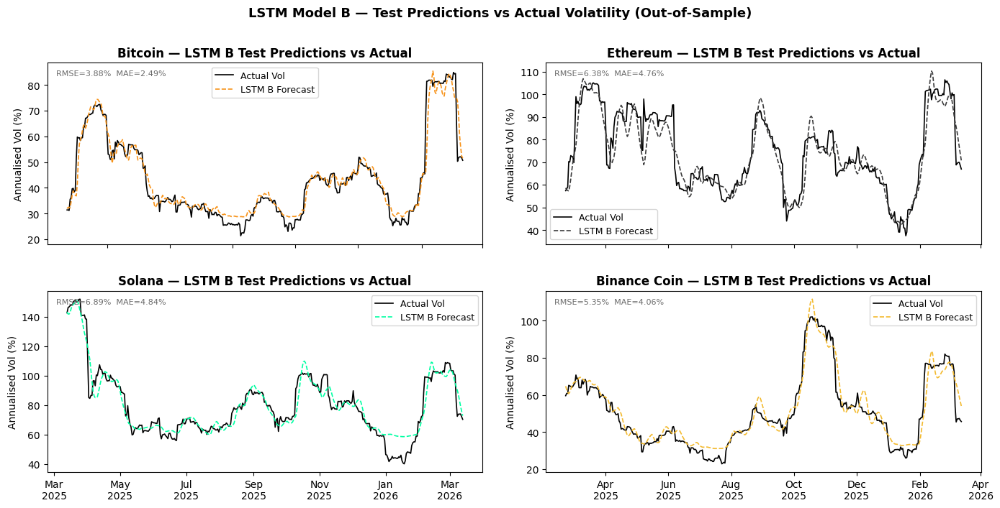

✓ Saved: fig_lstm_b_test_vs_actual.png


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

fig, axes = plt.subplots(2, 2, figsize=(14, 8))
axes = axes.flatten()

for i, (ticker, name) in enumerate(CRYPTOS.items()):
    ax  = axes[i]
    res = lstm_b_results[ticker]

    rmse_val = np.sqrt(np.mean((res['y_pred'] - res['y_actual'])**2))
    mae_val  = np.mean(np.abs(res['y_pred'] - res['y_actual']))

    ax.plot(res['test_dates'], res['y_actual'],
            color='black', linewidth=1.2, label='Actual Vol')
    ax.plot(res['test_dates'], res['y_pred'],
            color=colours[ticker], linewidth=1.2, linestyle='--',
            label=f'LSTM B Forecast')

    ax.set_title(f'{name} — LSTM B Test Predictions vs Actual', fontweight='bold')
    ax.set_ylabel('Annualised Vol (%)')
    ax.legend(fontsize=9)
    ax.text(0.02, 0.96, f'RMSE={rmse_val:.2f}%  MAE={mae_val:.2f}%',
            transform=ax.transAxes, fontsize=8,
            verticalalignment='top', color='dimgray')

    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b\n%Y'))

fig.suptitle('LSTM Model B — Test Predictions vs Actual Volatility (Out-of-Sample)',
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
fig.autofmt_xdate(rotation=0, ha='center')
plt.savefig('fig_lstm_b_test_vs_actual.png', dpi=150, bbox_inches='tight')
plt.show()
print("✓ Saved: fig_lstm_b_test_vs_actual.png")

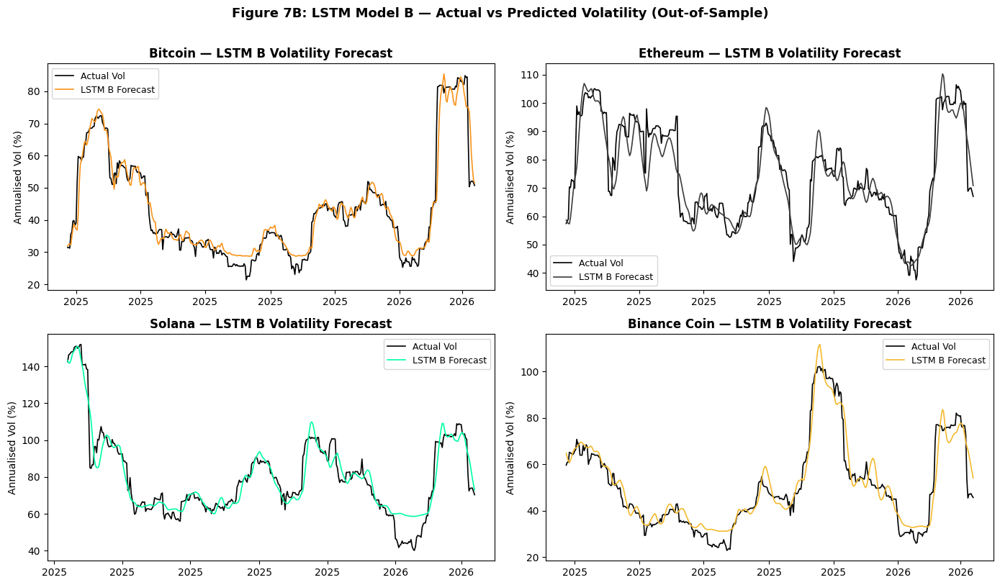

✓ Plot 1 saved: fig7b_lstm_b_predictions.png


In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(14, 8))
axes = axes.flatten()

for i, (ticker, name) in enumerate(CRYPTOS.items()):
    ax  = axes[i]
    res = lstm_b_results[ticker]

    ax.plot(res["test_dates"], res["y_actual"],
            color="black",          linewidth=1.2, label="Actual Vol")
    ax.plot(res["test_dates"], res["y_pred"],
            color=colours[ticker],  linewidth=1.2, label="LSTM B Forecast")

    ax.set_title(f"{name} — LSTM B Volatility Forecast", fontweight="bold")
    ax.set_ylabel("Annualised Vol (%)")
    ax.legend(fontsize=9)
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))

fig.suptitle(
    "Figure 7B: LSTM Model B — Actual vs Predicted Volatility (Out-of-Sample)",
    fontsize=13, fontweight="bold", y=1.01
)
plt.tight_layout()
plt.savefig("fig7b_lstm_b_predictions.png", dpi=150, bbox_inches="tight")
plt.show()
print("✓ Plot 1 saved: fig7b_lstm_b_predictions.png")


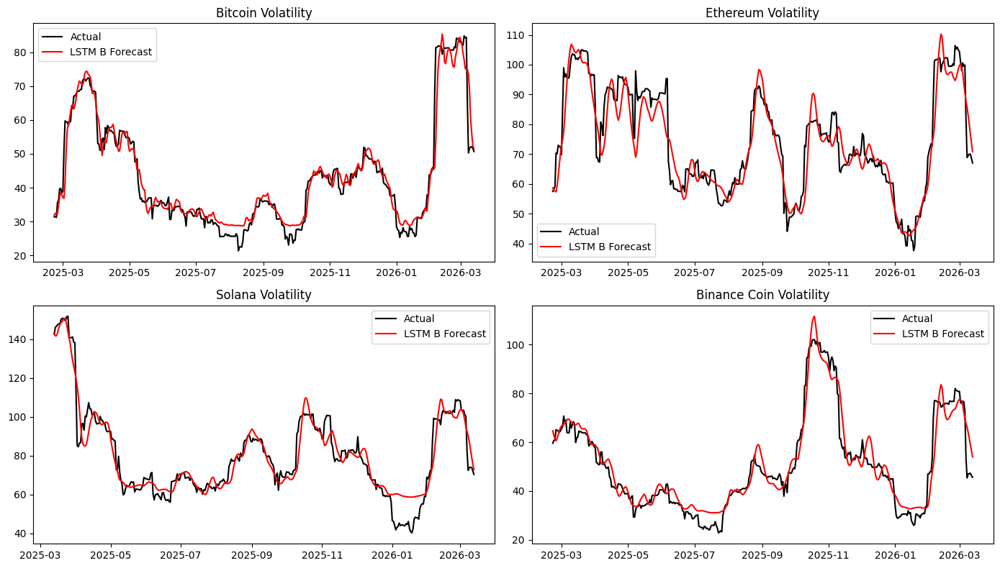

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

fig, axes = plt.subplots(2, 2, figsize=(14, 8))
axes = axes.flatten()

for i, (ticker, name) in enumerate(CRYPTOS.items()):
    res = lstm_b_results[ticker]
    ax = axes[i]
    ax.plot(res["test_dates"], res["y_actual"], color="black", label="Actual")
    ax.plot(res["test_dates"], res["y_pred"], color="red", label="LSTM B Forecast")
    ax.set_title(f"{name} Volatility")
    ax.legend()

plt.tight_layout()
plt.show()

FORWARD RECURSIVE FORECAST  (180-day outlook)

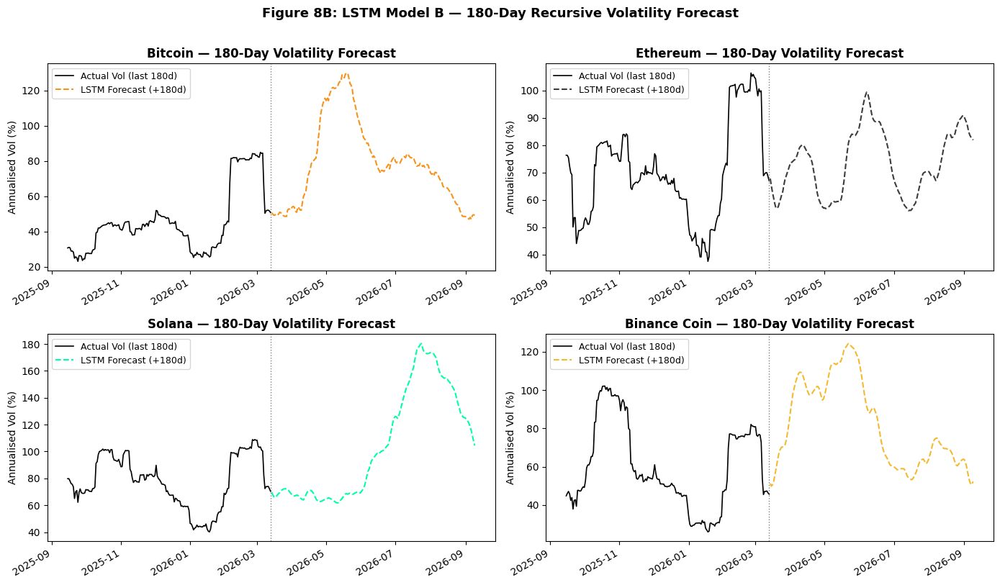

✓ Plot 2 saved: fig8b_lstm_b_180d_forecast.png


In [ ]:
!pip install arch
from arch import arch_model

FORECAST_HORIZON = 180

fig, axes = plt.subplots(2, 2, figsize=(14, 8))
axes = axes.flatten()

garch_returns = {}

for ticker in CRYPTOS:
    r       = lstm_b_results[ticker]["data"]["log_ret"].values
    gm      = arch_model(r, vol="Garch", p=1, q=1, dist="normal")
    gm_fit  = gm.fit(disp="off")
    # Use the model object (gm) to simulate, passing the fitted parameters
    sim     = gm.simulate(params=gm_fit.params, nobs=FORECAST_HORIZON)
    garch_returns[ticker] = sim["data"].values.flatten()

for i, (ticker, name) in enumerate(CRYPTOS.items()):
    ax  = axes[i]
    res = lstm_b_results[ticker]

    model       = res["model"]
    feat_scaler = res["feat_scaler"]
    tgt_scaler  = res["tgt_scaler"]
    data        = res["data"]

    seed_df     = data.iloc[-SEQUENCE_LEN:].copy()
    window_feat = feat_scaler.transform(seed_df[FEATURES])
    window_feat = list(window_feat)

    recent_rets = list(data["log_ret"].values[-SEQUENCE_LEN:])

    forecast_scaled = []
    for step_idx in range(FORECAST_HORIZON):
        X_in = np.array(window_feat[-SEQUENCE_LEN:]).reshape(1, SEQUENCE_LEN, len(FEATURES))
        pred_sc = model.predict(X_in, verbose=0)[0, 0]
        forecast_scaled.append(pred_sc)

        next_ret = float(garch_returns[ticker][step_idx])
        recent_rets.append(next_ret)

        last7_rets  = recent_rets[-7:]
        ret_mean_7  = float(np.mean(last7_rets))
        ret_std_7   = float(np.std(last7_rets, ddof=1)) if len(last7_rets) > 1 else 0.0

        if len(forecast_scaled) >= 2:
            vol_lag1 = float(tgt_scaler.inverse_transform([[forecast_scaled[-2]]])[0, 0])
        else:
            vol_lag1 = float(data["rv30"].iloc[-1])

        if len(forecast_scaled) >= 6:
            vol_lag5 = float(tgt_scaler.inverse_transform([[forecast_scaled[-6]]])[0, 0])
        else:
            vol_lag5 = float(data["rv30"].iloc[-5] if len(data) > 5 else data["rv30"].iloc[0])

        raw_row  = np.array([[next_ret, ret_mean_7, ret_std_7, vol_lag1, vol_lag5]])
        sc_row   = feat_scaler.transform(raw_row)[0]
        window_feat.append(sc_row)

    forecast_vals = tgt_scaler.inverse_transform(np.array(forecast_scaled).reshape(-1, 1)).flatten()
    last_date      = data.index[-1]
    forecast_dates = pd.date_range(start=last_date + pd.Timedelta(days=1), periods=FORECAST_HORIZON, freq="D")

    hist_window  = 180
    hist_dates   = data.index[-hist_window:]
    hist_vals    = data["rv30"].values[-hist_window:]

    ax.plot(hist_dates, hist_vals, color="black", linewidth=1.2, label=f"Actual Vol (last {hist_window}d)")
    ax.axvline(x=last_date, color="grey", linestyle=":", linewidth=1.0)
    ax.plot(forecast_dates, forecast_vals, color=colours[ticker], linewidth=1.5, linestyle="--", label=f"LSTM Forecast (+{FORECAST_HORIZON}d)")

    ax.set_title(f"{name} — {FORECAST_HORIZON}-Day Volatility Forecast", fontweight="bold")
    ax.set_ylabel("Annualised Vol (%)")
    ax.legend(fontsize=9)
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=30, ha="right")

fig.suptitle(f"Figure 8B: LSTM Model B — {FORECAST_HORIZON}-Day Recursive Volatility Forecast", fontsize=13, fontweight="bold", y=1.01)
plt.tight_layout()
plt.savefig(f"fig8b_lstm_b_{FORECAST_HORIZON}d_forecast.png", dpi=150, bbox_inches="tight")
plt.show()
print(f"✓ Plot 2 saved: fig8b_lstm_b_{FORECAST_HORIZON}d_forecast.png")

TRAIN vs TEST OVERFITTING CHECK

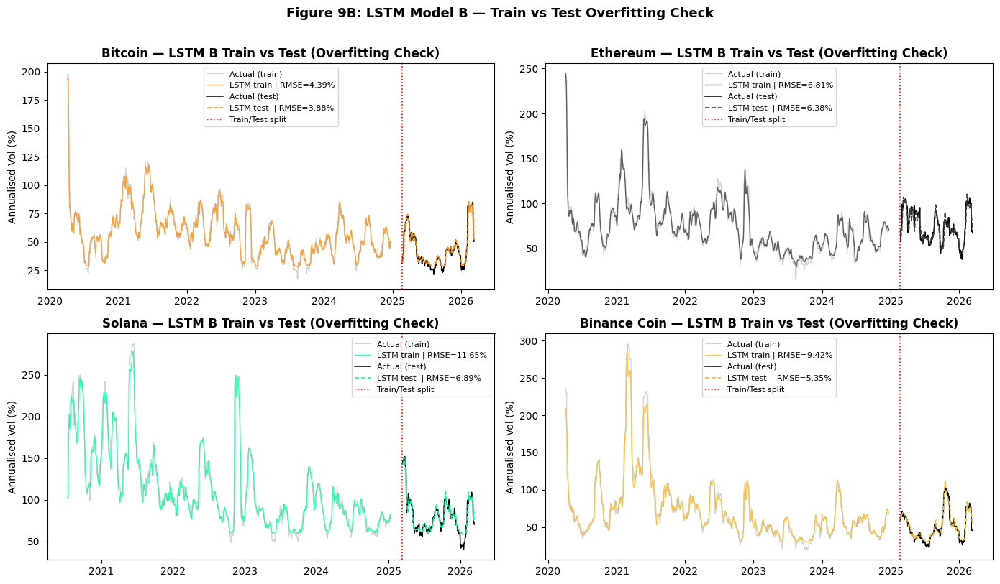

✓ Plot 3 saved: fig9b_lstm_b_train_vs_test.png


In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(14, 8))
axes = axes.flatten()

for i, (ticker, name) in enumerate(CRYPTOS.items()):
    ax  = axes[i]
    res = lstm_b_results[ticker]

    split_date = res["test_dates"][0]   # first test date = split boundary

    # ── train period ──
    ax.plot(res["train_dates"], res["y_train_actual"],
            color="lightgrey", linewidth=0.9, label="Actual (train)")
    ax.plot(res["train_dates"], res["y_train_pred"],
            color=colours[ticker], linewidth=1.0, alpha=0.8,
            label=f"LSTM train | RMSE={res['rmse_train']:.2f}%")

    # ── test period ──
    ax.plot(res["test_dates"], res["y_actual"],
            color="black", linewidth=1.1, label="Actual (test)")
    ax.plot(res["test_dates"], res["y_pred"],
            color=colours[ticker], linewidth=1.2, linestyle="--",
            label=f"LSTM test  | RMSE={res['rmse_test']:.2f}%")

    # ── split line ──
    ax.axvline(x=split_date, color="red", linestyle=":", linewidth=1.2,
               label="Train/Test split")

    ax.set_title(f"{name} — LSTM B Train vs Test (Overfitting Check)", fontweight="bold")
    ax.set_ylabel("Annualised Vol (%)")
    ax.legend(fontsize=8)
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))

fig.suptitle(
    "Figure 9B: LSTM Model B — Train vs Test Overfitting Check",
    fontsize=13, fontweight="bold", y=1.01
)
plt.tight_layout()
plt.savefig("fig9b_lstm_b_train_vs_test.png", dpi=150, bbox_inches="tight")
plt.show()
print("✓ Plot 3 saved: fig9b_lstm_b_train_vs_test.png")

 LSTM B: SYNTHETIC VOLATILITY SPIKE INJECTION


  STRESS TEST — SYNTHETIC VOLATILITY SPIKE
  Spike: 3.0x vol | Day+10 | Duration: 20d

  Bitcoin
    Baseline RMSE  : 3.882%
    Stress RMSE    : 3.882%
    Degradation    : +0.001%  ✓ holds up

  Ethereum
    Baseline RMSE  : 6.380%
    Stress RMSE    : 6.384%
    Degradation    : +0.003%  ✓ holds up

  Solana
    Baseline RMSE  : 6.889%
    Stress RMSE    : 6.914%
    Degradation    : +0.025%  ✓ holds up

  Binance Coin
    Baseline RMSE  : 5.349%
    Stress RMSE    : 5.348%
    Degradation    : -0.001%  ✓ holds up


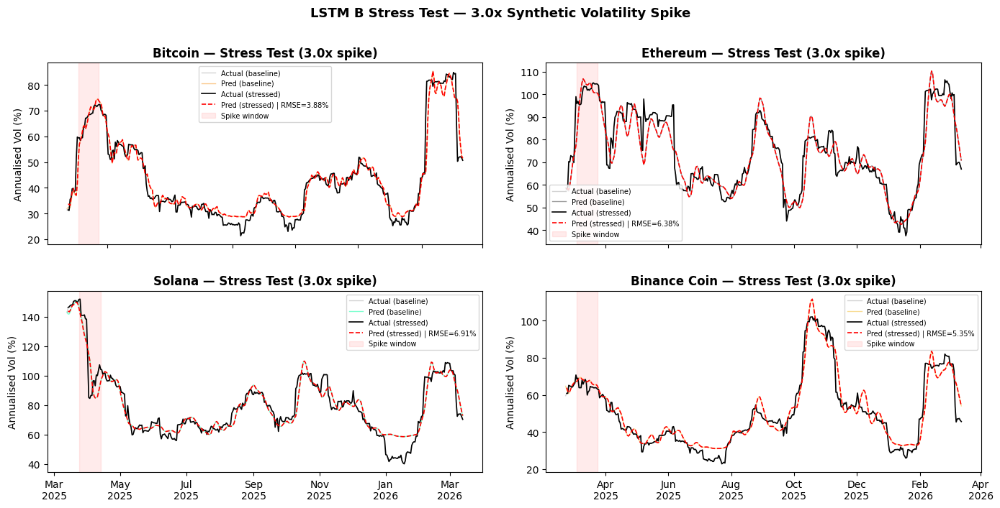


✓ Saved: fig_lstm_b_stress_test.png


In [ ]:
# ============================================================
# STRESS TEST — LSTM B: SYNTHETIC VOLATILITY SPIKE INJECTION
# ============================================================
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

SPIKE_MULTIPLIER = 3.0   # how severe the spike is (3x = extreme)
SPIKE_START_DAY  = 10    # how many days into the test before spike hits
SPIKE_DURATION   = 20    # how many days the spike lasts

print("\n" + "=" * 70)
print("  STRESS TEST — SYNTHETIC VOLATILITY SPIKE")
print(f"  Spike: {SPIKE_MULTIPLIER}x vol | Day+{SPIKE_START_DAY} | Duration: {SPIKE_DURATION}d")
print("=" * 70)

stress_results = {}

for ticker, name in CRYPTOS.items():
    res         = lstm_b_results[ticker]
    model       = res['model']
    feat_scaler = res['feat_scaler']
    tgt_scaler  = res['tgt_scaler']
    data        = res['data']

    # --- Build stressed feature frame ---
    stressed = data.copy()
    spike_start = int(len(stressed) * TRAIN_SPLIT) + SPIKE_START_DAY
    spike_end   = spike_start + SPIKE_DURATION

    # Inject spike into rv30 and its lags
    stressed.iloc[spike_start:spike_end, stressed.columns.get_loc('rv30')] *= SPIKE_MULTIPLIER

    # Rebuild lags on stressed data so they're consistent
    stressed['vol_lag1'] = stressed['rv30'].shift(1)
    stressed['vol_lag5'] = stressed['rv30'].shift(5)
    stressed = stressed.dropna()

    split_idx    = int(len(stressed) * TRAIN_SPLIT)
    test_stressed = stressed.iloc[split_idx:]

    X_test_sc = feat_scaler.transform(test_stressed[FEATURES])
    y_test_sc = tgt_scaler.transform(test_stressed[[TARGET]]).flatten()

    X_te, y_te = make_sequences(X_test_sc, y_test_sc, SEQUENCE_LEN)

    y_pred_sc     = model.predict(X_te, verbose=0)
    y_pred_stress = tgt_scaler.inverse_transform(y_pred_sc).flatten()
    y_actual_stress = tgt_scaler.inverse_transform(y_te.reshape(-1, 1)).flatten()

    rmse_stress = np.sqrt(np.mean((y_pred_stress - y_actual_stress)**2))
    mae_stress  = np.mean(np.abs(y_pred_stress - y_actual_stress))
    rmse_base   = res['rmse_test']
    degradation = rmse_stress - rmse_base

    stress_results[ticker] = {
        'y_pred':   y_pred_stress,
        'y_actual': y_actual_stress,
        'dates':    test_stressed.index[SEQUENCE_LEN:],
        'rmse':     rmse_stress,
        'mae':      mae_stress,
        'degradation': degradation
    }

    print(f"\n  {name}")
    print(f"    Baseline RMSE  : {rmse_base:.3f}%")
    print(f"    Stress RMSE    : {rmse_stress:.3f}%")
    print(f"    Degradation    : {degradation:+.3f}%  "
          f"{'⚠ model struggles' if degradation > 5 else '✓ holds up'}")

# -------------------------------------------------------
# Plot — stressed actual vs predicted
# -------------------------------------------------------
fig, axes = plt.subplots(2, 2, figsize=(14, 8))
axes = axes.flatten()

for i, (ticker, name) in enumerate(CRYPTOS.items()):
    ax  = axes[i]
    sr  = stress_results[ticker]
    res = lstm_b_results[ticker]

    # Baseline prediction (no spike)
    ax.plot(res['test_dates'], res['y_actual'],
            color='lightgray', lw=1.0, label='Actual (baseline)')
    ax.plot(res['test_dates'], res['y_pred'],
            color=colours[ticker], lw=1.0, alpha=0.5, label='Pred (baseline)')

    # Stressed
    ax.plot(sr['dates'], sr['y_actual'],
            color='black', lw=1.2, label='Actual (stressed)')
    ax.plot(sr['dates'], sr['y_pred'],
            color='red', lw=1.2, linestyle='--',
            label=f"Pred (stressed) | RMSE={sr['rmse']:.2f}%")

    # Shade the spike window
    spike_s = sr['dates'][SPIKE_START_DAY] if len(sr['dates']) > SPIKE_START_DAY else sr['dates'][0]
    spike_e = sr['dates'][min(SPIKE_START_DAY + SPIKE_DURATION, len(sr['dates'])-1)]
    ax.axvspan(spike_s, spike_e, color='red', alpha=0.08, label='Spike window')

    ax.set_title(f'{name} — Stress Test ({SPIKE_MULTIPLIER}x spike)', fontweight='bold')
    ax.set_ylabel('Annualised Vol (%)')
    ax.legend(fontsize=7)
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b\n%Y'))

fig.suptitle(f'LSTM B Stress Test — {SPIKE_MULTIPLIER}x Synthetic Volatility Spike',
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
fig.autofmt_xdate(rotation=0, ha='center')
plt.savefig('fig_lstm_b_stress_test.png', dpi=150, bbox_inches='tight')
plt.show()
print("\n✓ Saved: fig_lstm_b_stress_test.png")

COMPARISON ─ MODEL A vs MODEL B  (corrected)


Performance Metrics (Out-of-Sample Test Set):
              LSTM A RMSE (%)  LSTM A MAE (%)  LSTM B RMSE (%)  LSTM B MAE (%)
Crypto                                                                        
Bitcoin                 7.803           5.351            3.882           2.486
Ethereum               15.210          11.832            6.380           4.758
Solana                 12.082           9.916            6.889           4.838
Binance Coin            5.667           4.126            5.349           4.060


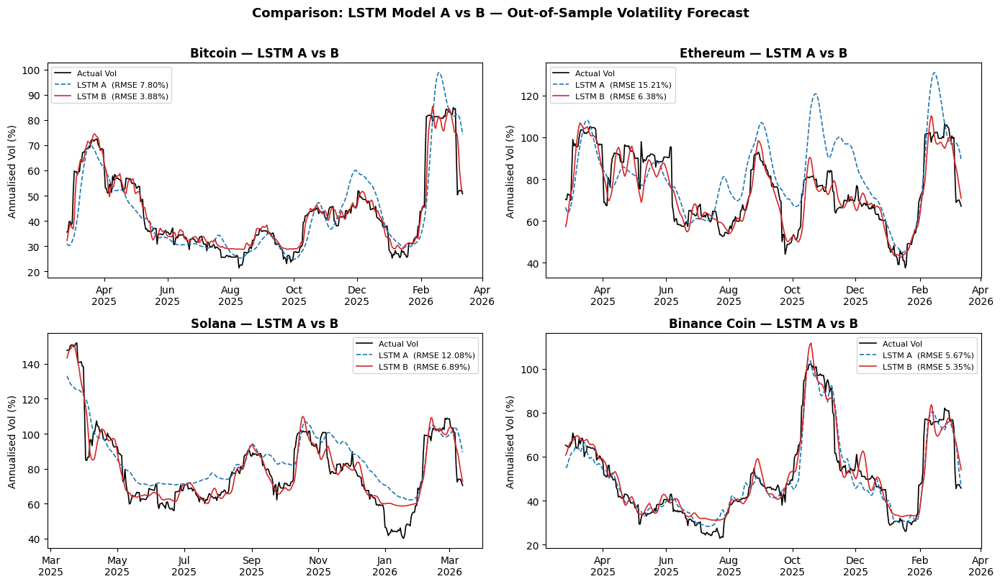

✓ Comparison figure saved: fig_lstm_a_vs_b_comparison.png


In [ ]:
model_colours = {"LSTM A": "#1f77b4", "LSTM B": "#d62728"}

# ── metrics table ──
comparison_data = []
for ticker, name in CRYPTOS.items():
    res_a = lstm_results[ticker]    # ← only these two needed here
    res_b = lstm_b_results[ticker]

    rmse_a = np.sqrt(np.mean((res_a["y_pred"] - res_a["y_actual"]) ** 2))



    rmse_a = np.sqrt(np.mean((res_a["y_pred"] - res_a["y_actual"]) ** 2))
    mae_a  = np.mean(np.abs(res_a["y_pred"] - res_a["y_actual"]))

    comparison_data.append({
        "Crypto":          name,
        "LSTM A RMSE (%)": round(rmse_a,         3),
        "LSTM A MAE (%)":  round(mae_a,           3),
        "LSTM B RMSE (%)": round(res_b["rmse_test"], 3),
        "LSTM B MAE (%)":  round(res_b["mae_test"],  3),
    })

comparison_df = pd.DataFrame(comparison_data)
print("\nPerformance Metrics (Out-of-Sample Test Set):")
print(comparison_df.set_index("Crypto").to_string())

# ── comparison plot ──
fig, axes = plt.subplots(2, 2, figsize=(14, 8))
axes = axes.flatten()

for i, (ticker, name) in enumerate(CRYPTOS.items()):
    ax    = axes[i]
    res_a = lstm_results[ticker]
    res_b = lstm_b_results[ticker]

    # Align on common dates (test sets should match; trim if needed)
    common_dates = res_a["test_dates"].intersection(res_b["test_dates"])

    mask_a = res_a["test_dates"].isin(common_dates)
    mask_b = res_b["test_dates"].isin(common_dates)

    ax.plot(common_dates,
            res_a["y_actual"][mask_a],
            color="black", linewidth=1.2, label="Actual Vol")
    ax.plot(common_dates,
            res_a["y_pred"][mask_a],
            color=model_colours["LSTM A"], linewidth=1.2, linestyle="--",
            label=f"LSTM A  (RMSE {np.sqrt(np.mean((res_a['y_pred'][mask_a]-res_a['y_actual'][mask_a])**2)):.2f}%)")
    ax.plot(common_dates,
            res_b["y_pred"][mask_b],
            color=model_colours["LSTM B"], linewidth=1.2,
            label=f"LSTM B  (RMSE {res_b['rmse_test']:.2f}%)")

    ax.set_title(f"{name} — LSTM A vs B", fontweight="bold")
    ax.set_ylabel("Annualised Vol (%)")
    ax.legend(fontsize=8)
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b\n%Y'))

fig.suptitle(
    "Comparison: LSTM Model A vs B — Out-of-Sample Volatility Forecast",
    fontsize=13, fontweight="bold", y=1.01
)
plt.tight_layout()
plt.savefig("fig_lstm_a_vs_b_comparison.png", dpi=150, bbox_inches="tight")
plt.show()
print("✓ Comparison figure saved: fig_lstm_a_vs_b_comparison.png")

# MODEL 3: SVR VOLATILITY FORECAST  


  SVR MODEL — REVISED WITH SAFE CONSTRAINTS

  Training SVR for Bitcoin...
    Best params: C=50, gamma=0.01, epsilon=0.5
                       RMSE        MAE
    Train (80%)      6.679%      4.486%
    Test  (20%)      5.977%      3.641%
    Overfit gap (Test−Train RMSE): -0.702%  ✓ looks healthy

  Training SVR for Ethereum...
    Best params: C=50, gamma=0.01, epsilon=0.5
                       RMSE        MAE
    Train (80%)      8.826%      5.518%
    Test  (20%)      8.732%      5.858%
    Overfit gap (Test−Train RMSE): -0.094%  ✓ looks healthy

  Training SVR for Solana...
    Best params: C=50, gamma=0.01, epsilon=0.5
                       RMSE        MAE
    Train (80%)     15.864%      8.757%
    Test  (20%)     10.414%      6.333%
    Overfit gap (Test−Train RMSE): -5.450%  ✓ looks healthy

  Training SVR for Binance Coin...
    Best params: C=50, gamma=0.01, epsilon=0.05
    ⚠ Aggressive combo selected — monitor overfit gap closely
                       RMSE        MAE

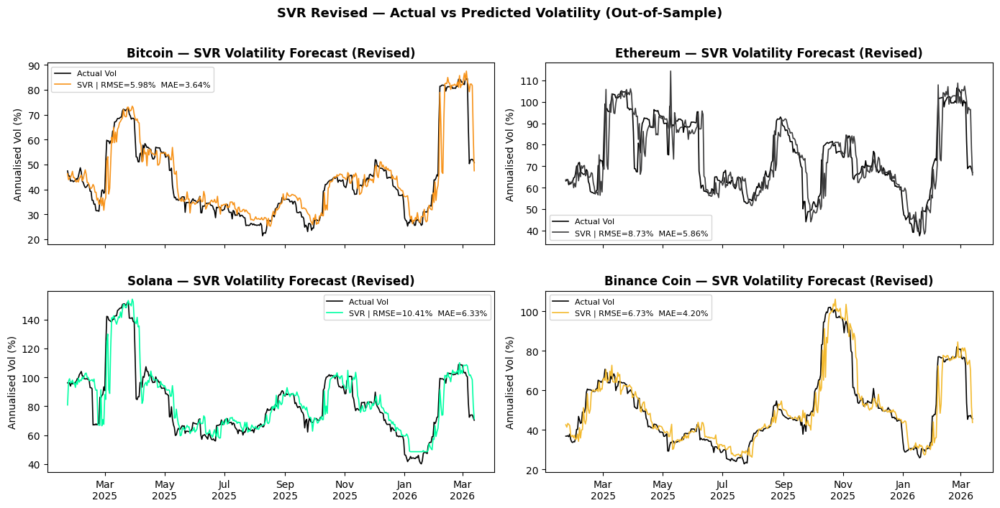

✓ Saved: fig_svr_revised.png
['ret_l1', 'ret_sq_l1', 'rv_l5', 'rv_l30']


In [ ]:
# ============================================================
# SVR MODEL — REVISED (ANALYST-APPROVED SAFE CONSTRAINTS)
# 6 features | conservative grid | TimeSeriesSplit CV
# ============================================================

from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

svr_results    = {}
LEAKAGE_BUFFER = 5   # reduced from 10 — rv_l1 is shortest lag

FEATURES_SVR = ['ret_l1', 'ret_sq_l1', 'rv_l5', 'rv_l30',]

param_grid = {
    'C':       [1, 10, 50],
    'gamma':   ['scale', 0.01, 0.1],
    'epsilon': [0.05, 0.1, 0.5],
}

print("\n" + "=" * 70)
print("  SVR MODEL — REVISED WITH SAFE CONSTRAINTS")
print("=" * 70)

for ticker, name in CRYPTOS.items():
    print(f"\n  Training SVR for {name}...")

    r  = returns[ticker].dropna()
    rv = r.rolling(30).std() * np.sqrt(365)

    df_svr = pd.DataFrame({
        'rv30':         rv,
        'ret_l1':       r.shift(1),
        'ret_sq_l1':    (r ** 2).shift(1),
        'rv_l1':        rv.shift(1),
        'rv_l5':        rv.shift(5),
        'rv_l30':       rv.shift(30),
        'rv5_realised': r.rolling(5).std().shift(1) * np.sqrt(365),
    }).dropna()

    X = df_svr[FEATURES_SVR].values
    y = df_svr['rv30'].values

    split      = int(len(X) * 0.80)
    X_tr, X_te = X[:split], X[split:]
    y_tr, y_te = y[:split], y[split:]

    # Leakage buffer
    X_te_clean  = X_te[LEAKAGE_BUFFER:]
    y_te_clean  = y_te[LEAKAGE_BUFFER:]
    dates_clean = df_svr.index[split + LEAKAGE_BUFFER:]

    scaler   = StandardScaler()
    X_tr_sc  = scaler.fit_transform(X_tr)
    X_te_sc  = scaler.transform(X_te_clean)

    tscv = TimeSeriesSplit(n_splits=5)
    gs   = GridSearchCV(
        SVR(kernel='rbf'), param_grid,
        cv=tscv,
        scoring='neg_root_mean_squared_error',
        n_jobs=-1, verbose=0
    )
    gs.fit(X_tr_sc, y_tr)
    best = gs.best_params_
    print(f"    Best params: C={best['C']}, gamma={best['gamma']}, epsilon={best['epsilon']}")

    # Analyst flag — warn if grid pushes to aggressive end
    if best['C'] == 50 and best['epsilon'] == 0.05:
        print(f"    ⚠ Aggressive combo selected — monitor overfit gap closely")

    svr_model = SVR(kernel='rbf', **best)
    svr_model.fit(X_tr_sc, y_tr)

    y_train_pred = svr_model.predict(X_tr_sc)
    rmse_train   = np.sqrt(mean_squared_error(y_tr, y_train_pred))
    mae_train    = mean_absolute_error(y_tr, y_train_pred)

    y_pred   = svr_model.predict(X_te_sc)
    rmse_val = np.sqrt(mean_squared_error(y_te_clean, y_pred))
    mae_val  = mean_absolute_error(y_te_clean, y_pred)

    # Clip predictions to training vol range — prevents extrapolation artifacts
    y_min, y_max = y_tr.min(), y_tr.max()
    y_pred = np.clip(svr_model.predict(X_te_sc), y_min, y_max)

    gap = rmse_val - rmse_train
    print(f"    {'':12} {'RMSE':>10} {'MAE':>10}")
    print(f"    {'Train (80%)':12} {rmse_train:>9.3f}%  {mae_train:>9.3f}%")
    print(f"    {'Test  (20%)':12} {rmse_val:>9.3f}%  {mae_val:>9.3f}%")
    print(f"    Overfit gap (Test−Train RMSE): {gap:+.3f}%  "
          f"{'⚠ possible overfit' if gap > 5 else '✓ looks healthy'}")

    svr_results[ticker] = {
        'model':          svr_model,
        'best_params':    best,
        'y_pred':         y_pred,
        'y_actual':       y_te_clean,
        'dates':          dates_clean,
        'rmse':           rmse_val,
        'mae':            mae_val,
        'rmse_train':     rmse_train,
        'mae_train':      mae_train,
        'y_train_pred':   y_train_pred,
        'y_train_actual': y_tr,
        'dates_train':    df_svr.index[:split],
        'n_support_vecs': svr_model.n_support_[0],
    }

print("\n✓ SVR revised training complete.")

# ── Plot ──
fig, axes = plt.subplots(2, 2, figsize=(14, 8))
axes = axes.flatten()

for i, (ticker, name) in enumerate(CRYPTOS.items()):
    ax  = axes[i]
    res = svr_results[ticker]

    ax.plot(res['dates'], res['y_actual'],
            color='black', linewidth=1.2, label='Actual Vol')
    ax.plot(res['dates'], res['y_pred'],
            color=colours[ticker], linewidth=1.2,
            label=f"SVR | RMSE={res['rmse']:.2f}%  MAE={res['mae']:.2f}%")

    ax.set_title(f'{name} — SVR Volatility Forecast (Revised)', fontweight='bold')
    ax.set_ylabel('Annualised Vol (%)')
    ax.legend(fontsize=8)
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b\n%Y'))

fig.suptitle('SVR Revised — Actual vs Predicted Volatility (Out-of-Sample)',
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
fig.autofmt_xdate(rotation=0, ha='center')
plt.savefig('fig_svr_revised.png', dpi=150, bbox_inches='tight')
plt.show()
print("✓ Saved: fig_svr_revised.png")
print(FEATURES_SVR)

Train vs Test overfitting check

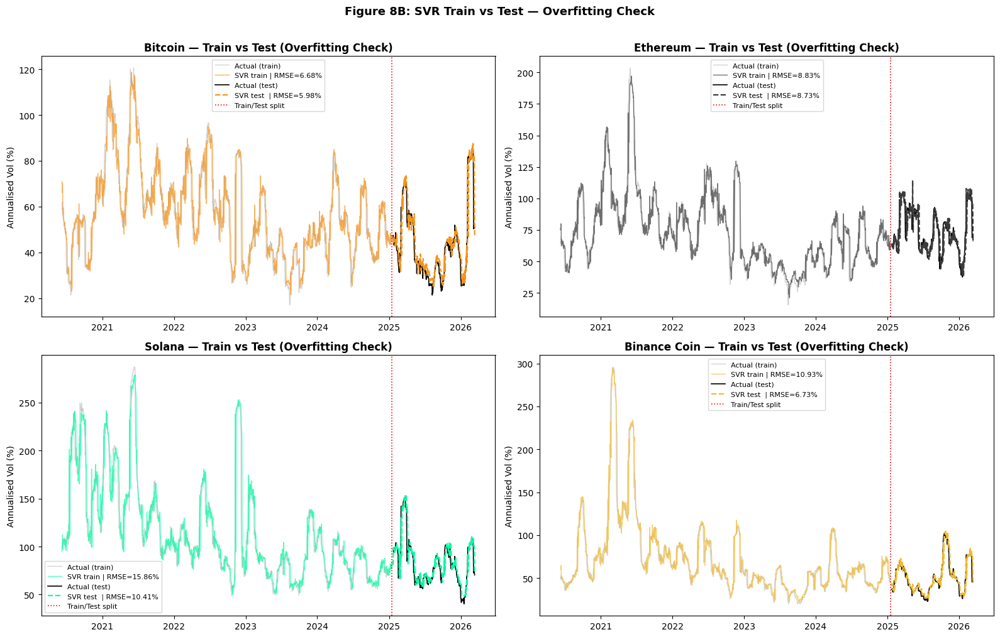

  ✓ Figure 8B saved: fig8b_svr_train_vs_test.png


In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(16, 10))
axes = axes.flatten()
for i, (ticker, name) in enumerate(CRYPTOS.items()):
    ax  = axes[i]
    res = svr_results[ticker]
    ax.plot(res['dates_train'], res['y_train_actual'],
            color='lightgray', lw=1.0, label='Actual (train)')
    ax.plot(res['dates_train'], res['y_train_pred'],
            color=colours[ticker], lw=1.0, alpha=0.7,
            label=f"SVR train | RMSE={res['rmse_train']:.2f}%")
    ax.plot(res['dates'], res['y_actual'],
            color='black', lw=1.2, label='Actual (test)')
    ax.plot(res['dates'], res['y_pred'],
            color=colours[ticker], lw=1.6, linestyle='--',
            label=f"SVR test  | RMSE={res['rmse']:.2f}%")
    ax.axvline(res['dates_train'][-1], color='red', lw=1.2,
               linestyle=':', label='Train/Test split')
    ax.set_title(f'{name} — Train vs Test (Overfitting Check)', fontweight='bold')
    ax.set_ylabel('Annualised Vol (%)')
    ax.legend(fontsize=8)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

fig.suptitle('Figure 8B: SVR Train vs Test — Overfitting Check',
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('fig8b_svr_train_vs_test.png', dpi=150, bbox_inches='tight')
plt.show()
print("  ✓ Figure 8B saved: fig8b_svr_train_vs_test.png")

# **CORRECTED MODEL COMPARISON**

MODEL COMPARISON: GARCH vs LSTM vs SVR       

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
from scipy.stats import t as t_dist
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

def calc_metrics(actual, pred):
    aligned = pd.concat([actual.rename("actual"), pred.rename("pred")], axis=1).dropna()
    if len(aligned) == 0:
        return np.nan, np.nan, np.nan
    rmse = np.sqrt(mean_squared_error(aligned["actual"], aligned["pred"]))
    mae  = mean_absolute_error(aligned["actual"], aligned["pred"])
    corr = aligned["actual"].corr(aligned["pred"])
    return float(rmse), float(mae), float(corr)

def diebold_mariano(e1, e2, h=1):
    d     = e1**2 - e2**2
    T     = len(d)
    dbar  = d.mean()
    cov_terms = sum(
        (1 - k / (h + 1)) * np.cov(d[k:], d[:-k])[0, 1]
        for k in range(1, h + 1)
    )
    var     = (1 / T) * (np.sum((d - dbar)**2) + 2 * cov_terms)
    dm_stat = dbar / np.sqrt(max(var / T, 1e-12))
    p_val   = 2 * t_dist.sf(abs(dm_stat), df=T - 1)
    return float(dm_stat), float(p_val)

model_colours = {
    'actual': 'black',
    'GARCH':  '#E74C3C',
    'LSTM A': '#1f77b4',
    'LSTM B': '#d62728',
    'SVR':    '#9B59B6',
}

comparison  = {}
all_results = []

print("\n" + "=" * 70)
print("  CORRECTED MODEL COMPARISON: GARCH vs LSTM A vs LSTM B vs SVR")
print("=" * 70)

for ticker, name in CRYPTOS.items():
    # ── actual ground truth — THIS ticker only ──
    actual_a = pd.Series(
        lstm_results[ticker]["y_actual"],
        index=pd.DatetimeIndex(lstm_results[ticker]["test_dates"]),
        name="actual"
    )

    # ── model forecasts — THIS ticker only ──
    garch_fc  = garch_oos[ticker].dropna().rename("garch")
    lstm_a_fc = pd.Series(
        lstm_results[ticker]["y_pred"],
        index=pd.DatetimeIndex(lstm_results[ticker]["test_dates"]),
        name="lstm_a"
    )
    lstm_b_fc = pd.Series(
        lstm_b_results[ticker]["y_pred"],
        index=pd.DatetimeIndex(lstm_b_results[ticker]["test_dates"]),
        name="lstm_b"
    )
    svr_fc = pd.Series(
        svr_results[ticker]["y_pred"],
        index=pd.DatetimeIndex(svr_results[ticker]["dates"]),
        name="svr"
    )

    # Align on common dates
    common = actual_a.index.intersection(garch_fc.index).intersection(lstm_b_fc.index).intersection(svr_fc.index)

    if len(common) > 0:
        actual_c = actual_a.reindex(common)
        garch_c  = garch_fc.reindex(common)
        lstm_a_c = lstm_a_fc.reindex(common)
        lstm_b_c = lstm_b_fc.reindex(common)
        svr_c    = svr_fc.reindex(common)

        metrics = {
            'GARCH':  calc_metrics(actual_c, garch_c),
            'LSTM A': calc_metrics(actual_c, lstm_a_c),
            'LSTM B': calc_metrics(actual_c, lstm_b_c),
            'SVR':    calc_metrics(actual_c, svr_c)
        }

        comparison[ticker] = {
            'name': name, 'common': common, 'actual': actual_c,
            'garch': garch_c, 'lstm_a': lstm_a_c, 'lstm_b': lstm_b_c, 'svr': svr_c,
            'metrics': metrics
        }

        for model_name, (rmse, mae, corr) in metrics.items():
            all_results.append({
                'Asset': name, 'Model': model_name,
                'RMSE (%)': rmse, 'MAE (%)': mae, 'Corr': corr
            })

summary_df = pd.DataFrame(all_results)
print("\n✓ Model comparison data compiled.")
display(summary_df.sort_values(['Asset', 'RMSE (%)']))


  CORRECTED MODEL COMPARISON: GARCH vs LSTM A vs LSTM B vs SVR

✓ Model comparison data compiled.


,Asset,Model,RMSE (%),MAE (%),Corr
14,Binance Coin,LSTM B,5.352217,4.059995,0.963036
13,Binance Coin,LSTM A,5.674440,4.134479,0.957391
15,Binance Coin,SVR,6.802240,4.172598,0.938891
12,Binance Coin,GARCH,15.135559,12.024014,0.798584
2,Bitcoin,LSTM B,3.901044,2.502517,0.971857
3,Bitcoin,SVR,6.148291,3.718134,0.928096
1,Bitcoin,LSTM A,7.720327,5.303204,0.894812
0,Bitcoin,GARCH,12.242004,11.416463,0.901129
6,Ethereum,LSTM B,6.409888,4.789114,0.933075
7,Ethereum,SVR,9.039412,6.126242,0.866198


In [ ]:
for ticker, d in comparison.items():
    print(f"\n  {d['name']} ({ticker})")
    print(f"  {'Model':<10} | {'RMSE (Vol%)':>11} | {'MAE (Vol%)':>10} | {'Corr':>6}")
    print("  " + "-" * 45)
    for model, (rmse, mae, corr) in d['metrics'].items():
        print(f"  {model:<10} | {rmse:>10.3f}% | {mae:>9.3f}% | {corr:>6.3f}")
    best = min(d['metrics'].items(), key=lambda x: x[1][0])
    print(f"  ✦ Best: {best[0]}  (RMSE = {best[1][0]:.3f}%")


  Bitcoin (BTC-USD)
  Model      | RMSE (Vol%) | MAE (Vol%) |   Corr
  ---------------------------------------------
  GARCH      |     12.242% |    11.416% |  0.901
  LSTM A     |      7.720% |     5.303% |  0.895
  LSTM B     |      3.901% |     2.503% |  0.972
  SVR        |      6.148% |     3.718% |  0.928
  ✦ Best: LSTM B  (RMSE = 3.901%

  Ethereum (ETH-USD)
  Model      | RMSE (Vol%) | MAE (Vol%) |   Corr
  ---------------------------------------------
  GARCH      |     14.216% |    12.527% |  0.694
  LSTM A     |     15.186% |    11.804% |  0.719
  LSTM B     |      6.410% |     4.789% |  0.933
  SVR        |      9.039% |     6.126% |  0.866
  ✦ Best: LSTM B  (RMSE = 6.410%

  Solana (SOL-USD)
  Model      | RMSE (Vol%) | MAE (Vol%) |   Corr
  ---------------------------------------------
  GARCH      |     19.740% |    16.910% |  0.672
  LSTM A     |     12.057% |     9.890% |  0.904
  LSTM B     |      6.917% |     4.857% |  0.950
  SVR        |      9.410% |     5.875% |

In [ ]:
e_g = (d['actual'] - d['garch']).dropna().values
e_l = (d['actual'] - d['lstm_a']).dropna().values # Changed to lstm_a
e_s = (d['actual'] - d['svr']).dropna().values
e_lb = (d['actual'] - d['lstm_b']).dropna().values # Errors for LSTM B

n   = min(len(e_g), len(e_l), len(e_s), len(e_lb)) # Include e_lb in min calculation

dm_gl, p_gl = diebold_mariano(e_g[:n], e_l[:n])
dm_gs, p_gs = diebold_mariano(e_g[:n], e_s[:n])
dm_glb, p_glb = diebold_mariano(e_g[:n], e_lb[:n]) # GARCH vs LSTM B
dm_llb, p_llb = diebold_mariano(e_l[:n], e_lb[:n]) # LSTM A vs LSTM B

print(f"  DM test GARCH vs LSTM A: stat={dm_gl:.3f}  p={p_gl:.4f}  "
      f"{'significant' if p_gl < 0.05 else 'not significant'}")
print(f"  DM test GARCH vs SVR:    stat={dm_gs:.3f}  p={p_gs:.4f}  "
      f"{'significant' if p_gs < 0.05 else 'not significant'}")
print(f"  DM test GARCH vs LSTM B: stat={dm_glb:.3f}  p={p_glb:.4f}  " # New DM test
      f"{'significant' if p_glb < 0.05 else 'not significant'}")
print(f"  DM test LSTM A vs LSTM B: stat={dm_llb:.3f}  p={p_llb:.4f}  " # New DM test
      f"{'significant' if p_llb < 0.05 else 'not significant'}")

  DM test GARCH vs LSTM A: stat=11.690  p=0.0000  significant
  DM test GARCH vs SVR:    stat=10.494  p=0.0000  significant
  DM test GARCH vs LSTM B: stat=11.683  p=0.0000  significant
  DM test LSTM A vs LSTM B: stat=1.841  p=0.0664  not significant


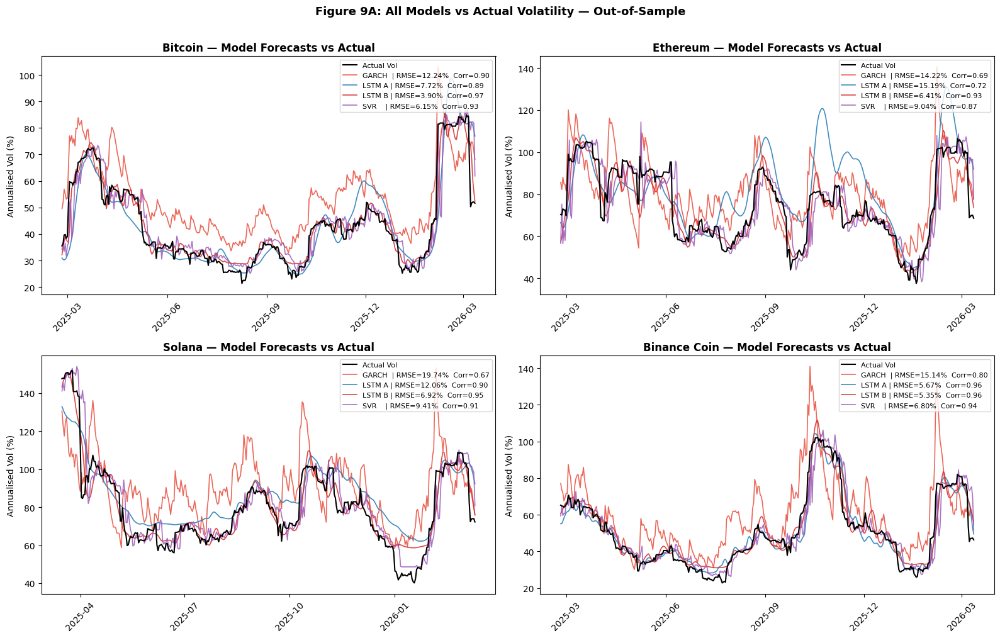

  ✓ Figure 9A saved: fig9a_model_comparison_all_assets.png


In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(16, 10))
axes = axes.flatten()
for i, (ticker, d) in enumerate(comparison.items()):
    ax = axes[i]
    m  = d['metrics']
    ax.plot(d['common'], d['actual'], color=model_colours['actual'],
            lw=1.5, label='Actual Vol', zorder=5)
    ax.plot(d['common'], d['garch'],  color=model_colours['GARCH'],
            lw=1.2, alpha=0.85,
            label=f"GARCH  | RMSE={m['GARCH'][0]:.2f}%  Corr={m['GARCH'][2]:.2f}")
    ax.plot(d['common'], d['lstm_a'],   color=model_colours['LSTM A'],
            lw=1.2, alpha=0.85,
            label=f"LSTM A | RMSE={m['LSTM A'][0]:.2f}%  Corr={m['LSTM A'][2]:.2f}")
    ax.plot(d['common'], d['lstm_b'],   color=model_colours['LSTM B'],
            lw=1.2, alpha=0.85,
            label=f"LSTM B | RMSE={m['LSTM B'][0]:.2f}%  Corr={m['LSTM B'][2]:.2f}")
    ax.plot(d['common'], d['svr'],    color=model_colours['SVR'],
            lw=1.2, alpha=0.85,
            label=f"SVR    | RMSE={m['SVR'][0]:.2f}%  Corr={m['SVR'][2]:.2f}")
    ax.set_title(f"{d['name']} — Model Forecasts vs Actual", fontweight='bold')
    ax.set_ylabel('Annualised Vol (%)')
    ax.legend(fontsize=8, loc='upper right')
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)

fig.suptitle('Figure 9A: All Models vs Actual Volatility — Out-of-Sample',
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('fig9a_model_comparison_all_assets.png', dpi=150, bbox_inches='tight')
plt.show()
print("  ✓ Figure 9A saved: fig9a_model_comparison_all_assets.png")

forecast errors

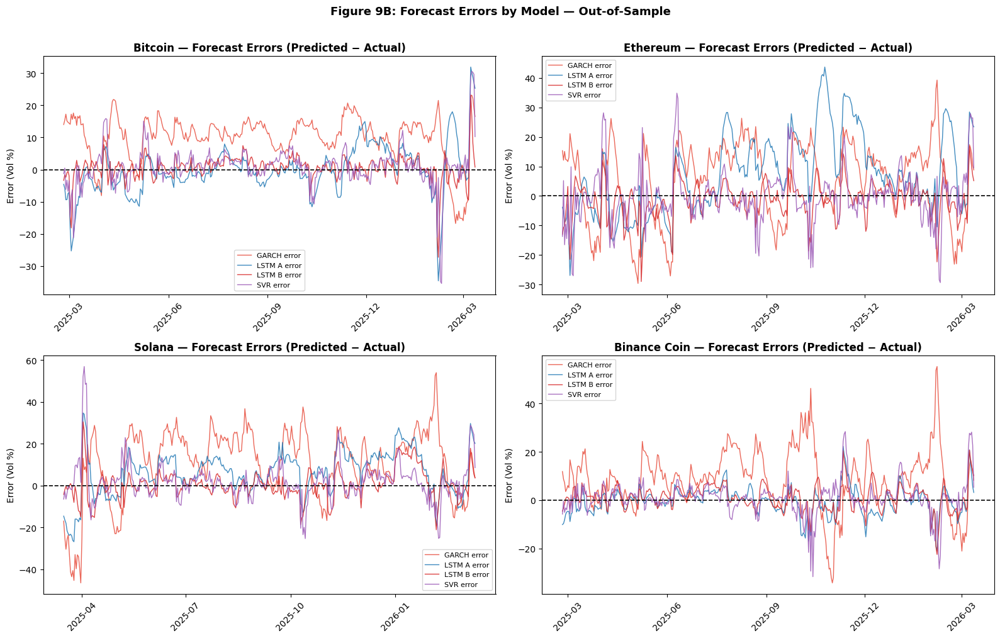

  ✓ Figure 9B saved: fig9b_forecast_errors.png


In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(16, 10))
axes = axes.flatten()
for i, (ticker, d) in enumerate(comparison.items()):
    ax = axes[i]
    ax.plot(d['common'], d['garch']  - d['actual'],
            color=model_colours['GARCH'],  lw=1.0, alpha=0.85, label='GARCH error')
    ax.plot(d['common'], d['lstm_a']   - d['actual'],
            color=model_colours['LSTM A'], lw=1.0, alpha=0.85, label='LSTM A error')
    ax.plot(d['common'], d['lstm_b']   - d['actual'],
            color=model_colours['LSTM B'], lw=1.0, alpha=0.85, label='LSTM B error') # Added LSTM B errors
    ax.plot(d['common'], d['svr']    - d['actual'],
            color=model_colours['SVR'],    lw=1.0, alpha=0.85, label='SVR error')
    ax.axhline(0, color='black', lw=1.2, linestyle='--')
    ax.set_title(f"{d['name']} — Forecast Errors (Predicted − Actual)", fontweight='bold')
    ax.set_ylabel('Error (Vol %)')
    ax.legend(fontsize=8)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)

fig.suptitle('Figure 9B: Forecast Errors by Model — Out-of-Sample',
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('fig9b_forecast_errors.png', dpi=150, bbox_inches='tight')
plt.show()
print("  ✓ Figure 9B saved: fig9b_forecast_errors.png")

RMSE bar chart

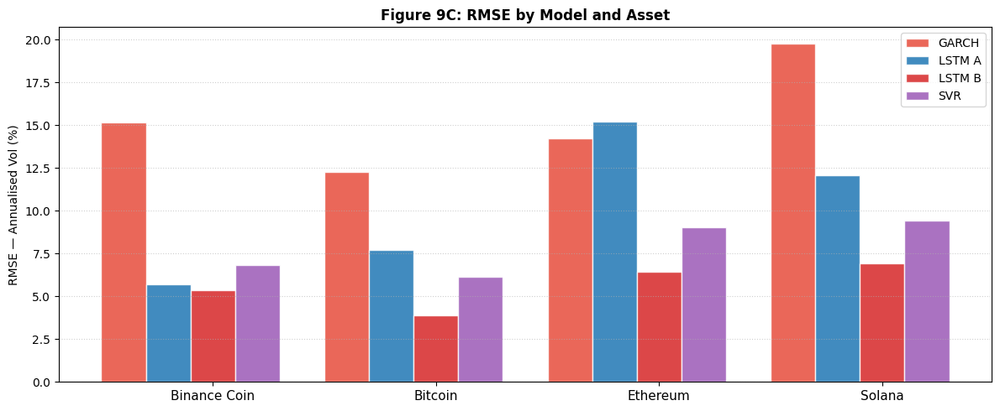

  ✓ Figure 9C saved: fig9c_rmse_bar.png

  Date overlap per asset:
    Bitcoin         2025-02-24 → 2026-03-12  (382 days)
    Ethereum        2025-02-24 → 2026-03-12  (382 days)
    Solana          2025-03-16 → 2026-03-12  (362 days)
    Binance Coin    2025-02-24 → 2026-03-12  (382 days)


In [ ]:
fig, ax = plt.subplots(figsize=(12, 5))
summary_df = pd.DataFrame(all_results)
# FIX: Use capitalized column names 'Asset', 'Model', and 'RMSE (%)' to match summary_df structure
bar_df    = summary_df.pivot(index='Asset', columns='Model', values='RMSE (%)')
bar_width = 0.2
x         = np.arange(len(bar_df))
offsets   = [-2*bar_width, -bar_width, 0, bar_width]
bar_cols  = [model_colours['GARCH'], model_colours['LSTM A'], model_colours['LSTM B'], model_colours['SVR']]

for model, offset, col in zip(['GARCH','LSTM A','LSTM B','SVR'], offsets, bar_cols):
    ax.bar(x + offset, bar_df[model], width=bar_width,
           label=model, color=col, alpha=0.85, edgecolor='white')

ax.set_xticks(x)
ax.set_xticklabels(bar_df.index, fontsize=11)
ax.set_ylabel('RMSE — Annualised Vol (%)')
ax.set_title('Figure 9C: RMSE by Model and Asset', fontweight='bold', fontsize=12)
ax.legend(fontsize=10)
ax.grid(axis='y', linestyle=':', alpha=0.6)
plt.tight_layout()
plt.savefig('fig9c_rmse_bar.png', dpi=150, bbox_inches='tight')
plt.show()
print("  ✓ Figure 9C saved: fig9c_rmse_bar.png")

print("\n  Date overlap per asset:")
for ticker, d in comparison.items():
    print(f"    {d['name']:<15} {d['common'][0].date()} → "
          f"{d['common'][-1].date()}  ({len(d['common'])} days)")

In [ ]:
# ============================================================
# GENERATE LSTM B FORWARD FORECASTS (required for Monte Carlo)
# ============================================================

# Define MC_HORIZON here as it's used in this cell
N_SIMULATIONS = 5000
MC_HORIZON    = 80 # Days

lstm_b_forecasts = {}

print("\n" + "=" * 65)
print(f"  LSTM B — GENERATING {MC_HORIZON}-DAY FORWARD FORECASTS")
print("=" * 65)

for ticker, name in CRYPTOS.items():
    print(f"  Forecasting {name}...")

    res         = lstm_b_results[ticker]
    model       = res['model']
    feat_scaler = res['feat_scaler']
    tgt_scaler  = res['tgt_scaler']
    data        = res['data']

    current_seq = feat_scaler.transform(data.iloc[-SEQUENCE_LEN:][FEATURES])
    recent_rv30 = list(data['rv30'].iloc[-6:].values)
    future_preds = []

    lag1_idx = FEATURES.index('vol_lag1')
    lag5_idx = FEATURES.index('vol_lag5')

    for step in range(MC_HORIZON):
        x_input   = current_seq.reshape(1, SEQUENCE_LEN, len(FEATURES))
        pred_sc   = model.predict(x_input, verbose=0)[0, 0]
        pred_rv30 = tgt_scaler.inverse_transform([[pred_sc]])[0, 0]
        future_preds.append(pred_rv30)

        next_row = current_seq[-1].copy()
        recent_rv30.append(pred_rv30)

        dummy = np.zeros((1, len(FEATURES)))
        dummy[0, lag1_idx] = recent_rv30[-2]
        dummy[0, lag5_idx] = recent_rv30[-6] if len(recent_rv30) >= 6 else recent_rv30[0]
        scaled_dummy        = feat_scaler.transform(dummy)
        next_row[lag1_idx]  = scaled_dummy[0, lag1_idx]
        next_row[lag5_idx]  = scaled_dummy[0, lag5_idx]
        current_seq = np.vstack([current_seq[1:], next_row])

    lstm_b_forecasts[ticker] = {'forecast': np.array(future_preds)}
    print(f"    Day+1={future_preds[0]:.2f}%  Day+30={future_preds[29]:.2f}%  Day+90={future_preds[-1]:.2f}%")


  LSTM B — GENERATING 80-DAY FORWARD FORECASTS
  Forecasting Bitcoin...
    Day+1=50.61%  Day+30=38.87%  Day+90=38.70%
  Forecasting Ethereum...
    Day+1=67.81%  Day+30=37.19%  Day+90=39.37%
  Forecasting Solana...
    Day+1=69.68%  Day+30=60.16%  Day+90=60.17%
  Forecasting Binance Coin...
    Day+1=51.28%  Day+30=37.44%  Day+90=37.18%



  MONTE CARLO SIMULATION (5000 paths, 80 days)

  Running Monte Carlo for Bitcoin...
    ✓ Bitcoin simulated 5000 paths over 80 days.

  Running Monte Carlo for Ethereum...
    ✓ Ethereum simulated 5000 paths over 80 days.

  Running Monte Carlo for Solana...
    ✓ Solana simulated 5000 paths over 80 days.

  Running Monte Carlo for Binance Coin...
    ✓ Binance Coin simulated 5000 paths over 80 days.


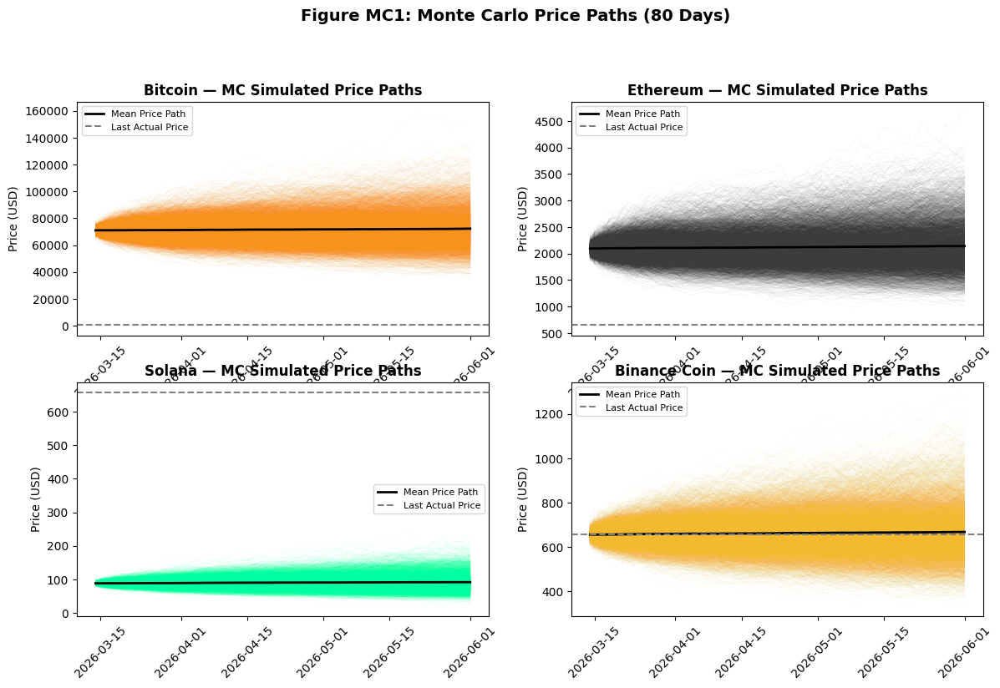

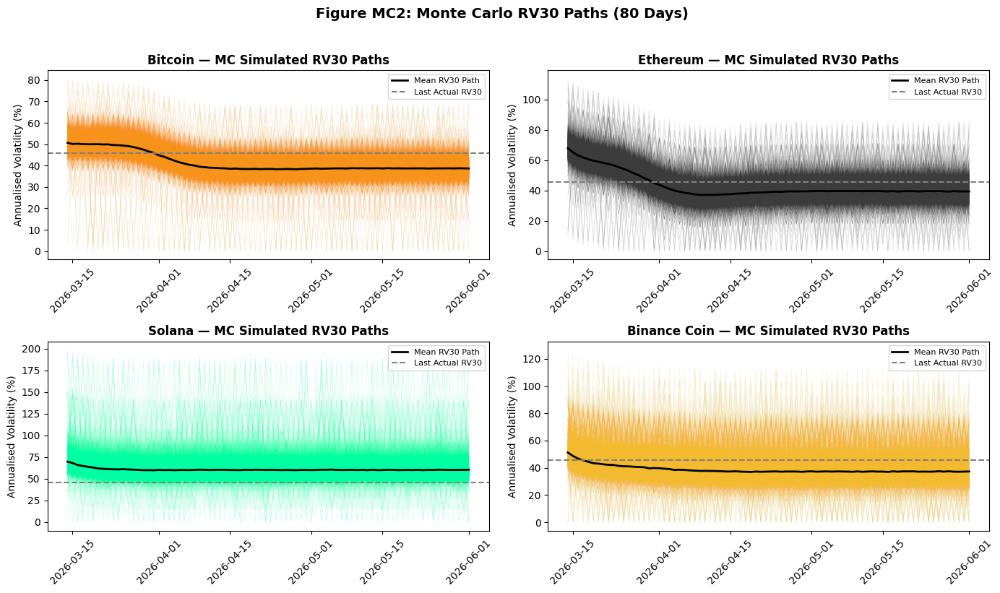


  MONTE CARLO SIMULATION SUMMARY STATISTICS
      Crypto Last Actual Price Mean Final Price Median Final Price Std Dev Final Price Mean Price Change (%) Mean Final RV30 (%) Median Final RV30 (%) Std Dev Final RV30 (%)
     Bitcoin            655.88         72253.40           70824.36            14263.05             10916.22%               38.64                 38.52                   4.23
    Ethereum            655.88          2139.24            2093.47              448.69               226.16%               39.32                 38.54                   6.64
      Solana            655.88            91.72              88.24               26.61               -86.02%               60.39                 58.76                  11.54
Binance Coin            655.88           668.19             657.47              126.09                 1.88%               37.28                 36.09                   9.41

  ✓ Monte Carlo simulation complete. Figures saved locally if needed.


In [ ]:
# ============================================================
# MONTE CARLO SIMULATION
# ============================================================

# Configuration for Monte Carlo
N_SIMULATIONS = 5000
MC_HORIZON    = 80 # Days

print("\n" + "=" * 65)
print(f"  MONTE CARLO SIMULATION ({N_SIMULATIONS} paths, {MC_HORIZON} days)")
print("=" * 65)

mc_results = {}

for ticker, name in CRYPTOS.items():
    print(f"\n  Running Monte Carlo for {name}...")

    # Get results from LSTM Model B
    res_lstm_b = lstm_b_results[ticker]
    model_b_raw_data = res_lstm_b['data'] # Contains log_ret, rv30 etc.

    # Calculate standardized residuals from LSTM Model B's training
    # We need the full training set for residuals
    split_idx    = int(len(res_lstm_b['data']) * TRAIN_SPLIT)
    train_df_mc  = res_lstm_b['data'].iloc[:split_idx]

    X_train_sc_full, y_train_sc_full = make_sequences(
        res_lstm_b['feat_scaler'].transform(train_df_mc[FEATURES]),
        res_lstm_b['tgt_scaler'].transform(train_df_mc[[TARGET]]).flatten(),
        SEQUENCE_LEN
    )

    y_train_pred_sc = res_lstm_b['model'].predict(X_train_sc_full, verbose=0)
    y_train_pred_rv30 = res_lstm_b['tgt_scaler'].inverse_transform(y_train_pred_sc).flatten()
    y_train_actual_rv30 = res_lstm_b['tgt_scaler'].inverse_transform(y_train_sc_full.reshape(-1,1)).flatten()

    # Calculate residuals from LSTM B's training on the actual RV30
    train_residuals = y_train_actual_rv30 - y_train_pred_rv30

    # Ensure residuals are centered
    train_residuals -= np.mean(train_residuals)

    # Get the 90-day LSTM B forecast
    lstm_b_forecast_rv30 = lstm_b_forecasts[ticker]['forecast']

    # Get the last actual Close price and rv30 value
    last_close_price = model_b_raw_data['Close'].iloc[-1]
    last_rv30        = model_b_raw_data['rv30'].iloc[-1]
    last_log_ret     = model_b_raw_data['log_ret'].iloc[-1]

    # Prepare for simulation
    simulated_paths_prices = np.zeros((MC_HORIZON, N_SIMULATIONS))
    simulated_paths_rv30   = np.zeros((MC_HORIZON, N_SIMULATIONS))

    # Store the daily log returns generated by the simulation
    simulated_paths_log_ret = np.zeros((MC_HORIZON, N_SIMULATIONS))

    for s in range(N_SIMULATIONS):
        current_price = last_close_price
        current_rv30  = last_rv30
        current_log_ret = last_log_ret

        # Initialize histories for features in the recursive step for each simulation path
        sim_recent_returns = list(model_b_raw_data["log_ret"].iloc[-7:].values)
        sim_recent_rv30    = list(model_b_raw_data["rv30"].iloc[-5:].values)
        # Extend with the actual last value, then populate with forecasted/simulated
        sim_recent_returns.append(current_log_ret)
        sim_recent_rv30.append(current_rv30)

        # Create a deep copy of the current_seq for LSTM feature generation
        # to avoid modifying the original sequence in the loop
        seed_df_sim = model_b_raw_data.iloc[-SEQUENCE_LEN:].copy()
        current_seq_sim = res_lstm_b['feat_scaler'].transform(seed_df_sim[FEATURES])
        # Update the initial current_seq_sim with the latest actual values, if not already done
        # This ensures the first prediction uses the most current data point available.

        for d in range(MC_HORIZON):
            # Volatility forecast for day d+1 (from LSTM Model B's direct forecast)
            forecast_rv30_for_day = lstm_b_forecast_rv30[d] # Use the pre-computed 90-day forecast

            # Sample a residual for the current day's volatility shock
            # This residual is applied to the *predicted* rv30 for the current day
            # to generate the simulated rv30.
            volatility_shock = np.random.choice(train_residuals)
            simulated_rv30_day = max(0.1, forecast_rv30_for_day + volatility_shock) # Ensure positive volatility

            # Store simulated rv30
            simulated_paths_rv30[d, s] = simulated_rv30_day

            # Generate a log return using the simulated rv30
            # For simplicity, assume daily returns follow a Normal distribution with 0 mean
            # and std_dev = simulated_rv30_day / sqrt(365) / 100 (since rv30 is annualized %)
            daily_std_dev = (simulated_rv30_day / np.sqrt(365)) / 100
            simulated_daily_log_ret = np.random.normal(0, daily_std_dev)

            simulated_paths_log_ret[d, s] = simulated_daily_log_ret

            # Update price path
            current_price *= np.exp(simulated_daily_log_ret)
            simulated_paths_prices[d, s] = current_price

            # Update lagged features for the next day's volatility forecast generation (if we were doing recursive LSTM)
            # Since we are using pre-computed LSTM B forecast for RV30, the recursion for RV30 features is simpler.
            # However, for log_ret features (ret_mean_7, ret_std_7), we need to update sim_recent_returns
            sim_recent_returns.append(simulated_daily_log_ret * 100) # Store as percentage
            sim_recent_rv30.append(simulated_rv30_day)

    mc_results[ticker] = {
        'prices':    simulated_paths_prices,
        'rv30':      simulated_paths_rv30,
        'log_ret':   simulated_paths_log_ret,
        'dates':     pd.date_range(start=model_b_raw_data.index[-1] + pd.Timedelta(days=1), periods=MC_HORIZON, freq='D')
    }
    print(f"    ✓ {name} simulated {N_SIMULATIONS} paths over {MC_HORIZON} days.")

# --------------------------------------------------------------------------
# Visualize Monte Carlo Results
# --------------------------------------------------------------------------

fig_mc_prices, axes_prices = plt.subplots(2, 2, figsize=(14, 8))
axes_prices = axes_prices.flatten()
fig_mc_rv30, axes_rv30 = plt.subplots(2, 2, figsize=(14, 8))
axes_rv30 = axes_rv30.flatten()

all_final_prices = []
all_final_rv30 = []

for i, (ticker, name) in enumerate(CRYPTOS.items()):
    res_mc = mc_results[ticker]
    dates  = res_mc['dates']
    last_actual_price = model_b_raw_data['Close'].iloc[-1]
    last_actual_rv30  = model_b_raw_data['rv30'].iloc[-1]

    # Plot Price Paths
    ax_p = axes_prices[i]
    ax_p.plot(dates, res_mc['prices'], color=colours[ticker], alpha=0.05, linewidth=0.5)
    ax_p.plot(dates, np.mean(res_mc['prices'], axis=1), color='black', linewidth=2, label='Mean Price Path')
    ax_p.axhline(last_actual_price, linestyle='--', color='gray', label='Last Actual Price')
    ax_p.set_title(f'{name} — MC Simulated Price Paths', fontweight='bold')
    ax_p.set_ylabel('Price (USD)')
    ax_p.legend(fontsize=8)
    ax_p.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    plt.setp(ax_p.xaxis.get_majorticklabels(), rotation=45)
    all_final_prices.extend(res_mc['prices'][-1, :])

    # Plot RV30 Paths
    ax_rv = axes_rv30[i]
    ax_rv.plot(dates, res_mc['rv30'], color=colours[ticker], alpha=0.05, linewidth=0.5)
    ax_rv.plot(dates, np.mean(res_mc['rv30'], axis=1), color='black', linewidth=2, label='Mean RV30 Path')
    ax_rv.axhline(last_actual_rv30, linestyle='--', color='gray', label='Last Actual RV30')
    ax_rv.set_title(f'{name} — MC Simulated RV30 Paths', fontweight='bold')
    ax_rv.set_ylabel('Annualised Volatility (%)')
    ax_rv.legend(fontsize=8)
    ax_rv.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    plt.setp(ax_rv.xaxis.get_majorticklabels(), rotation=45)
    all_final_rv30.extend(res_mc['rv30'][-1, :])

fig_mc_prices.suptitle(f'Figure MC1: Monte Carlo Price Paths ({MC_HORIZON} Days)', fontsize=14, fontweight='bold', y=1.02)
fig_mc_rv30.suptitle(f'Figure MC2: Monte Carlo RV30 Paths ({MC_HORIZON} Days)', fontsize=14, fontweight='bold', y=1.02)

plt.tight_layout()
plt.show()

print("\n" + "=" * 65)
print("  MONTE CARLO SIMULATION SUMMARY STATISTICS")
print("=" * 65)

summary_data = []
for ticker, name in CRYPTOS.items():
    res_mc = mc_results[ticker]
    final_prices = res_mc['prices'][-1, :]
    final_rv30 = res_mc['rv30'][-1, :]
    last_actual_price = model_b_raw_data['Close'].iloc[-1]

    # Calculate statistics for prices
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    std_price = np.std(final_prices)

    # Calculate statistics for RV30
    mean_rv30 = np.mean(final_rv30)
    median_rv30 = np.median(final_rv30)
    std_rv30 = np.std(final_rv30)

    # Price change over the MC_HORIZON
    mean_price_change_pct = (mean_price / last_actual_price - 1) * 100

    summary_data.append({
        'Crypto': name,
        'Last Actual Price': f'{last_actual_price:.2f}',
        'Mean Final Price': f'{mean_price:.2f}',
        'Median Final Price': f'{median_price:.2f}',
        'Std Dev Final Price': f'{std_price:.2f}',
        'Mean Price Change (%)': f'{mean_price_change_pct:.2f}%',
        'Mean Final RV30 (%)': f'{mean_rv30:.2f}',
        'Median Final RV30 (%)': f'{median_rv30:.2f}',
        'Std Dev Final RV30 (%)': f'{std_rv30:.2f}'
    })

mc_summary_df = pd.DataFrame(summary_data)
print(mc_summary_df.to_string(index=False))

print("\n  ✓ Monte Carlo simulation complete. Figures saved locally if needed.")


  MONTE CARLO — GBM + LSTM B VOL (2500 paths, 90d)

  Simulating Bitcoin...
    S0 = $70,968.27
    Mean final price  = $71,826.19  (+1.21%)
    VaR  95%  = -27.83%
    VaR  99%  = -36.32%
    CVaR 95%  = -33.20%

  Simulating Ethereum...
    S0 = $2,092.56
    Mean final price  = $2,113.90  (+1.02%)
    VaR  95%  = -29.41%
    VaR  99%  = -38.38%
    CVaR 95%  = -34.99%

  Simulating Solana...
    S0 = $88.15
    Mean final price  = $88.24  (+0.10%)
    VaR  95%  = -40.41%
    VaR  99%  = -51.27%
    CVaR 95%  = -46.95%

  Simulating Binance Coin...
    S0 = $655.88
    Mean final price  = $665.94  (+1.53%)
    VaR  95%  = -26.16%
    VaR  99%  = -35.32%
    CVaR 95%  = -31.55%


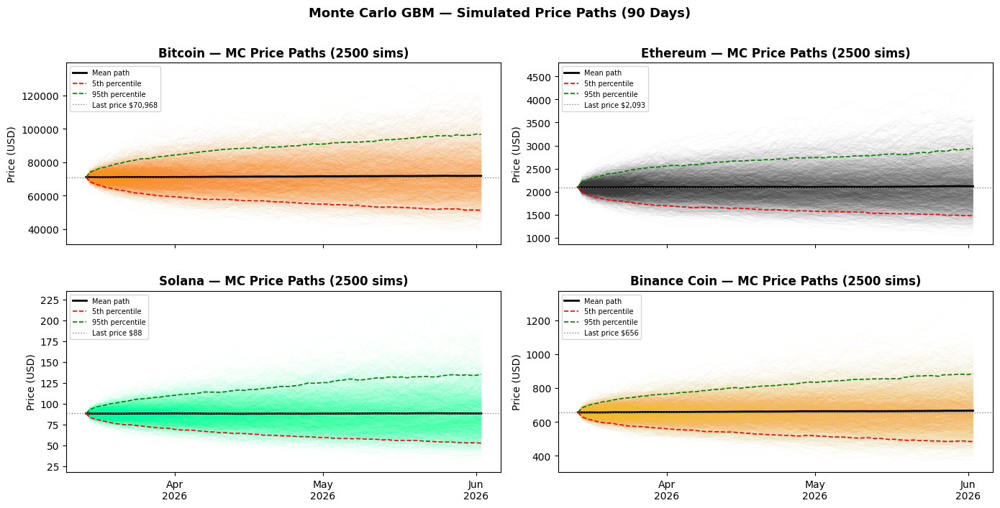

✓ Saved: fig_mc_paths.png


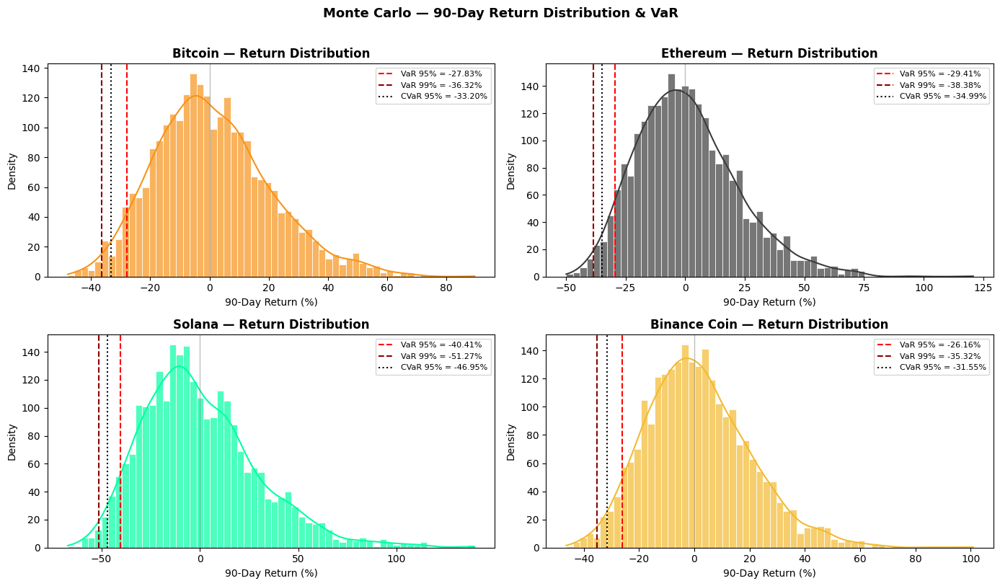

✓ Saved: fig_mc_distributions.png

  MONTE CARLO SUMMARY
  Asset                S0   Mean Final  Mean Ret%   VaR95%   VaR99%   CVaR95%
  -------------------------------------------------------------------------
  Bitcoin      $   70,968 $     71,826      1.21%  -27.83%  -36.32%   -33.20%
  Ethereum     $    2,093 $      2,114      1.02%  -29.41%  -38.38%   -34.99%
  Solana       $       88 $         88      0.10%  -40.41%  -51.27%   -46.95%
  Binance Coin $      656 $        666      1.53%  -26.16%  -35.32%   -31.55%

✓ Monte Carlo complete.


In [ ]:
# ============================================================
# MONTE CARLO SIMULATION — GBM WITH LSTM B VOLATILITY
# Based on university simulate_path() approach
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns

# ── Config ──
N_SIMULATIONS = 2500   # run 500 first to test, then bump to 5000
MC_HORIZON    = 90
RISK_FREE     = 0.05   # annual risk-free rate (same as university code)
np.random.seed(42)

# ── Core GBM path simulator (adapted from university simulate_path) ──
def simulate_path_gbm(S0, sigma_path, r, n_paths):
    """
    GBM simulation with time-varying sigma (from LSTM B forecast).
    sigma_path: array of annualised vol (%) for each day — shape (MC_HORIZON,)
    Returns price matrix shape (MC_HORIZON+1, n_paths)
    """
    steps  = len(sigma_path)
    dt     = 1 / 365
    S      = np.zeros((steps + 1, n_paths))
    S[0]   = S0

    for t in range(1, steps + 1):
        sigma_daily = (sigma_path[t - 1] / 100)   # convert % to decimal
        Z           = np.random.standard_normal(n_paths)
        S[t]        = S[t-1] * np.exp(
            (r - 0.5 * sigma_daily**2) * dt + sigma_daily * np.sqrt(dt) * Z
        )
    return S

# ── Run simulation ──
mc_results = {}

print("\n" + "=" * 65)
print(f"  MONTE CARLO — GBM + LSTM B VOL ({N_SIMULATIONS} paths, {MC_HORIZON}d)")
print("=" * 65)

for ticker, name in CRYPTOS.items():
    print(f"\n  Simulating {name}...")

    data          = lstm_b_results[ticker]['data']
    S0            = float(data['Close'].iloc[-1])
    sigma_path    = lstm_b_forecasts[ticker]['forecast']   # LSTM B 90-day vol forecast

    paths = simulate_path_gbm(S0, sigma_path, RISK_FREE, N_SIMULATIONS)

    final_prices  = paths[-1, :]
    returns_mc    = (final_prices - S0) / S0 * 100

    # ── Risk metrics ──
    VaR_95  = np.percentile(returns_mc, 5)
    VaR_99  = np.percentile(returns_mc, 1)
    CVaR_95 = returns_mc[returns_mc <= VaR_95].mean()

    future_dates = pd.date_range(
    start=data.index[-1] + pd.Timedelta(days=1),
    periods=len(paths), freq='D'
    )

    mc_results[ticker] = {
        'paths':        paths,
        'final_prices': final_prices,
        'returns_mc':   returns_mc,
        'dates':        future_dates,
        'S0':           S0,
        'VaR_95':       VaR_95,
        'VaR_99':       VaR_99,
        'CVaR_95':      CVaR_95,
        'sigma_path':   sigma_path,
    }

    print(f"    S0 = ${S0:,.2f}")
    print(f"    Mean final price  = ${np.mean(final_prices):,.2f}  ({np.mean(returns_mc):+.2f}%)")
    print(f"    VaR  95%  = {VaR_95:.2f}%")
    print(f"    VaR  99%  = {VaR_99:.2f}%")
    print(f"    CVaR 95%  = {CVaR_95:.2f}%")

# ── Figure 1: Simulated Price Paths ──
fig, axes = plt.subplots(2, 2, figsize=(14, 8))
axes = axes.flatten()

for i, (ticker, name) in enumerate(CRYPTOS.items()):
    ax  = axes[i]
    res = mc_results[ticker]

    # Plot paths (thin, transparent)
    ax.plot(res['dates'][:res['paths'].shape[0]], res['paths'],
            color=colours[ticker], alpha=0.03, linewidth=0.5)

    n = res['paths'].shape[0]

    # Mean path
    ax.plot(res['dates'], np.mean(res['paths'], axis=1),
            color='black', linewidth=2, label='Mean path')

    # Percentile bands
    ax.plot(res['dates'], np.percentile(res['paths'], 5, axis=1),
            color='red', linewidth=1.2, linestyle='--', label='5th percentile')
    ax.plot(res['dates'], np.percentile(res['paths'], 95, axis=1),
            color='green', linewidth=1.2, linestyle='--', label='95th percentile')

    # Last actual price
    ax.axhline(res['S0'], color='gray', linewidth=1,
               linestyle=':', label=f'Last price ${res["S0"]:,.0f}')

    ax.set_title(f'{name} — MC Price Paths ({N_SIMULATIONS} sims)', fontweight='bold')
    ax.set_ylabel('Price (USD)')
    ax.legend(fontsize=7)
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b\n%Y'))

fig.suptitle(f'Monte Carlo GBM — Simulated Price Paths ({MC_HORIZON} Days)',
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
fig.autofmt_xdate(rotation=0, ha='center')
plt.savefig('fig_mc_paths.png', dpi=150, bbox_inches='tight')
plt.show()
print("✓ Saved: fig_mc_paths.png")

# ── Figure 2: Return Distribution + VaR (university histogram style) ──
fig, axes = plt.subplots(2, 2, figsize=(14, 8))
axes = axes.flatten()

for i, (ticker, name) in enumerate(CRYPTOS.items()):
    ax  = axes[i]
    res = mc_results[ticker]

    sns.histplot(res['returns_mc'], bins=60, kde=True,
                 color=colours[ticker], edgecolor='white',
                 alpha=0.7, ax=ax)

    ax.axvline(res['VaR_95'],  color='red',    linestyle='--',
               linewidth=1.5, label=f"VaR 95% = {res['VaR_95']:.2f}%")
    ax.axvline(res['VaR_99'],  color='darkred', linestyle='--',
               linewidth=1.5, label=f"VaR 99% = {res['VaR_99']:.2f}%")
    ax.axvline(res['CVaR_95'], color='black',  linestyle=':',
               linewidth=1.5, label=f"CVaR 95% = {res['CVaR_95']:.2f}%")
    ax.axvline(0, color='gray', linewidth=1, linestyle='-', alpha=0.5)

    ax.set_title(f'{name} — Return Distribution', fontweight='bold')
    ax.set_xlabel(f'{MC_HORIZON}-Day Return (%)')
    ax.set_ylabel('Density')
    ax.legend(fontsize=8)

fig.suptitle(f'Monte Carlo — {MC_HORIZON}-Day Return Distribution & VaR',
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('fig_mc_distributions.png', dpi=150, bbox_inches='tight')
plt.show()
print("✓ Saved: fig_mc_distributions.png")

# ── Summary Table ──
print("\n" + "=" * 75)
print("  MONTE CARLO SUMMARY")
print("=" * 75)
print(f"  {'Asset':<12} {'S0':>10} {'Mean Final':>12} {'Mean Ret%':>10} {'VaR95%':>8} {'VaR99%':>8} {'CVaR95%':>9}")
print("  " + "-" * 73)
for ticker, name in CRYPTOS.items():
    res = mc_results[ticker]
    print(f"  {name:<12} ${res['S0']:>9,.0f} ${np.mean(res['final_prices']):>11,.0f} "
          f"{np.mean(res['returns_mc']):>9.2f}% {res['VaR_95']:>7.2f}% "
          f"{res['VaR_99']:>7.2f}% {res['CVaR_95']:>8.2f}%")

print("\n✓ Monte Carlo complete.")

In [ ]:
import pandas as pd

# Reconstruct summary from all_results list collected in previous cells
results_df = pd.DataFrame(all_results)

# Aggregate metrics by Model
summary = results_df.groupby('Model').agg({
    'RMSE (%)': ['mean', 'std'],
    'MAE (%)': 'mean',
    'Corr': 'mean'
})

# Flatten columns
summary.columns = ['Avg_RMSE', 'Std_RMSE', 'Avg_MAE', 'Avg_Corr']

# Rank models by RMSE (lower is better)
summary['Avg_Rank'] = summary['Avg_RMSE'].rank()

# Add 'Wins' count based on which model had the lowest RMSE per asset
wins = results_df.loc[results_df.groupby('Asset')['RMSE (%)'].idxmin()]['Model'].value_counts()
summary['Wins'] = summary.index.map(wins).fillna(0)

# Final sorting and formatting
summary = (
    summary
    .sort_values('Avg_Rank')
    .round(3)
)

display(summary)

# Extracting best/worst for the report text
best_overall = summary['Avg_Rank'].idxmin()
second_best  = summary['Avg_Rank'].drop(best_overall).idxmin()
worst        = summary['Avg_Rank'].idxmax()

# DM significance check placeholder (assuming dm_sig exists from previous comparison steps)
dm_sig_count = 0 # Placeholder if specific DM pair list isn't globally stored

print("\n" + "=" * 80)
print("  FINAL VERDICT (for report)")
print("=" * 80)
print(f"""
  Best model  : {best_overall}
    Avg RMSE  = {summary.loc[best_overall, 'Avg_RMSE']:.3f}%
    Avg MAE   = {summary.loc[best_overall, 'Avg_MAE']:.3f}%
    Avg Corr  = {summary.loc[best_overall, 'Avg_Corr']:.3f}
    Wins      = {int(summary.loc[best_overall, 'Wins'])}/{len(CRYPTOS)} assets

  Runner-up   : {second_best}
    Avg RMSE  = {summary.loc[second_best, 'Avg_RMSE']:.3f}%
    Avg Corr  = {summary.loc[second_best, 'Avg_Corr']:.3f}

  Weakest     : {worst}
    Avg RMSE  = {summary.loc[worst, 'Avg_RMSE']:.3f}%
""")
print("  ✓ Comparison complete.")

,Avg_RMSE,Std_RMSE,Avg_MAE,Avg_Corr,Avg_Rank,Wins
Model,,,,,,
LSTM B,5.645,1.333,4.052,0.955,1.0,4.0
SVR,7.850,1.617,4.973,0.912,2.0,0.0
LSTM A,10.160,4.279,7.783,0.869,3.0,0.0
GARCH,15.334,3.176,13.219,0.767,4.0,0.0



  FINAL VERDICT (for report)

  Best model  : LSTM B
    Avg RMSE  = 5.645%
    Avg MAE   = 4.052%
    Avg Corr  = 0.955
    Wins      = 4/4 assets

  Runner-up   : SVR
    Avg RMSE  = 7.850%
    Avg Corr  = 0.912

  Weakest     : GARCH
    Avg RMSE  = 15.334%

  ✓ Comparison complete.


# **PORTOFLIO ANALYSIS**

In [ ]:
print("\n" + "=" * 70)
print("  PORTFOLIO ANALYSIS  (EGARCH + LSTM B)")
print("=" * 70)

# ── Portfolio config (not defined elsewhere in main file) ──
TICKERS  = list(CRYPTOS.keys())
NAMES    = list(CRYPTOS.values())
WEIGHTS  = np.array([0.40, 0.30, 0.20, 0.10])   # BTC, ETH, SOL, BNB
assert np.isclose(WEIGHTS.sum(), 1.0), "Weights must sum to 1.0"

RF_ANNUAL = 0.05
# FIX BUG 2: RF_DAILY must be in the same units as returns (%).
# returns are in % (e.g. 1.5 = 1.5%), so RF_DAILY must also be in %.
# Old (wrong):  RF_DAILY = 0.05 / 365        → ~0.000137 (decimal)
# New (correct): RF_DAILY = 0.05 / 365 * 100 → ~0.01370  (%)
RF_DAILY          = RF_ANNUAL / 365 * 100
ANNUALISE         = np.sqrt(365)
MC_PATHS_PORT     = 2000           # separate name to avoid clash with MC above
DIVERGENCE_THRESH = 0.10

print(f"\n  Weights: {dict(zip(NAMES, [f'{w*100:.0f}%' for w in WEIGHTS]))}")
print(f"  RF daily: {RF_DAILY:.5f}%  (annualised {RF_ANNUAL*100:.1f}%)")


  PORTFOLIO ANALYSIS  (EGARCH + LSTM B)

  Weights: {'Bitcoin': '40%', 'Ethereum': '30%', 'Solana': '20%', 'Binance Coin': '10%'}
  RF daily: 0.01370%  (annualised 5.0%)


In [ ]:
lstm_b_vol_latest = {}
egarch_vol_latest = {}
for ticker in CRYPTOS:
    lstm_b_vol_latest[ticker] = float(lstm_b_results[ticker]['y_pred'][-1])
    egarch_vol_latest[ticker] = float(garch_vol[ticker].iloc[-1])

# ── PA-2. Portfolio return series ──
returns_aligned          = returns[TICKERS].dropna()
returns_aligned.columns  = NAMES
portfolio_returns         = returns_aligned.dot(WEIGHTS).rename('Return').dropna()
mean_return              = portfolio_returns.mean()   # in %
std_dev                  = portfolio_returns.std()    # in %

print(f"\n  Mean daily return : {mean_return:.6f}%  ({mean_return * 365:.2f}% ann.)")
print(f"  Std dev (daily)   : {std_dev:.6f}%  ({std_dev * ANNUALISE:.2f}% ann.)")

# ── PA-3. Divergence check — LSTM B vs EGARCH ──
print("\n[PA-3] DIVERGENCE CHECK — LSTM B vs EGARCH")
print("-" * 50)
divergence_flags = {}
print(f"\n  {'Asset':<15} {'LSTM B%':>10} {'EGARCH%':>10} {'Diff%':>8}  Status")
print("  " + "-" * 60)
for ticker, name in CRYPTOS.items():
    lv   = lstm_b_vol_latest[ticker]
    ev   = egarch_vol_latest[ticker]
    diff = abs(lv - ev) / ev
    divergence_flags[ticker] = diff > DIVERGENCE_THRESH
    flag = (f"⚠  DIVERGENCE ({diff*100:.1f}%)"
            if divergence_flags[ticker]
            else f"✓  Agreement  ({diff*100:.1f}%)")
    print(f"  {name:<15} {lv:>9.2f}% {ev:>9.2f}% {diff*100:>7.1f}%  {flag}")

any_divergence = any(divergence_flags.values())
if any_divergence:
    flagged = [CRYPTOS[t] for t, v in divergence_flags.items() if v]
    print(f"\n  ⚠  RISK SIGNAL: {', '.join(flagged)} — possible regime shift.")
    print("     Use the more conservative vol estimate for risk sizing.")
else:
    print("\n  ✓  Models agree — high confidence in portfolio metrics.")


  Mean daily return : 0.138743%  (50.64% ann.)
  Std dev (daily)   : 3.586424%  (68.52% ann.)

[PA-3] DIVERGENCE CHECK — LSTM B vs EGARCH
--------------------------------------------------

  Asset              LSTM B%    EGARCH%    Diff%  Status
  ------------------------------------------------------------
  Bitcoin             51.53%     68.07%    24.3%  ⚠  DIVERGENCE (24.3%)
  Ethereum            70.84%     76.60%     7.5%  ✓  Agreement  (7.5%)
  Solana              72.86%     75.31%     3.2%  ✓  Agreement  (3.2%)
  Binance Coin        54.07%     53.95%     0.2%  ✓  Agreement  (0.2%)

  ⚠  RISK SIGNAL: Bitcoin — possible regime shift.
     Use the more conservative vol estimate for risk sizing.


In [ ]:
cov_hist  = returns_aligned.cov().values    # daily %² covariance
corr_hist = returns_aligned.corr().values   # dimensionless correlation

In [ ]:
port_var_hist = WEIGHTS @ cov_hist @ WEIGHTS
port_vol_hist_d = np.sqrt(port_var_hist)    # daily %

def model_port_vol(vol_dict, tickers, weights, corr):
    """σ_p using correlation-scaling: Σ = D @ C @ D."""
    d_daily = np.array([vol_dict[t] / ANNUALISE for t in tickers])
    D       = np.diag(d_daily)
    Sigma   = D @ corr @ D
    return float(np.sqrt(weights @ Sigma @ weights))

lstm_b_port_vol_d = model_port_vol(lstm_b_vol_latest, TICKERS, WEIGHTS, corr_hist)
egarch_port_vol_d = model_port_vol(egarch_vol_latest,  TICKERS, WEIGHTS, corr_hist)

In [ ]:
sharpe_lstm_b = (mean_return - RF_DAILY) / lstm_b_port_vol_d * ANNUALISE
sharpe_egarch = (mean_return - RF_DAILY) / egarch_port_vol_d * ANNUALISE
sharpe_hist   = (mean_return - RF_DAILY) / port_vol_hist_d   * ANNUALISE


In [ ]:
downside_dev = portfolio_returns[portfolio_returns < RF_DAILY].std()
sortino      = (mean_return - RF_DAILY) / downside_dev * ANNUALISE

In [ ]:
crypto_market_ret  = returns[TICKERS].mean(axis=1).dropna()
crypto_market_ret.name = 'CryptoMarket'

In [ ]:
common_crypto = portfolio_returns.index.intersection(crypto_market_ret.index)
cov_crypto    = np.cov(portfolio_returns.loc[common_crypto].values,
                       crypto_market_ret.loc[common_crypto].values)
beta_crypto   = cov_crypto[0, 1] / cov_crypto[1, 1]
treynor_crypto = (mean_return - RF_DAILY) / beta_crypto * ANNUALISE

In [ ]:
sp500_raw = yf.download('^GSPC', start=START, end=END,
                        auto_adjust=True, progress=False)
if isinstance(sp500_raw.columns, pd.MultiIndex):
    sp500_raw.columns = sp500_raw.columns.droplevel(1)
sp500_ret = (100 * np.log(sp500_raw['Close'] / sp500_raw['Close'].shift(1))
             .dropna())
sp500_ret.name = 'SP500'

common_sp500  = portfolio_returns.index.intersection(sp500_ret.index)
cov_sp500     = np.cov(portfolio_returns.loc[common_sp500].values,
                       sp500_ret.loc[common_sp500].values)
beta_sp500    = cov_sp500[0, 1] / cov_sp500[1, 1]
treynor_sp500 = (mean_return - RF_DAILY) / beta_sp500 * ANNUALISE

In [ ]:
beta    = beta_crypto
treynor = treynor_crypto

print(f"\n  Beta vs crypto benchmark : {beta_crypto:.4f}  (primary)")
print(f"  Beta vs S&P 500          : {beta_sp500:.4f}  (secondary)")



  Beta vs crypto benchmark : 0.9412  (primary)
  Beta vs S&P 500          : 1.4425  (secondary)


In [ ]:
cum_ret     = (1 + portfolio_returns / 100).cumprod()
rolling_max = cum_ret.expanding().max()
drawdown    = (cum_ret - rolling_max) / rolling_max
max_dd      = drawdown.min()

In [ ]:
annualised_return_pct = mean_return * 365   # %
max_dd_pct            = abs(max_dd * 100)   # %
calmar                = annualised_return_pct / max_dd_pct

 VaR & CVaR

In [ ]:
np.random.seed(42)

def mc_var_corr(vol_dict, corr, weights, tickers, mean_ret, n_paths):
    """
    Correlated MC using Cholesky decomposition.
    Inputs are all in % units. Returns var95, var99, cvar95 in %.
    """
    d_daily = np.array([vol_dict[t] / ANNUALISE for t in tickers])
    D       = np.diag(d_daily)
    Sigma   = D @ corr @ D
    L       = np.linalg.cholesky(Sigma)
    Z       = np.random.standard_normal((len(tickers), n_paths))
    shocks  = L @ Z
    asset_r = mean_ret + shocks
    port_mc = weights @ asset_r
    var95   = np.percentile(port_mc, 5)
    var99   = np.percentile(port_mc, 1)
    cvar95  = port_mc[port_mc <= var95].mean()
    return var95, var99, cvar95

var95_lstm,  var99_lstm,  cvar95_lstm  = mc_var_corr(
    lstm_b_vol_latest, corr_hist, WEIGHTS, TICKERS, mean_return, MC_PATHS_PORT)
var95_egar,  var99_egar,  cvar95_egar  = mc_var_corr(
    egarch_vol_latest,  corr_hist, WEIGHTS, TICKERS, mean_return, MC_PATHS_PORT)

var95_hist  = np.percentile(portfolio_returns.values, 5)
var99_hist  = np.percentile(portfolio_returns.values, 1)
cvar95_hist = portfolio_returns.values[portfolio_returns.values <= var95_hist].mean()

# ── PA-10. Dynamic weights — LSTM B inverse-vol ──
lstm_vols_arr   = np.array([lstm_b_vol_latest[t] for t in TICKERS])
dynamic_weights = (1.0 / lstm_vols_arr) / (1.0 / lstm_vols_arr).sum()
dyn_port_vol_d  = model_port_vol(lstm_b_vol_latest, TICKERS, dynamic_weights, corr_hist)
dyn_mean        = returns_aligned.dot(dynamic_weights).dropna().mean()
sharpe_dynamic  = (dyn_mean - RF_DAILY) / dyn_port_vol_d * ANNUALISE

PA RESULTS OUTPUT

In [ ]:
print("\n" + "=" * 70)
print("  PORTFOLIO PERFORMANCE SUMMARY")
print("=" * 70)

H = f"  {'Metric':<42} {'LSTM B':>10}  {'EGARCH':>10}  {'Historical':>10}"
S = "  " + "-" * 77
print(H); print(S)

def prow(label, v1, v2, v3, fmt=".4f"):
    print(f"  {label:<42} {v1:>10{fmt}}  {v2:>10{fmt}}  {v3:>10{fmt}}")

def prow_m(label, v1, v2, v3):
    print(f"  {label:<42} {v1:>10}  {v2:>10}  {v3:>10}")

prow("Portfolio vol — daily (%)",
     lstm_b_port_vol_d, egarch_port_vol_d, port_vol_hist_d)
prow("Portfolio vol — annualised (%)",
     lstm_b_port_vol_d * ANNUALISE,
     egarch_port_vol_d * ANNUALISE,
     port_vol_hist_d   * ANNUALISE, fmt=".2f")
prow("Sharpe ratio (annualised)",   sharpe_lstm_b, sharpe_egarch, sharpe_hist)
prow("VaR 95% daily (%)",           var95_lstm,    var95_egar,    var95_hist)
prow("VaR 99% daily (%)",           var99_lstm,    var99_egar,    var99_hist)
prow("CVaR 95% daily (%)",          cvar95_lstm,   cvar95_egar,   cvar95_hist)
print(S)
prow_m("Sortino ratio (annualised)",
       f"{sortino:.4f}", "—", f"{sortino:.4f}")
prow_m(f"Treynor ratio — crypto benchmark (β={beta_crypto:.3f})",
       f"{treynor_crypto:.4f}", "—", f"{treynor_crypto:.4f}")
prow_m(f"Treynor ratio — S&P 500 (β={beta_sp500:.3f})",
       f"{treynor_sp500:.4f}", "—", f"{treynor_sp500:.4f}")
print(f"  # S&P 500 beta low by design — crypto and equity markets weakly correlated")
prow_m("Max drawdown (%)", "—", "—", f"{max_dd_pct:.2f}%")
prow_m("Calmar ratio",     "—", "—", f"{calmar:.4f}")

print(f"\n  Mean daily return  : {mean_return:.6f}%  "
      f"({annualised_return_pct:.2f}% annualised)")
print(f"  Beta vs crypto mkt : {beta_crypto:.4f}  (primary)")
print(f"  Beta vs S&P 500    : {beta_sp500:.4f}  (secondary)")

print(f"\n  ── STATIC vs DYNAMIC WEIGHTS (LSTM B inverse-vol) ──")
print(f"  {'Asset':<15} {'Static':>8}  {'Dynamic':>8}  {'LSTM B vol':>12}")
print("  " + "-" * 47)
for i, (ticker, name) in enumerate(CRYPTOS.items()):
    print(f"  {name:<15} {WEIGHTS[i]*100:>7.1f}%  "
          f"{dynamic_weights[i]*100:>7.1f}%  "
          f"{lstm_b_vol_latest[ticker]:>11.2f}%")
print(f"\n  Sharpe static   : {sharpe_lstm_b:.4f}")
print(f"  Sharpe dynamic  : {sharpe_dynamic:.4f}  "
      f"({'↑ improved' if sharpe_dynamic > sharpe_lstm_b else '↓ reduced'})")

print(f"\n  ── DIVERGENCE SUMMARY ──")
for ticker, name in CRYPTOS.items():
    diff_pct = (abs(lstm_b_vol_latest[ticker] - egarch_vol_latest[ticker])
                / egarch_vol_latest[ticker] * 100)
    status   = "⚠  FLAGGED" if divergence_flags[ticker] else "✓  OK"
    print(f"  {name:<15}: {status}  (diff = {diff_pct:.1f}%)")
if any_divergence:
    print("\n  ⚠  Use the higher VaR estimate for position sizing.")



  PORTFOLIO PERFORMANCE SUMMARY
  Metric                                         LSTM B      EGARCH  Historical
  -----------------------------------------------------------------------------
  Portfolio vol — daily (%)                      2.8391      3.2616      3.5864
  Portfolio vol — annualised (%)                  54.24       62.31       68.52
  Sharpe ratio (annualised)                      0.8415      0.7325      0.6661
  VaR 95% daily (%)                             -4.3238     -5.2453     -5.6718
  VaR 99% daily (%)                             -6.2958     -7.1664    -10.6197
  CVaR 95% daily (%)                            -5.4786     -6.5910     -8.5900
  -----------------------------------------------------------------------------
  Sortino ratio (annualised)                     0.8680           —      0.8680
  Treynor ratio — crypto benchmark (β=0.941)     2.5383           —      2.5383
  Treynor ratio — S&P 500 (β=1.442)              1.6562           —      1.6562
  # S&P

PA FIGURES


[PA FIGURES] Generating portfolio charts...


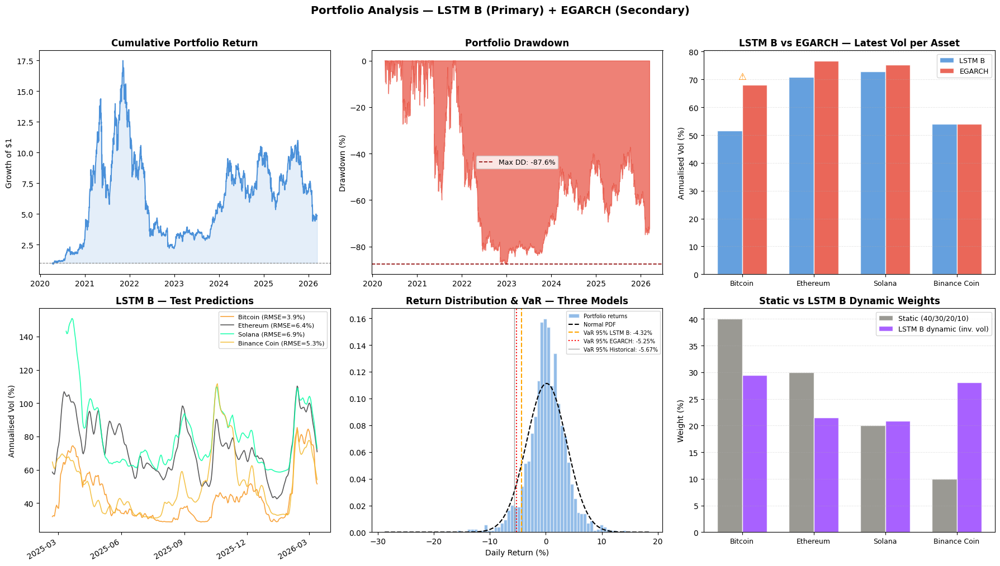

  ✓ Saved: portfolio_analysis_final.png

  ✓ Portfolio Analysis complete.

  MEAN-VARIANCE OPTIMISATION (MARKOWITZ)

  Annualised mean returns:
    Bitcoin        : +39.41%
    Ethereum       : +43.55%
    Solana         : +76.43%
    Binance Coin   : +65.23%

  Annualised volatilities:
    Bitcoin        : 58.25%
    Ethereum       : 78.48%
    Solana         : 121.14%
    Binance Coin   : 79.71%

  Generating Efficient Frontier (10,000 random portfolios)...


In [ ]:
print("\n[PA FIGURES] Generating portfolio charts...")

x_pos = np.arange(len(TICKERS))
w_bar = 0.35

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Fig 1 — Cumulative return
ax = axes[0, 0]
cum_plot = (1 + portfolio_returns / 100).cumprod()
ax.plot(cum_plot.index, cum_plot.values, color='#4A90D9', linewidth=1.4)
ax.fill_between(cum_plot.index, 1, cum_plot.values, alpha=0.15, color='#4A90D9')
ax.axhline(1, color='gray', linewidth=0.8, linestyle='--')
ax.set_title('Cumulative Portfolio Return', fontweight='bold')
ax.set_ylabel('Growth of $1')
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax.xaxis.set_major_locator(mdates.YearLocator())

# Fig 2 — Drawdown
ax = axes[0, 1]
ax.fill_between(drawdown.index, drawdown.values * 100, 0,
                color='#E74C3C', alpha=0.7)
ax.axhline(max_dd * 100, color='darkred', linewidth=1.2, linestyle='--',
           label=f'Max DD: {max_dd*100:.1f}%')
ax.set_title('Portfolio Drawdown', fontweight='bold')
ax.set_ylabel('Drawdown (%)')
ax.legend(fontsize=9)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax.xaxis.set_major_locator(mdates.YearLocator())

# Fig 3 — LSTM B vs EGARCH latest vol per asset
ax = axes[0, 2]
lv = [lstm_b_vol_latest[t] for t in TICKERS]
ev = [egarch_vol_latest[t]  for t in TICKERS]
ax.bar(x_pos - w_bar/2, lv, width=w_bar, label='LSTM B',
       color='#4A90D9', alpha=0.85, edgecolor='white')
ax.bar(x_pos + w_bar/2, ev, width=w_bar, label='EGARCH',
       color='#E74C3C', alpha=0.85, edgecolor='white')
ax.set_xticks(x_pos); ax.set_xticklabels(NAMES, fontsize=9)
ax.set_ylabel('Annualised Vol (%)')
ax.set_title('LSTM B vs EGARCH — Latest Vol per Asset', fontweight='bold')
ax.legend(fontsize=9)
for i, ticker in enumerate(TICKERS):
    if divergence_flags[ticker]:
        ax.annotate('⚠', xy=(i, max(lv[i], ev[i]) + 2),
                    ha='center', fontsize=12, color='darkorange')
ax.grid(axis='y', linestyle=':', alpha=0.5)

# Fig 4 — LSTM B test predictions
ax = axes[1, 0]
for ticker, name in CRYPTOS.items():
    res = lstm_b_results[ticker]
    ax.plot(res['test_dates'], res['y_pred'],
            color=colours[ticker], linewidth=1.2, alpha=0.85,
            label=f"{name} (RMSE={res['rmse_test']:.1f}%)")
ax.set_title('LSTM B — Test Predictions', fontweight='bold')
ax.set_ylabel('Annualised Vol (%)')
ax.legend(fontsize=8)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
plt.setp(ax.xaxis.get_majorticklabels(), rotation=30, ha='right')

# Fig 5 — Return distribution with VaR (all three models)
ax = axes[1, 1]
from scipy.stats import norm as _norm
ax.hist(portfolio_returns.values, bins=80, density=True,
        color='#4A90D9', alpha=0.6, edgecolor='white', label='Portfolio returns')
x_range = np.linspace(portfolio_returns.min(), portfolio_returns.max(), 300)
ax.plot(x_range, _norm.pdf(x_range, mean_return, std_dev),
        'k--', linewidth=1.5, label='Normal PDF')
ax.axvline(var95_lstm, color='orange', linewidth=1.5, linestyle='--',
           label=f'VaR 95% LSTM B: {var95_lstm:.2f}%')
ax.axvline(var95_egar, color='red',    linewidth=1.5, linestyle=':',
           label=f'VaR 95% EGARCH: {var95_egar:.2f}%')
ax.axvline(var95_hist, color='gray',   linewidth=1.0, linestyle='-', alpha=0.7,
           label=f'VaR 95% Historical: {var95_hist:.2f}%')
ax.set_title('Return Distribution & VaR — Three Models', fontweight='bold')
ax.set_xlabel('Daily Return (%)')
ax.legend(fontsize=7)

# Fig 6 — Static vs dynamic weights
ax = axes[1, 2]
ax.bar(x_pos - w_bar/2, WEIGHTS * 100,         width=w_bar,
       label='Static (40/30/20/10)', color='#888780', alpha=0.85, edgecolor='white')
ax.bar(x_pos + w_bar/2, dynamic_weights * 100, width=w_bar,
       label='LSTM B dynamic (inv. vol)', color='#9945FF', alpha=0.85, edgecolor='white')
ax.set_xticks(x_pos); ax.set_xticklabels(NAMES, fontsize=9)
ax.set_ylabel('Weight (%)')
ax.set_title('Static vs LSTM B Dynamic Weights', fontweight='bold')
ax.legend(fontsize=9)
ax.grid(axis='y', linestyle=':', alpha=0.5)

fig.suptitle(
    'Portfolio Analysis — LSTM B (Primary) + EGARCH (Secondary)',
    fontsize=14, fontweight='bold', y=1.01
)
plt.tight_layout()
plt.savefig('portfolio_analysis_final.png', dpi=150, bbox_inches='tight')
plt.show()
print("  ✓ Saved: portfolio_analysis_final.png")
print("\n  ✓ Portfolio Analysis complete.")

# ============================================================
# MEAN-VARIANCE OPTIMISATION (MARKOWITZ)
# ============================================================
# Finds the mathematically optimal portfolio weights by:
#   1. Maximum Sharpe Ratio  — best risk-adjusted return
#   2. Minimum Variance      — lowest possible portfolio risk
#   3. Equal Weight (1/N)    — naive benchmark
# Then plots the Efficient Frontier and shows where the
# current 40/30/20/10 weights sit relative to optimal.
# ============================================================

from scipy.optimize import minimize

print("\n" + "=" * 70)
print("  MEAN-VARIANCE OPTIMISATION (MARKOWITZ)")
print("=" * 70)

# ── MVO-1. Inputs — annualised from daily data ──
# Using full historical returns as inputs.
# Note for report: MVO is sensitive to these estimates —
# small errors in mean returns drive large weight changes.

ann_returns = returns_aligned.mean() * 365          # annualised mean return (%)
ann_cov     = returns_aligned.cov() * 365           # annualised covariance (%²)
ann_corr    = returns_aligned.corr()
n_assets    = len(TICKERS)
RF_ANN_PCT  = RF_ANNUAL * 100                       # 5% in % units

print(f"\n  Annualised mean returns:")
for name, r in ann_returns.items():
    print(f"    {name:<15}: {r:+.2f}%")
print(f"\n  Annualised volatilities:")
for name in NAMES:
    print(f"    {name:<15}: {np.sqrt(ann_cov.loc[name, name]):.2f}%")

# ── MVO-2. Portfolio metric functions ──

def port_performance(w, mean_rets, cov_matrix):
    """Returns (annualised return %, annualised vol %, Sharpe)."""
    ret = float(w @ mean_rets)
    vol = float(np.sqrt(w @ cov_matrix.values @ w))
    sharpe = (ret - RF_ANN_PCT) / vol
    return ret, vol, sharpe

def neg_sharpe(w, mean_rets, cov_matrix):
    _, _, sharpe = port_performance(w, mean_rets, cov_matrix)
    return -sharpe

def port_vol(w, cov_matrix):
    return float(np.sqrt(w @ cov_matrix.values @ w))

# Constraints: weights sum to 1, each weight 0–1 (long only)
constraints = {'type': 'eq', 'fun': lambda w: np.sum(w) - 1}
bounds      = tuple((0.0, 1.0) for _ in range(n_assets))
w0          = np.array([1 / n_assets] * n_assets)   # equal weight start

# ── MVO-3. Maximum Sharpe portfolio ──
res_sharpe = minimize(
    neg_sharpe,
    w0,
    args=(ann_returns, ann_cov),
    method='SLSQP',
    bounds=bounds,
    constraints=constraints,
    options={'ftol': 1e-12, 'maxiter': 1000}
)
w_max_sharpe = res_sharpe.x
ret_ms, vol_ms, sr_ms = port_performance(w_max_sharpe, ann_returns, ann_cov)

# ── MVO-4. Minimum variance portfolio ──
res_minvar = minimize(
    port_vol,
    w0,
    args=(ann_cov,),
    method='SLSQP',
    bounds=bounds,
    constraints=constraints,
    options={'ftol': 1e-12, 'maxiter': 1000}
)
w_min_var = res_minvar.x
ret_mv, vol_mv, sr_mv = port_performance(w_min_var, ann_returns, ann_cov)

# ── MVO-5. Equal weight (1/N) benchmark ──
w_equal = np.array([1 / n_assets] * n_assets)
ret_eq, vol_eq, sr_eq = port_performance(w_equal, ann_returns, ann_cov)

# ── MVO-6. Current 40/30/20/10 weights ──
ret_curr, vol_curr, sr_curr = port_performance(WEIGHTS, ann_returns, ann_cov)

# ── MVO-7. LSTM B dynamic weights ──
ret_dyn, vol_dyn, sr_dyn = port_performance(dynamic_weights, ann_returns, ann_cov)

# ── MVO-8. Efficient Frontier — Monte Carlo simulation ──
print("\n  Generating Efficient Frontier (10,000 random portfolios)...")
np.random.seed(42)
N_FRONTIER = 10_000

ef_weights  = np.zeros((N_FRONTIER, n_assets))
ef_returns  = np.zeros(N_FRONTIER)
ef_vols     = np.zeros(N_FRONTIER)
ef_sharpes  = np.zeros(N_FRONTIER)

for i in range(N_FRONTIER):
    w = np.random.dirichlet(np.ones(n_assets))   # random weights summing to 1
    ef_weights[i]  = w
    r, v, s        = port_performance(w, ann_returns, ann_cov)
    ef_returns[i]  = r
    ef_vols[i]     = v
    ef_sharpes[i]  = s

COMPARISON TABLE


  PORTFOLIO COMPARISON — CURRENT vs OPTIMISED

  Portfolio                     Ann. Return   Ann. Vol   Sharpe  Weights
  --------------------------------------------------------------------------------
  Max Sharpe (optimal)               63.54%      74.40%    0.787   Bit:14%  Eth:0%  Sol:18%  Bin:68%
  Min Variance                       41.84%      57.97%    0.635   Bit:91%  Eth:0%  Sol:0%  Bin:9%
  Equal Weight (1/N)                 56.16%      72.04%    0.710   Bit:25%  Eth:25%  Sol:25%  Bin:25%
  LSTM B Dynamic                     55.29%      69.69%    0.722   Bit:30%  Eth:21%  Sol:21%  Bin:28%
  Current (40/30/20/10)              50.64%      68.52%    0.666   Bit:40%  Eth:30%  Sol:20%  Bin:10%

  Sharpe improvement (current → max Sharpe): +18.1%
  Current weights sit INSIDE (suboptimal) the efficient frontier

  Generating MVO figures...


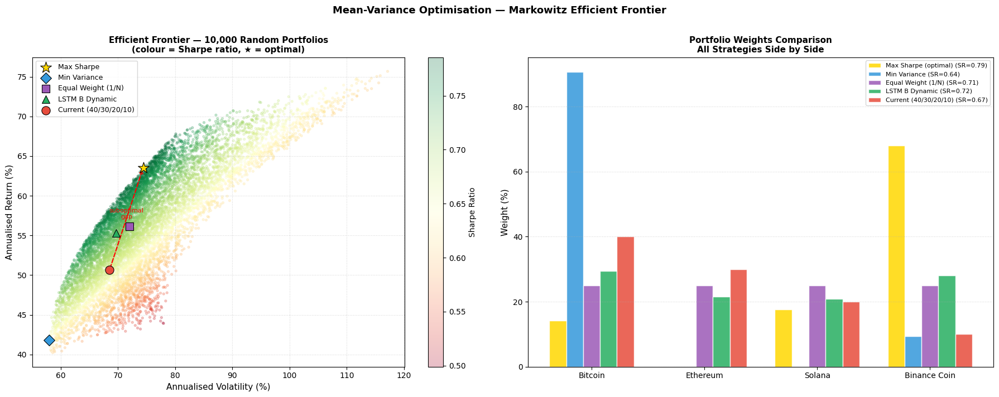

  ✓ Saved: portfolio_mvo_frontier.png

  MVO LIMITATIONS — NOTE FOR REPORT

  1. Estimation error: MVO uses historical means as expected returns.
     Crypto return means are unstable — small changes produce very
     different optimal weights. This is MVO's biggest weakness.
 
  2. Concentration risk: Max Sharpe portfolios often concentrate in
     one or two assets. Check the optimal weights above — if one
     asset dominates, note this in the report.
 
  3. Backward-looking: Optimised on 2020–present data. Past
     correlations and returns do not guarantee future performance.
 
  4. Non-normality: Crypto returns have fat tails and skewness.
     MVO assumes normality — CVaR optimisation would be more
     appropriate but is beyond standard Markowitz.
 
  5. No transaction costs or rebalancing costs modelled.
 
  Academic defence: Despite limitations, MVO remains the industry
  standard framework and provides a rigorous quantitative baseline
  against which any weight choice can be

In [ ]:
print("\n" + "=" * 70)
print("  PORTFOLIO COMPARISON — CURRENT vs OPTIMISED")
print("=" * 70)
print(f"\n  {'Portfolio':<28} {'Ann. Return':>12} {'Ann. Vol':>10} "
      f"{'Sharpe':>8}  Weights")
print("  " + "-" * 80)

portfolios = [
    ("Max Sharpe (optimal)",  w_max_sharpe, ret_ms,   vol_ms,   sr_ms),
    ("Min Variance",          w_min_var,    ret_mv,   vol_mv,   sr_mv),
    ("Equal Weight (1/N)",    w_equal,      ret_eq,   vol_eq,   sr_eq),
    ("LSTM B Dynamic",        dynamic_weights, ret_dyn, vol_dyn, sr_dyn),
    ("Current (40/30/20/10)", WEIGHTS,      ret_curr, vol_curr, sr_curr),
]

for label, w, ret, vol, sr in portfolios:
    w_str = "  ".join([f"{n[:3]}:{v*100:.0f}%" for n, v in zip(NAMES, w)])
    print(f"  {label:<28} {ret:>11.2f}%  {vol:>9.2f}%  {sr:>7.3f}   {w_str}")

# Sharpe improvement from current to optimal
sharpe_improvement = (sr_ms - sr_curr) / abs(sr_curr) * 100
print(f"\n  Sharpe improvement (current → max Sharpe): {sharpe_improvement:+.1f}%")
print(f"  Current weights sit {'INSIDE (suboptimal)' if sr_curr < sr_ms else 'ON'} the efficient frontier")

# ── MVO-10. Figures ──
print("\n  Generating MVO figures...")

fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# ── Fig Left: Efficient Frontier ──
ax = axes[0]

# Scatter — colour by Sharpe ratio
sc = ax.scatter(ef_vols, ef_returns,
                c=ef_sharpes, cmap='RdYlGn',
                alpha=0.25, s=8, zorder=1)
plt.colorbar(sc, ax=ax, label='Sharpe Ratio')

# Plot key portfolios
plot_pts = [
    (vol_ms,   ret_ms,   w_max_sharpe, 'Max Sharpe',           '*',  'gold',    220),
    (vol_mv,   ret_mv,   w_min_var,    'Min Variance',          'D',  '#3498DB', 100),
    (vol_eq,   ret_eq,   w_equal,      'Equal Weight (1/N)',    's',  '#9B59B6', 100),
    (vol_dyn,  ret_dyn,  dynamic_weights,'LSTM B Dynamic',      '^',  '#27AE60', 100),
    (vol_curr, ret_curr, WEIGHTS,      'Current (40/30/20/10)', 'o',  '#E74C3C', 120),
]

for vol_p, ret_p, _, label, marker, colour, size in plot_pts:
    ax.scatter(vol_p, ret_p, marker=marker, color=colour,
               s=size, zorder=5, label=label,
               edgecolors='black', linewidths=0.8)

# Annotate current portfolio distance from optimal
ax.annotate('',
    xy=(vol_ms, ret_ms), xytext=(vol_curr, ret_curr),
    arrowprops=dict(arrowstyle='->', color='red', lw=1.5, linestyle='dashed'))
ax.annotate('suboptimal\ngap',
    xy=((vol_ms + vol_curr)/2, (ret_ms + ret_curr)/2),
    fontsize=8, color='red', ha='center')

ax.set_xlabel('Annualised Volatility (%)', fontsize=11)
ax.set_ylabel('Annualised Return (%)',     fontsize=11)
ax.set_title('Efficient Frontier — 10,000 Random Portfolios\n'
             '(colour = Sharpe ratio, ★ = optimal)',
             fontweight='bold', fontsize=11)
ax.legend(fontsize=9, loc='upper left')
ax.grid(True, linestyle=':', alpha=0.5)

# ── Fig Right: Weight comparison bar chart ──
ax2 = axes[1]
x_w    = np.arange(n_assets)
n_port = len(portfolios)
w_bar2 = 0.15
offsets = np.linspace(-(n_port-1)/2 * w_bar2, (n_port-1)/2 * w_bar2, n_port)
bar_colours = ['gold', '#3498DB', '#9B59B6', '#27AE60', '#E74C3C']

for idx, ((label, w, *_), offset, bc) in enumerate(zip(portfolios, offsets, bar_colours)):
    ax2.bar(x_w + offset, w * 100, width=w_bar2,
            label=f"{label} (SR={portfolios[idx][4]:.2f})",
            color=bc, alpha=0.85, edgecolor='white')

ax2.set_xticks(x_w)
ax2.set_xticklabels(NAMES, fontsize=10)
ax2.set_ylabel('Weight (%)', fontsize=11)
ax2.set_title('Portfolio Weights Comparison\nAll Strategies Side by Side',
              fontweight='bold', fontsize=11)
ax2.legend(fontsize=8, loc='upper right')
ax2.grid(axis='y', linestyle=':', alpha=0.5)

fig.suptitle('Mean-Variance Optimisation — Markowitz Efficient Frontier',
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('portfolio_mvo_frontier.png', dpi=150, bbox_inches='tight')
plt.show()
print("  ✓ Saved: portfolio_mvo_frontier.png")

# ── MVO-11. Limitations note (for report) ──
print("\n" + "=" * 70)
print("  MVO LIMITATIONS — NOTE FOR REPORT")
print("=" * 70)
print("""
  1. Estimation error: MVO uses historical means as expected returns.
     Crypto return means are unstable — small changes produce very
     different optimal weights. This is MVO's biggest weakness.

  2. Concentration risk: Max Sharpe portfolios often concentrate in
     one or two assets. Check the optimal weights above — if one
     asset dominates, note this in the report.

  3. Backward-looking: Optimised on 2020–present data. Past
     correlations and returns do not guarantee future performance.

  4. Non-normality: Crypto returns have fat tails and skewness.
     MVO assumes normality — CVaR optimisation would be more
     appropriate but is beyond standard Markowitz.

  5. No transaction costs or rebalancing costs modelled.

  Academic defence: Despite limitations, MVO remains the industry
  standard framework and provides a rigorous quantitative baseline
  against which any weight choice can be evaluated.
""")
print("  ✓ MVO complete.")